# Used Car Prices CarGurus: XGBoost GPU
## Optuna Hyperparameter Optimization

## Set Up Environment, Read Data, Split Train/Validation/Test Sets

In [ ]:
from google.colab import drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install --upgrade -q wandb
!pip install xgboost==1.5.2
!pip install optuna
!pip install eli5
!pip install shap
import os
import random
import numpy as np
import warnings
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold
import joblib
from xgboost import XGBRegressor, plot_importance
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING) 
import wandb
from optuna.integration.wandb import WeightsAndBiasesCallback
from datetime import datetime, timedelta
from timeit import default_timer as timer
import pickle
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
import eli5 
from eli5.sklearn import PermutationImportance 
import webbrowser
from eli5.formatters import format_as_dataframe
import shap 
warnings.filterwarnings('ignore')
my_dpi = 96
print('\n')
!/usr/local/cuda/bin/nvcc --version
!nvidia-smi

     |████████████████████████████████| 1.8 MB 4.2 MB/s 
     |████████████████████████████████| 181 kB 69.9 MB/s 
     |████████████████████████████████| 157 kB 81.8 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
     |████████████████████████████████| 157 kB 91.3 MB/s 
     |████████████████████████████████| 157 kB 76.4 MB/s 
     |████████████████████████████████| 157 kB 76.9 MB/s 
     |████████████████████████████████| 157 kB 69.7 MB/s 
     |████████████████████████████████| 157 kB 79.5 MB/s 
     |████████████████████████████████| 157 kB 76.0 MB/s 
     |████████████████████████████████| 156 kB 70.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 173.6 MB 6.6 kB/s 
  Attempting uninstall: xgboost
    Found existing installation: xgboost 0.90
    Uninstalling xgboost-0.90:
      Successfully uninstalled xgboost-0.90
Looking in indexes: https://pypi.org/simple, https://u

In [ ]:
%cd /content/drive/MyDrive/UsedCarsCarGurus/Data/

/content/drive/MyDrive/UsedCarsCarGurus/Data


In [ ]:
# Set seed 
seed_value = 42
os.environ['UsedCarsCarGurus_xgbGPU'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

In [ ]:
# Read data
trainDF = pd.read_csv('usedCars_trainSet.csv', low_memory=False)
testDF = pd.read_csv('usedCars_testSet.csv', low_memory=False)

In [ ]:
# Define label and features
train_label = trainDF[['price']]
test_label = testDF[['price']]

train_features = trainDF.drop(columns = ['price'])
test_features = testDF.drop(columns = ['price'])

# Create dummy variables for categorical variables
train_features = pd.get_dummies(train_features, drop_first=True)
test_features = pd.get_dummies(test_features, drop_first=True)

# Extract feature names
features = train_features.columns
features = np.array(features)

# NVIDIA Tesla P100 16GB

## 100 Trials 10-Fold Cross Validation

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL


In [ ]:
# Set up wandb
wandb.login()

wandb_kwargs = {'project': 'usedCars_hpo', 'entity': 'aschultz', 
                'group': 'optuna_xgb100gpu_cv_kfold10', 
                'save_code': 'False', 'notes': 'xgb100gpu_cv_kfold10'}
wandbc = WeightsAndBiasesCallback(wandb_kwargs=wandb_kwargs, as_multirun=True)

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 

··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
WeightsAndBiasesCallback is experimental (supported from v2.9.0). The interface can change in the future.


In [ ]:
# Define number of folds for CV
kfolds = KFold(n_splits=10, shuffle=True, random_state=seed_value)

# Set up WB callbacks
@wandbc.track_in_wandb()

# Define a function for optimization of hyperparameters
def objective(trial):
    """
    Objective function to tune a `XGBoostRegressor` model.
    """
    joblib.dump(study, 'XGB_Optuna_100_GPU_wb_CV.pkl')

    # Define parameter grid
    params_xgb_optuna = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.25, 0.75),
        'gamma': trial.suggest_float('gamma', 1e-8, 9),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.3),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 30),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 3),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.05, 0.5), 
        'min_child_weight': trial.suggest_int('min_child_weight', 0, 10)
        }

    # Define model type
    model = XGBRegressor(
        objective='reg:squarederror',
        booster='gbtree', 
        tree_method='gpu_hist',    
        scale_pos_weight=1,
        use_label_encoder=False,
        random_state=seed_value,
        verbosity=0,
        **params_xgb_optuna)

    # Start timer for each trial
    start = timer()  
    
    # Perform k_folds cross validation to find lower error
    scores = -cross_val_score(model, train_features, train_label, 
                              scoring='neg_root_mean_squared_error', 
                              cv=kfolds)
    run_time = timer() - start

    # Extract best score
    rmse = np.mean(scores)
    print('- Trial RMSE:', rmse)  
    
    return rmse

track_in_wandb is experimental (supported from v3.0.0). The interface can change in the future.


In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('XGB_Optuna_100_wb_CV.pkl'):
    study = joblib.load('XGB_Optuna_100_wb_CV.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, callbacks=[wandbc])

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)
wandb.finish()

Start Time           2022-09-02 21:55:13.872415
[0]	validation_0-rmse:23169.05273
[1]	validation_0-rmse:18199.20703
[2]	validation_0-rmse:14307.36035
[3]	validation_0-rmse:11371.94824
[4]	validation_0-rmse:9102.15137
[5]	validation_0-rmse:7460.71973
[6]	validation_0-rmse:6269.16211
[7]	validation_0-rmse:5387.61670
[8]	validation_0-rmse:4744.02783
[9]	validation_0-rmse:4243.68506
[10]	validation_0-rmse:3915.06299
[11]	validation_0-rmse:3711.28101
[12]	validation_0-rmse:3537.54297
[13]	validation_0-rmse:3443.44092
[14]	validation_0-rmse:3363.85156
[15]	validation_0-rmse:3314.84912
[16]	validation_0-rmse:3265.60034
[17]	validation_0-rmse:3216.27466
[18]	validation_0-rmse:3178.38257
[19]	validation_0-rmse:3158.94800
[20]	validation_0-rmse:3109.81616
[21]	validation_0-rmse:3065.27051
[22]	validation_0-rmse:3044.87134
[23]	validation_0-rmse:3028.24707
[24]	validation_0-rmse:3011.06226
[25]	validation_0-rmse:2978.86304
[26]	validation_0-rmse:2967.84644
[27]	validation_0-rmse:2961.02026
[28]	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29613.07422
[1]	validation_0-rmse:29353.52930
[2]	validation_0-rmse:29096.12891
[3]	validation_0-rmse:28840.77344
[4]	validation_0-rmse:28587.33984
[5]	validation_0-rmse:28336.42188
[6]	validation_0-rmse:28087.83008
[7]	validation_0-rmse:27841.40430
[8]	validation_0-rmse:27597.20703
[9]	validation_0-rmse:27355.05664
[10]	validation_0-rmse:27115.65234
[11]	validation_0-rmse:26878.13867
[12]	validation_0-rmse:26642.72656
[13]	validation_0-rmse:26409.48047
[14]	validation_0-rmse:26178.32812
[15]	validation_0-rmse:25948.84766
[16]	validation_0-rmse:25722.01953
[17]	validation_0-rmse:25497.01562
[18]	validation_0-rmse:25273.76758
[19]	validation_0-rmse:25052.78711
[20]	validation_0-rmse:24833.86523
[21]	validation_0-rmse:24616.38281
[22]	validation_0-rmse:24401.40430
[23]	validation_0-rmse:24188.18945
[24]	validation_0-rmse:23976.79492
[25]	validation_0-rmse:23767.46680
[26]	validation_0-rmse:23559.94727
[27]	validation_0-rmse:23354.58203
[28]	validation_0-rmse:23150.4

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:23564.46875
[1]	validation_0-rmse:18652.62305
[2]	validation_0-rmse:14807.34473
[3]	validation_0-rmse:11841.34180
[4]	validation_0-rmse:9552.65527
[5]	validation_0-rmse:7777.11816
[6]	validation_0-rmse:6446.23877
[7]	validation_0-rmse:5449.12061
[8]	validation_0-rmse:4718.04834
[9]	validation_0-rmse:4193.70605
[10]	validation_0-rmse:3813.97485
[11]	validation_0-rmse:3566.45239
[12]	validation_0-rmse:3390.92188
[13]	validation_0-rmse:3258.41162
[14]	validation_0-rmse:3176.10400
[15]	validation_0-rmse:3112.98438
[16]	validation_0-rmse:3060.88086
[17]	validation_0-rmse:3020.86353
[18]	validation_0-rmse:2996.57715
[19]	validation_0-rmse:2977.34692
[20]	validation_0-rmse:2957.23120
[21]	validation_0-rmse:2942.38769
[22]	validation_0-rmse:2930.01514
[23]	validation_0-rmse:2920.01099
[24]	validation_0-rmse:2909.12988
[25]	validation_0-rmse:2898.81299
[26]	validation_0-rmse:2891.41235
[27]	validation_0-rmse:2883.85083
[28]	validation_0-rmse:2880.25781
[29]	validation_0-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25595.55078
[1]	validation_0-rmse:21963.04297
[2]	validation_0-rmse:18869.82617
[3]	validation_0-rmse:16248.94629
[4]	validation_0-rmse:14035.37109
[5]	validation_0-rmse:12161.05273
[6]	validation_0-rmse:10572.80859
[7]	validation_0-rmse:9252.47949
[8]	validation_0-rmse:8127.85303
[9]	validation_0-rmse:7201.27393
[10]	validation_0-rmse:6466.78272
[11]	validation_0-rmse:5839.37647
[12]	validation_0-rmse:5312.87549
[13]	validation_0-rmse:4900.22119
[14]	validation_0-rmse:4575.73633
[15]	validation_0-rmse:4309.49561
[16]	validation_0-rmse:4107.53955
[17]	validation_0-rmse:3927.49902
[18]	validation_0-rmse:3789.51733
[19]	validation_0-rmse:3680.90405
[20]	validation_0-rmse:3601.57129
[21]	validation_0-rmse:3511.03809
[22]	validation_0-rmse:3456.11377
[23]	validation_0-rmse:3409.22070
[24]	validation_0-rmse:3377.20532
[25]	validation_0-rmse:3347.37842
[26]	validation_0-rmse:3308.50855
[27]	validation_0-rmse:3288.33008
[28]	validation_0-rmse:3265.91772
[29]	validation_0

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:23497.91602
[1]	validation_0-rmse:18584.58398
[2]	validation_0-rmse:14834.38379
[3]	validation_0-rmse:11953.30762
[4]	validation_0-rmse:9775.24902
[5]	validation_0-rmse:8125.12939
[6]	validation_0-rmse:6929.08301
[7]	validation_0-rmse:6063.85498
[8]	validation_0-rmse:5457.10889
[9]	validation_0-rmse:5033.97607
[10]	validation_0-rmse:4719.52881
[11]	validation_0-rmse:4506.42383
[12]	validation_0-rmse:4363.86426
[13]	validation_0-rmse:4251.53516
[14]	validation_0-rmse:4159.56543
[15]	validation_0-rmse:4101.08936
[16]	validation_0-rmse:4044.28027
[17]	validation_0-rmse:4001.51416
[18]	validation_0-rmse:3973.63257
[19]	validation_0-rmse:3951.84204
[20]	validation_0-rmse:3893.32446
[21]	validation_0-rmse:3873.34155
[22]	validation_0-rmse:3850.36938
[23]	validation_0-rmse:3830.06250
[24]	validation_0-rmse:3800.05298
[25]	validation_0-rmse:3784.27979
[26]	validation_0-rmse:3771.42847
[27]	validation_0-rmse:3739.30786
[28]	validation_0-rmse:3718.52173
[29]	validation_0-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26735.11523
[1]	validation_0-rmse:23933.09961
[2]	validation_0-rmse:21433.94141
[3]	validation_0-rmse:19213.49805
[4]	validation_0-rmse:17229.08984
[5]	validation_0-rmse:15462.85840
[6]	validation_0-rmse:13891.64551
[7]	validation_0-rmse:12499.24805
[8]	validation_0-rmse:11269.31348
[9]	validation_0-rmse:10165.71875
[10]	validation_0-rmse:9196.90039
[11]	validation_0-rmse:8337.90918
[12]	validation_0-rmse:7577.98242
[13]	validation_0-rmse:6907.81689
[14]	validation_0-rmse:6318.89160
[15]	validation_0-rmse:5810.22461
[16]	validation_0-rmse:5361.42383
[17]	validation_0-rmse:4969.66748
[18]	validation_0-rmse:4636.36182
[19]	validation_0-rmse:4343.59082
[20]	validation_0-rmse:4095.75317
[21]	validation_0-rmse:3877.78027
[22]	validation_0-rmse:3700.34082
[23]	validation_0-rmse:3539.87573
[24]	validation_0-rmse:3410.36133
[25]	validation_0-rmse:3303.92627
[26]	validation_0-rmse:3212.15088
[27]	validation_0-rmse:3138.79175
[28]	validation_0-rmse:3071.90747
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:21435.62109
[1]	validation_0-rmse:15476.65820
[2]	validation_0-rmse:11260.06641
[3]	validation_0-rmse:8340.02734
[4]	validation_0-rmse:6321.84717
[5]	validation_0-rmse:5005.74268
[6]	validation_0-rmse:4126.90625
[7]	validation_0-rmse:3582.82983
[8]	validation_0-rmse:3264.74731
[9]	validation_0-rmse:3067.22192
[10]	validation_0-rmse:2950.66406
[11]	validation_0-rmse:2876.13452
[12]	validation_0-rmse:2827.72559
[13]	validation_0-rmse:2788.45117
[14]	validation_0-rmse:2766.59180
[15]	validation_0-rmse:2754.82593
[16]	validation_0-rmse:2737.79883
[17]	validation_0-rmse:2724.97998
[18]	validation_0-rmse:2718.73828
[19]	validation_0-rmse:2710.88623
[20]	validation_0-rmse:2707.11304
[21]	validation_0-rmse:2699.88281
[22]	validation_0-rmse:2692.51074
[23]	validation_0-rmse:2682.77197
[24]	validation_0-rmse:2676.20264
[25]	validation_0-rmse:2660.63281
[26]	validation_0-rmse:2656.65063
[27]	validation_0-rmse:2655.36157
[28]	validation_0-rmse:2649.53418
[29]	validation_0-rms

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27731.75391
[1]	validation_0-rmse:25754.52734
[2]	validation_0-rmse:23941.48242
[3]	validation_0-rmse:22256.77539
[4]	validation_0-rmse:20683.15039
[5]	validation_0-rmse:19241.91016
[6]	validation_0-rmse:17900.38477
[7]	validation_0-rmse:16662.64453
[8]	validation_0-rmse:15519.08594
[9]	validation_0-rmse:14463.71191
[10]	validation_0-rmse:13492.34863
[11]	validation_0-rmse:12594.00488
[12]	validation_0-rmse:11755.95606
[13]	validation_0-rmse:10988.87598
[14]	validation_0-rmse:10279.18164
[15]	validation_0-rmse:9621.27539
[16]	validation_0-rmse:9029.70117
[17]	validation_0-rmse:8490.37402
[18]	validation_0-rmse:7988.44922
[19]	validation_0-rmse:7522.60986
[20]	validation_0-rmse:7096.75098
[21]	validation_0-rmse:6707.18652
[22]	validation_0-rmse:6347.87451
[23]	validation_0-rmse:6020.92773
[24]	validation_0-rmse:5726.75391
[25]	validation_0-rmse:5461.28174
[26]	validation_0-rmse:5225.92188
[27]	validation_0-rmse:5003.85156
[28]	validation_0-rmse:4803.87061
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27616.98633
[1]	validation_0-rmse:25534.10742
[2]	validation_0-rmse:23616.34375
[3]	validation_0-rmse:21851.98438
[4]	validation_0-rmse:20231.69141
[5]	validation_0-rmse:18737.21289
[6]	validation_0-rmse:17360.14844
[7]	validation_0-rmse:16093.79981
[8]	validation_0-rmse:14931.56445
[9]	validation_0-rmse:13868.39844
[10]	validation_0-rmse:12888.35644
[11]	validation_0-rmse:11987.80273
[12]	validation_0-rmse:11159.88281
[13]	validation_0-rmse:10405.22852
[14]	validation_0-rmse:9714.87402
[15]	validation_0-rmse:9083.88965
[16]	validation_0-rmse:8506.01953
[17]	validation_0-rmse:7972.08789
[18]	validation_0-rmse:7486.93262
[19]	validation_0-rmse:7046.78613
[20]	validation_0-rmse:6649.20605
[21]	validation_0-rmse:6290.59814
[22]	validation_0-rmse:5968.84961
[23]	validation_0-rmse:5672.80762
[24]	validation_0-rmse:5406.70459
[25]	validation_0-rmse:5167.84277
[26]	validation_0-rmse:4954.81494
[27]	validation_0-rmse:4758.91895
[28]	validation_0-rmse:4585.40186
[29]	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27333.34766
[1]	validation_0-rmse:25015.43359
[2]	validation_0-rmse:22897.20117
[3]	validation_0-rmse:20973.26367
[4]	validation_0-rmse:19220.84961
[5]	validation_0-rmse:17616.23633
[6]	validation_0-rmse:16166.77441
[7]	validation_0-rmse:14848.90527
[8]	validation_0-rmse:13647.21289
[9]	validation_0-rmse:12556.66602
[10]	validation_0-rmse:11554.77930
[11]	validation_0-rmse:10645.98438
[12]	validation_0-rmse:9828.45019
[13]	validation_0-rmse:9090.23633
[14]	validation_0-rmse:8422.65918
[15]	validation_0-rmse:7812.11279
[16]	validation_0-rmse:7269.23145
[17]	validation_0-rmse:6783.04346
[18]	validation_0-rmse:6344.29346
[19]	validation_0-rmse:5952.12695
[20]	validation_0-rmse:5599.65283
[21]	validation_0-rmse:5283.88135
[22]	validation_0-rmse:5010.69385
[23]	validation_0-rmse:4767.20459
[24]	validation_0-rmse:4551.03418
[25]	validation_0-rmse:4364.69385
[26]	validation_0-rmse:4195.70557
[27]	validation_0-rmse:4044.38989
[28]	validation_0-rmse:3913.59741
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:23845.93945
[1]	validation_0-rmse:19081.53711
[2]	validation_0-rmse:15421.72168
[3]	validation_0-rmse:12605.94629
[4]	validation_0-rmse:10414.80176
[5]	validation_0-rmse:8771.70117
[6]	validation_0-rmse:7526.40478
[7]	validation_0-rmse:6612.00342
[8]	validation_0-rmse:5969.04834
[9]	validation_0-rmse:5509.73486
[10]	validation_0-rmse:5167.16455
[11]	validation_0-rmse:4943.84668
[12]	validation_0-rmse:4772.56885
[13]	validation_0-rmse:4640.74805
[14]	validation_0-rmse:4526.73145
[15]	validation_0-rmse:4467.06397
[16]	validation_0-rmse:4414.22461
[17]	validation_0-rmse:4371.16455
[18]	validation_0-rmse:4302.67871
[19]	validation_0-rmse:4272.15772
[20]	validation_0-rmse:4211.75293
[21]	validation_0-rmse:4181.98975
[22]	validation_0-rmse:4160.33545
[23]	validation_0-rmse:4140.98145
[24]	validation_0-rmse:4120.15039
[25]	validation_0-rmse:4098.88574
[26]	validation_0-rmse:4081.09766
[27]	validation_0-rmse:4056.85083
[28]	validation_0-rmse:4035.51807
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29034.27148
[1]	validation_0-rmse:28190.40039
[2]	validation_0-rmse:27393.89258
[3]	validation_0-rmse:26614.08398
[4]	validation_0-rmse:25837.83008
[5]	validation_0-rmse:25133.93164
[6]	validation_0-rmse:24434.47070
[7]	validation_0-rmse:23763.24023
[8]	validation_0-rmse:23141.09375
[9]	validation_0-rmse:22482.85547
[10]	validation_0-rmse:21866.75586
[11]	validation_0-rmse:21280.38477
[12]	validation_0-rmse:20684.07422
[13]	validation_0-rmse:20107.00586
[14]	validation_0-rmse:19577.52539
[15]	validation_0-rmse:19061.07812
[16]	validation_0-rmse:18549.13867
[17]	validation_0-rmse:18038.27930
[18]	validation_0-rmse:17554.30078
[19]	validation_0-rmse:17083.85156
[20]	validation_0-rmse:16629.33984
[21]	validation_0-rmse:16194.74707
[22]	validation_0-rmse:15788.75098
[23]	validation_0-rmse:15379.97070
[24]	validation_0-rmse:14980.80176
[25]	validation_0-rmse:14600.40430
[26]	validation_0-rmse:14226.14746
[27]	validation_0-rmse:13901.72656
[28]	validation_0-rmse:13571.3

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25088.98438
[1]	validation_0-rmse:21112.69727
[2]	validation_0-rmse:17810.16602
[3]	validation_0-rmse:15080.42090
[4]	validation_0-rmse:12847.93066
[5]	validation_0-rmse:10969.72168
[6]	validation_0-rmse:9422.11719
[7]	validation_0-rmse:8126.42529
[8]	validation_0-rmse:7061.66455
[9]	validation_0-rmse:6198.05664
[10]	validation_0-rmse:5538.47656
[11]	validation_0-rmse:4990.49902
[12]	validation_0-rmse:4540.70898
[13]	validation_0-rmse:4205.33691
[14]	validation_0-rmse:3930.17261
[15]	validation_0-rmse:3715.94238
[16]	validation_0-rmse:3551.88721
[17]	validation_0-rmse:3414.03613
[18]	validation_0-rmse:3322.34155
[19]	validation_0-rmse:3255.41968
[20]	validation_0-rmse:3185.08643
[21]	validation_0-rmse:3143.47900
[22]	validation_0-rmse:3110.02368
[23]	validation_0-rmse:3073.46606
[24]	validation_0-rmse:3051.02393
[25]	validation_0-rmse:3022.39233
[26]	validation_0-rmse:3003.75977
[27]	validation_0-rmse:2986.37964
[28]	validation_0-rmse:2972.98584
[29]	validation_0-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25307.11719
[1]	validation_0-rmse:21442.21484
[2]	validation_0-rmse:18199.32031
[3]	validation_0-rmse:15486.22949
[4]	validation_0-rmse:13201.42969
[5]	validation_0-rmse:11288.06738
[6]	validation_0-rmse:9712.62793
[7]	validation_0-rmse:8382.55469
[8]	validation_0-rmse:7284.52344
[9]	validation_0-rmse:6374.08301
[10]	validation_0-rmse:5629.68652
[11]	validation_0-rmse:5029.99121
[12]	validation_0-rmse:4549.75439
[13]	validation_0-rmse:4164.74121
[14]	validation_0-rmse:3878.36890
[15]	validation_0-rmse:3638.52417
[16]	validation_0-rmse:3456.03955
[17]	validation_0-rmse:3319.41162
[18]	validation_0-rmse:3209.74902
[19]	validation_0-rmse:3125.75708
[20]	validation_0-rmse:3057.58520
[21]	validation_0-rmse:3001.19092
[22]	validation_0-rmse:2957.91748
[23]	validation_0-rmse:2926.27441
[24]	validation_0-rmse:2896.79053
[25]	validation_0-rmse:2878.14648
[26]	validation_0-rmse:2858.33423
[27]	validation_0-rmse:2845.11060
[28]	validation_0-rmse:2831.48144
[29]	validation_0-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25174.52148
[1]	validation_0-rmse:21252.82617
[2]	validation_0-rmse:17981.74609
[3]	validation_0-rmse:15236.74512
[4]	validation_0-rmse:12952.45606
[5]	validation_0-rmse:11031.54394
[6]	validation_0-rmse:9455.24707
[7]	validation_0-rmse:8144.20312
[8]	validation_0-rmse:7061.77197
[9]	validation_0-rmse:6184.33398
[10]	validation_0-rmse:5483.88086
[11]	validation_0-rmse:4915.21094
[12]	validation_0-rmse:4467.16016
[13]	validation_0-rmse:4103.61865
[14]	validation_0-rmse:3822.39770
[15]	validation_0-rmse:3593.27588
[16]	validation_0-rmse:3429.29956
[17]	validation_0-rmse:3307.64233
[18]	validation_0-rmse:3207.01733
[19]	validation_0-rmse:3115.57861
[20]	validation_0-rmse:3050.41577
[21]	validation_0-rmse:3005.50269
[22]	validation_0-rmse:2963.40771
[23]	validation_0-rmse:2932.03906
[24]	validation_0-rmse:2906.10230
[25]	validation_0-rmse:2885.25684
[26]	validation_0-rmse:2870.17578
[27]	validation_0-rmse:2858.32105
[28]	validation_0-rmse:2848.48096
[29]	validation_0-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25135.72070
[1]	validation_0-rmse:21213.48438
[2]	validation_0-rmse:17920.42773
[3]	validation_0-rmse:15215.99707
[4]	validation_0-rmse:12953.25781
[5]	validation_0-rmse:11090.16406
[6]	validation_0-rmse:9564.84668
[7]	validation_0-rmse:8320.77051
[8]	validation_0-rmse:7319.11670
[9]	validation_0-rmse:6511.48779
[10]	validation_0-rmse:5870.12012
[11]	validation_0-rmse:5365.79541
[12]	validation_0-rmse:4960.41113
[13]	validation_0-rmse:4650.42529
[14]	validation_0-rmse:4397.21338
[15]	validation_0-rmse:4209.94727
[16]	validation_0-rmse:4067.59448
[17]	validation_0-rmse:3944.01904
[18]	validation_0-rmse:3846.65283
[19]	validation_0-rmse:3773.74048
[20]	validation_0-rmse:3710.62964
[21]	validation_0-rmse:3655.45630
[22]	validation_0-rmse:3616.90747
[23]	validation_0-rmse:3587.26196
[24]	validation_0-rmse:3542.45483
[25]	validation_0-rmse:3525.42773
[26]	validation_0-rmse:3489.66162
[27]	validation_0-rmse:3474.66406
[28]	validation_0-rmse:3443.66064
[29]	validation_0-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26337.86914
[1]	validation_0-rmse:23186.90430
[2]	validation_0-rmse:20478.16016
[3]	validation_0-rmse:18116.97266
[4]	validation_0-rmse:16090.03418
[5]	validation_0-rmse:14279.75098
[6]	validation_0-rmse:12816.23926
[7]	validation_0-rmse:11472.88379
[8]	validation_0-rmse:10348.35059
[9]	validation_0-rmse:9315.76172
[10]	validation_0-rmse:8388.43848
[11]	validation_0-rmse:7615.73584
[12]	validation_0-rmse:6981.11230
[13]	validation_0-rmse:6476.32178
[14]	validation_0-rmse:6040.45020
[15]	validation_0-rmse:5707.22607
[16]	validation_0-rmse:5356.60742
[17]	validation_0-rmse:5124.20117
[18]	validation_0-rmse:4929.07861
[19]	validation_0-rmse:4751.76660
[20]	validation_0-rmse:4587.35352
[21]	validation_0-rmse:4424.34082
[22]	validation_0-rmse:4309.22510
[23]	validation_0-rmse:4194.09668
[24]	validation_0-rmse:4105.00537
[25]	validation_0-rmse:4043.69922
[26]	validation_0-rmse:3998.37695
[27]	validation_0-rmse:3933.86231
[28]	validation_0-rmse:3857.54102
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:21782.67188
[1]	validation_0-rmse:16027.97656
[2]	validation_0-rmse:11867.65332
[3]	validation_0-rmse:8917.11523
[4]	validation_0-rmse:6866.77686
[5]	validation_0-rmse:5428.04053
[6]	validation_0-rmse:4507.89258
[7]	validation_0-rmse:3906.61133
[8]	validation_0-rmse:3553.44580
[9]	validation_0-rmse:3325.47510
[10]	validation_0-rmse:3174.21582
[11]	validation_0-rmse:3085.28149
[12]	validation_0-rmse:3005.12305
[13]	validation_0-rmse:2958.48804
[14]	validation_0-rmse:2918.96729
[15]	validation_0-rmse:2889.45410
[16]	validation_0-rmse:2866.85938
[17]	validation_0-rmse:2855.70166
[18]	validation_0-rmse:2844.82056
[19]	validation_0-rmse:2827.71924
[20]	validation_0-rmse:2820.81714
[21]	validation_0-rmse:2813.52661
[22]	validation_0-rmse:2795.44214
[23]	validation_0-rmse:2786.65918
[24]	validation_0-rmse:2768.78369
[25]	validation_0-rmse:2766.44360
[26]	validation_0-rmse:2758.00781
[27]	validation_0-rmse:2754.04370
[28]	validation_0-rmse:2746.44995
[29]	validation_0-rms

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24256.00000
[1]	validation_0-rmse:19736.06445
[2]	validation_0-rmse:16104.68848
[3]	validation_0-rmse:13181.30371
[4]	validation_0-rmse:10832.98144
[5]	validation_0-rmse:8976.44238
[6]	validation_0-rmse:7515.02393
[7]	validation_0-rmse:6363.57959
[8]	validation_0-rmse:5478.66797
[9]	validation_0-rmse:4818.18115
[10]	validation_0-rmse:4320.34180
[11]	validation_0-rmse:3941.96851
[12]	validation_0-rmse:3654.85767
[13]	validation_0-rmse:3441.41724
[14]	validation_0-rmse:3284.48511
[15]	validation_0-rmse:3178.22046
[16]	validation_0-rmse:3090.77002
[17]	validation_0-rmse:3031.52148
[18]	validation_0-rmse:2984.39258
[19]	validation_0-rmse:2954.53174
[20]	validation_0-rmse:2927.38477
[21]	validation_0-rmse:2901.77588
[22]	validation_0-rmse:2882.32642
[23]	validation_0-rmse:2866.50195
[24]	validation_0-rmse:2850.78564
[25]	validation_0-rmse:2840.82080
[26]	validation_0-rmse:2836.82690
[27]	validation_0-rmse:2831.15845
[28]	validation_0-rmse:2821.50342
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24490.69336
[1]	validation_0-rmse:20106.93945
[2]	validation_0-rmse:16558.41406
[3]	validation_0-rmse:13685.62305
[4]	validation_0-rmse:11359.53418
[5]	validation_0-rmse:9462.25195
[6]	validation_0-rmse:7946.79297
[7]	validation_0-rmse:6745.87842
[8]	validation_0-rmse:5791.16064
[9]	validation_0-rmse:5051.41699
[10]	validation_0-rmse:4478.32910
[11]	validation_0-rmse:4040.23877
[12]	validation_0-rmse:3721.50659
[13]	validation_0-rmse:3482.81885
[14]	validation_0-rmse:3301.01538
[15]	validation_0-rmse:3164.10278
[16]	validation_0-rmse:3071.86353
[17]	validation_0-rmse:2997.54224
[18]	validation_0-rmse:2939.95996
[19]	validation_0-rmse:2901.25806
[20]	validation_0-rmse:2867.56885
[21]	validation_0-rmse:2843.65845
[22]	validation_0-rmse:2826.18384
[23]	validation_0-rmse:2812.79761
[24]	validation_0-rmse:2796.31470
[25]	validation_0-rmse:2787.38696
[26]	validation_0-rmse:2779.25684
[27]	validation_0-rmse:2774.77441
[28]	validation_0-rmse:2763.11255
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:22804.19531
[1]	validation_0-rmse:17606.18945
[2]	validation_0-rmse:13657.27246
[3]	validation_0-rmse:10789.23438
[4]	validation_0-rmse:8697.05664
[5]	validation_0-rmse:7177.38135
[6]	validation_0-rmse:6149.06982
[7]	validation_0-rmse:5372.92383
[8]	validation_0-rmse:4876.31299
[9]	validation_0-rmse:4498.08936
[10]	validation_0-rmse:4222.05713
[11]	validation_0-rmse:4018.71118
[12]	validation_0-rmse:3884.06909
[13]	validation_0-rmse:3809.74048
[14]	validation_0-rmse:3713.28613
[15]	validation_0-rmse:3655.85352
[16]	validation_0-rmse:3610.42554
[17]	validation_0-rmse:3551.76367
[18]	validation_0-rmse:3527.28980
[19]	validation_0-rmse:3505.70898
[20]	validation_0-rmse:3487.61987
[21]	validation_0-rmse:3468.37427
[22]	validation_0-rmse:3446.77319
[23]	validation_0-rmse:3426.03174
[24]	validation_0-rmse:3416.70630
[25]	validation_0-rmse:3397.38818
[26]	validation_0-rmse:3388.30005
[27]	validation_0-rmse:3371.82861
[28]	validation_0-rmse:3347.47730
[29]	validation_0-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24532.23438
[1]	validation_0-rmse:20173.12109
[2]	validation_0-rmse:16623.28320
[3]	validation_0-rmse:13734.01758
[4]	validation_0-rmse:11391.21973
[5]	validation_0-rmse:9502.56348
[6]	validation_0-rmse:7988.92236
[7]	validation_0-rmse:6778.15430
[8]	validation_0-rmse:5830.44287
[9]	validation_0-rmse:5081.90772
[10]	validation_0-rmse:4510.58105
[11]	validation_0-rmse:4070.70068
[12]	validation_0-rmse:3736.80151
[13]	validation_0-rmse:3496.36279
[14]	validation_0-rmse:3314.37720
[15]	validation_0-rmse:3184.45361
[16]	validation_0-rmse:3078.05005
[17]	validation_0-rmse:3005.24634
[18]	validation_0-rmse:2957.46216
[19]	validation_0-rmse:2905.86353
[20]	validation_0-rmse:2873.91455
[21]	validation_0-rmse:2851.73047
[22]	validation_0-rmse:2831.92627
[23]	validation_0-rmse:2813.48975
[24]	validation_0-rmse:2798.55151
[25]	validation_0-rmse:2788.12622
[26]	validation_0-rmse:2780.12427
[27]	validation_0-rmse:2766.96509
[28]	validation_0-rmse:2757.94897
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24673.51562
[1]	validation_0-rmse:20395.22461
[2]	validation_0-rmse:16893.09180
[3]	validation_0-rmse:14028.67090
[4]	validation_0-rmse:11687.46777
[5]	validation_0-rmse:9766.69238
[6]	validation_0-rmse:8222.83203
[7]	validation_0-rmse:6967.28516
[8]	validation_0-rmse:5966.44434
[9]	validation_0-rmse:5179.39209
[10]	validation_0-rmse:4566.57031
[11]	validation_0-rmse:4082.08911
[12]	validation_0-rmse:3717.69165
[13]	validation_0-rmse:3442.87085
[14]	validation_0-rmse:3239.96436
[15]	validation_0-rmse:3082.99878
[16]	validation_0-rmse:2974.39185
[17]	validation_0-rmse:2896.02832
[18]	validation_0-rmse:2831.21680
[19]	validation_0-rmse:2784.19336
[20]	validation_0-rmse:2752.72754
[21]	validation_0-rmse:2722.58691
[22]	validation_0-rmse:2702.23804
[23]	validation_0-rmse:2679.53638
[24]	validation_0-rmse:2668.14770
[25]	validation_0-rmse:2658.33496
[26]	validation_0-rmse:2651.21313
[27]	validation_0-rmse:2644.48193
[28]	validation_0-rmse:2638.18481
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24095.24219
[1]	validation_0-rmse:19470.54102
[2]	validation_0-rmse:15772.89941
[3]	validation_0-rmse:12815.64062
[4]	validation_0-rmse:10475.13477
[5]	validation_0-rmse:8597.94043
[6]	validation_0-rmse:7129.79541
[7]	validation_0-rmse:5981.05225
[8]	validation_0-rmse:5098.04736
[9]	validation_0-rmse:4431.62500
[10]	validation_0-rmse:3937.46460
[11]	validation_0-rmse:3565.07690
[12]	validation_0-rmse:3297.22363
[13]	validation_0-rmse:3105.90771
[14]	validation_0-rmse:2973.93481
[15]	validation_0-rmse:2880.69531
[16]	validation_0-rmse:2816.53711
[17]	validation_0-rmse:2768.96973
[18]	validation_0-rmse:2729.35767
[19]	validation_0-rmse:2706.73486
[20]	validation_0-rmse:2691.18311
[21]	validation_0-rmse:2676.19385
[22]	validation_0-rmse:2664.38501
[23]	validation_0-rmse:2651.00781
[24]	validation_0-rmse:2645.50293
[25]	validation_0-rmse:2639.15894
[26]	validation_0-rmse:2633.22314
[27]	validation_0-rmse:2626.18213
[28]	validation_0-rmse:2620.65967
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:24410.09180
[1]	validation_0-rmse:19959.90234
[2]	validation_0-rmse:16359.14941
[3]	validation_0-rmse:13442.46094
[4]	validation_0-rmse:11081.35449
[5]	validation_0-rmse:9186.68945
[6]	validation_0-rmse:7665.03613
[7]	validation_0-rmse:6453.55518
[8]	validation_0-rmse:5505.21387
[9]	validation_0-rmse:4763.22070
[10]	validation_0-rmse:4199.80469
[11]	validation_0-rmse:3763.07446
[12]	validation_0-rmse:3444.30811
[13]	validation_0-rmse:3207.57007
[14]	validation_0-rmse:3034.56030
[15]	validation_0-rmse:2909.63306
[16]	validation_0-rmse:2821.63428
[17]	validation_0-rmse:2757.05640
[18]	validation_0-rmse:2711.75513
[19]	validation_0-rmse:2676.92895
[20]	validation_0-rmse:2653.34180
[21]	validation_0-rmse:2635.33374
[22]	validation_0-rmse:2619.24951
[23]	validation_0-rmse:2604.85889
[24]	validation_0-rmse:2594.28271
[25]	validation_0-rmse:2583.48584
[26]	validation_0-rmse:2575.95190
[27]	validation_0-rmse:2571.15942
[28]	validation_0-rmse:2566.23022
[29]	validation_0-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26100.63281
[1]	validation_0-rmse:22812.30078
[2]	validation_0-rmse:19963.15430
[3]	validation_0-rmse:17480.00586
[4]	validation_0-rmse:15321.44238
[5]	validation_0-rmse:13452.90723
[6]	validation_0-rmse:11832.04688
[7]	validation_0-rmse:10433.78027
[8]	validation_0-rmse:9223.50195
[9]	validation_0-rmse:8178.69287
[10]	validation_0-rmse:7284.09277
[11]	validation_0-rmse:6514.86084
[12]	validation_0-rmse:5859.75928
[13]	validation_0-rmse:5306.21094
[14]	validation_0-rmse:4833.74219
[15]	validation_0-rmse:4443.87353
[16]	validation_0-rmse:4121.07520
[17]	validation_0-rmse:3856.09521
[18]	validation_0-rmse:3638.95654
[19]	validation_0-rmse:3462.24023
[20]	validation_0-rmse:3318.68188
[21]	validation_0-rmse:3197.01294
[22]	validation_0-rmse:3101.77490
[23]	validation_0-rmse:3025.74243
[24]	validation_0-rmse:2960.91919
[25]	validation_0-rmse:2912.47583
[26]	validation_0-rmse:2871.13086
[27]	validation_0-rmse:2838.38550
[28]	validation_0-rmse:2812.25269
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:22691.64844
[1]	validation_0-rmse:17286.95312
[2]	validation_0-rmse:13228.22754
[3]	validation_0-rmse:10224.26562
[4]	validation_0-rmse:8021.88721
[5]	validation_0-rmse:6415.40332
[6]	validation_0-rmse:5239.89844
[7]	validation_0-rmse:4431.75147
[8]	validation_0-rmse:3886.16577
[9]	validation_0-rmse:3506.48389
[10]	validation_0-rmse:3278.33276
[11]	validation_0-rmse:3129.85644
[12]	validation_0-rmse:3027.85425
[13]	validation_0-rmse:2947.25439
[14]	validation_0-rmse:2894.44287
[15]	validation_0-rmse:2856.15430
[16]	validation_0-rmse:2831.78418
[17]	validation_0-rmse:2808.68018
[18]	validation_0-rmse:2791.90234
[19]	validation_0-rmse:2783.61206
[20]	validation_0-rmse:2772.27979
[21]	validation_0-rmse:2762.94922
[22]	validation_0-rmse:2753.72656
[23]	validation_0-rmse:2731.51172
[24]	validation_0-rmse:2724.76611
[25]	validation_0-rmse:2717.73267
[26]	validation_0-rmse:2713.35376
[27]	validation_0-rmse:2708.34570
[28]	validation_0-rmse:2702.36157
[29]	validation_0-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26143.14844
[1]	validation_0-rmse:22891.82422
[2]	validation_0-rmse:20053.54688
[3]	validation_0-rmse:17579.33984
[4]	validation_0-rmse:15428.30664
[5]	validation_0-rmse:13559.43555
[6]	validation_0-rmse:11934.87305
[7]	validation_0-rmse:10524.51074
[8]	validation_0-rmse:9300.76856
[9]	validation_0-rmse:8245.39551
[10]	validation_0-rmse:7339.20117
[11]	validation_0-rmse:6557.52588
[12]	validation_0-rmse:5892.88770
[13]	validation_0-rmse:5322.25391
[14]	validation_0-rmse:4844.08545
[15]	validation_0-rmse:4436.90820
[16]	validation_0-rmse:4093.78760
[17]	validation_0-rmse:3810.64233
[18]	validation_0-rmse:3579.40234
[19]	validation_0-rmse:3387.16089
[20]	validation_0-rmse:3230.29492
[21]	validation_0-rmse:3102.99536
[22]	validation_0-rmse:2997.10254
[23]	validation_0-rmse:2912.52563
[24]	validation_0-rmse:2842.52954
[25]	validation_0-rmse:2785.93774
[26]	validation_0-rmse:2743.91748
[27]	validation_0-rmse:2709.21240
[28]	validation_0-rmse:2680.61841
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26100.57227
[1]	validation_0-rmse:22819.21875
[2]	validation_0-rmse:19959.92773
[3]	validation_0-rmse:17474.16211
[4]	validation_0-rmse:15315.76660
[5]	validation_0-rmse:13441.89356
[6]	validation_0-rmse:11815.51562
[7]	validation_0-rmse:10404.02637
[8]	validation_0-rmse:9183.93262
[9]	validation_0-rmse:8130.91406
[10]	validation_0-rmse:7230.15283
[11]	validation_0-rmse:6451.80420
[12]	validation_0-rmse:5792.85889
[13]	validation_0-rmse:5228.66016
[14]	validation_0-rmse:4757.66748
[15]	validation_0-rmse:4359.34131
[16]	validation_0-rmse:4023.50220
[17]	validation_0-rmse:3748.48633
[18]	validation_0-rmse:3520.92847
[19]	validation_0-rmse:3338.19971
[20]	validation_0-rmse:3190.25244
[21]	validation_0-rmse:3069.64453
[22]	validation_0-rmse:2970.42017
[23]	validation_0-rmse:2892.58594
[24]	validation_0-rmse:2828.20483
[25]	validation_0-rmse:2774.69605
[26]	validation_0-rmse:2734.67041
[27]	validation_0-rmse:2702.06763
[28]	validation_0-rmse:2675.04102
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28169.81836
[1]	validation_0-rmse:26565.03711
[2]	validation_0-rmse:25054.46680
[3]	validation_0-rmse:23629.89062
[4]	validation_0-rmse:22287.95117
[5]	validation_0-rmse:21024.96289
[6]	validation_0-rmse:19835.46094
[7]	validation_0-rmse:18719.72266
[8]	validation_0-rmse:17668.96680
[9]	validation_0-rmse:16681.21094
[10]	validation_0-rmse:15752.23828
[11]	validation_0-rmse:14874.71582
[12]	validation_0-rmse:14051.62500
[13]	validation_0-rmse:13279.70703
[14]	validation_0-rmse:12552.45606
[15]	validation_0-rmse:11868.46094
[16]	validation_0-rmse:11226.35156
[17]	validation_0-rmse:10623.00000
[18]	validation_0-rmse:10055.91211
[19]	validation_0-rmse:9527.43457
[20]	validation_0-rmse:9028.54297
[21]	validation_0-rmse:8561.24121
[22]	validation_0-rmse:8123.22412
[23]	validation_0-rmse:7711.64844
[24]	validation_0-rmse:7330.53760
[25]	validation_0-rmse:6971.18897
[26]	validation_0-rmse:6635.14502
[27]	validation_0-rmse:6319.75293
[28]	validation_0-rmse:6027.64941
[29]	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28961.39258
[1]	validation_0-rmse:28076.13867
[2]	validation_0-rmse:27219.10938
[3]	validation_0-rmse:26388.22461
[4]	validation_0-rmse:25583.66016
[5]	validation_0-rmse:24807.06250
[6]	validation_0-rmse:24051.79297
[7]	validation_0-rmse:23319.71875
[8]	validation_0-rmse:22611.21680
[9]	validation_0-rmse:21924.47656
[10]	validation_0-rmse:21259.03711
[11]	validation_0-rmse:20614.26758
[12]	validation_0-rmse:19991.26367
[13]	validation_0-rmse:19388.18750
[14]	validation_0-rmse:18803.81055
[15]	validation_0-rmse:18237.88672
[16]	validation_0-rmse:17690.46094
[17]	validation_0-rmse:17159.99609
[18]	validation_0-rmse:16645.16602
[19]	validation_0-rmse:16148.31641
[20]	validation_0-rmse:15665.66406
[21]	validation_0-rmse:15198.05762
[22]	validation_0-rmse:14746.28418
[23]	validation_0-rmse:14309.48340
[24]	validation_0-rmse:13888.91113
[25]	validation_0-rmse:13479.90039
[26]	validation_0-rmse:13082.78809
[27]	validation_0-rmse:12698.14258
[28]	validation_0-rmse:12328.8

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28297.56836
[1]	validation_0-rmse:26805.17969
[2]	validation_0-rmse:25393.06250
[3]	validation_0-rmse:24055.76953
[4]	validation_0-rmse:22793.20898
[5]	validation_0-rmse:21599.22070
[6]	validation_0-rmse:20469.36133
[7]	validation_0-rmse:19401.17773
[8]	validation_0-rmse:18390.61719
[9]	validation_0-rmse:17437.88672
[10]	validation_0-rmse:16537.98242
[11]	validation_0-rmse:15684.78320
[12]	validation_0-rmse:14880.94336
[13]	validation_0-rmse:14118.69336
[14]	validation_0-rmse:13399.33594
[15]	validation_0-rmse:12719.62988
[16]	validation_0-rmse:12076.80176
[17]	validation_0-rmse:11471.21777
[18]	validation_0-rmse:10900.35254
[19]	validation_0-rmse:10360.48731
[20]	validation_0-rmse:9852.15137
[21]	validation_0-rmse:9371.91602
[22]	validation_0-rmse:8920.49902
[23]	validation_0-rmse:8493.79297
[24]	validation_0-rmse:8092.55713
[25]	validation_0-rmse:7713.27588
[26]	validation_0-rmse:7357.06250
[27]	validation_0-rmse:7022.54199
[28]	validation_0-rmse:6708.88525
[29]

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28380.57422
[1]	validation_0-rmse:26963.49805
[2]	validation_0-rmse:25618.58789
[3]	validation_0-rmse:24341.42383
[4]	validation_0-rmse:23131.26172
[5]	validation_0-rmse:21983.15625
[6]	validation_0-rmse:20893.25781
[7]	validation_0-rmse:19860.34375
[8]	validation_0-rmse:18879.76172
[9]	validation_0-rmse:17950.82422
[10]	validation_0-rmse:17071.54297
[11]	validation_0-rmse:16235.70898
[12]	validation_0-rmse:15445.36523
[13]	validation_0-rmse:14695.02539
[14]	validation_0-rmse:13984.16211
[15]	validation_0-rmse:13310.22266
[16]	validation_0-rmse:12670.74902
[17]	validation_0-rmse:12065.57227
[18]	validation_0-rmse:11493.59277
[19]	validation_0-rmse:10952.87109
[20]	validation_0-rmse:10440.07617
[21]	validation_0-rmse:9953.70215
[22]	validation_0-rmse:9494.55859
[23]	validation_0-rmse:9059.56543
[24]	validation_0-rmse:8646.88281
[25]	validation_0-rmse:8257.46484
[26]	validation_0-rmse:7892.35840
[27]	validation_0-rmse:7545.49365
[28]	validation_0-rmse:7219.30762
[29

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29647.24023
[1]	validation_0-rmse:29420.78906
[2]	validation_0-rmse:29196.19922
[3]	validation_0-rmse:28973.15820
[4]	validation_0-rmse:28751.72070
[5]	validation_0-rmse:28531.92383
[6]	validation_0-rmse:28313.83008
[7]	validation_0-rmse:28098.01172
[8]	validation_0-rmse:27883.49609
[9]	validation_0-rmse:27670.83984
[10]	validation_0-rmse:27459.77734
[11]	validation_0-rmse:27249.94531
[12]	validation_0-rmse:27042.22656
[13]	validation_0-rmse:26836.24219
[14]	validation_0-rmse:26631.64844
[15]	validation_0-rmse:26428.83789
[16]	validation_0-rmse:26227.28906
[17]	validation_0-rmse:26027.30078
[18]	validation_0-rmse:25828.88672
[19]	validation_0-rmse:25632.66992
[20]	validation_0-rmse:25437.34766
[21]	validation_0-rmse:25243.75977
[22]	validation_0-rmse:25051.77539
[23]	validation_0-rmse:24861.00781
[24]	validation_0-rmse:24672.43750
[25]	validation_0-rmse:24484.70117
[26]	validation_0-rmse:24298.54883
[27]	validation_0-rmse:24113.84570
[28]	validation_0-rmse:23930.3

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26689.90625
[1]	validation_0-rmse:23852.25391
[2]	validation_0-rmse:21321.70117
[3]	validation_0-rmse:19074.78516
[4]	validation_0-rmse:17075.55664
[5]	validation_0-rmse:15293.43750
[6]	validation_0-rmse:13708.16894
[7]	validation_0-rmse:12301.44043
[8]	validation_0-rmse:11056.15137
[9]	validation_0-rmse:9954.33789
[10]	validation_0-rmse:8976.22363
[11]	validation_0-rmse:8114.14014
[12]	validation_0-rmse:7356.12549
[13]	validation_0-rmse:6684.20215
[14]	validation_0-rmse:6100.15918
[15]	validation_0-rmse:5588.81152
[16]	validation_0-rmse:5140.79541
[17]	validation_0-rmse:4754.81836
[18]	validation_0-rmse:4417.70215
[19]	validation_0-rmse:4129.57227
[20]	validation_0-rmse:3882.99634
[21]	validation_0-rmse:3671.69897
[22]	validation_0-rmse:3494.69629
[23]	validation_0-rmse:3341.86328
[24]	validation_0-rmse:3216.88086
[25]	validation_0-rmse:3108.87720
[26]	validation_0-rmse:3020.27710
[27]	validation_0-rmse:2946.69434
[28]	validation_0-rmse:2886.96069
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28425.01367
[1]	validation_0-rmse:27048.33594
[2]	validation_0-rmse:25739.01562
[3]	validation_0-rmse:24496.34961
[4]	validation_0-rmse:23313.54297
[5]	validation_0-rmse:22192.28516
[6]	validation_0-rmse:21125.01562
[7]	validation_0-rmse:20109.97656
[8]	validation_0-rmse:19146.71484
[9]	validation_0-rmse:18233.20898
[10]	validation_0-rmse:17363.78125
[11]	validation_0-rmse:16538.13672
[12]	validation_0-rmse:15752.60938
[13]	validation_0-rmse:15008.75293
[14]	validation_0-rmse:14304.50195
[15]	validation_0-rmse:13635.02637
[16]	validation_0-rmse:12999.72949
[17]	validation_0-rmse:12396.62500
[18]	validation_0-rmse:11823.88867
[19]	validation_0-rmse:11282.66992
[20]	validation_0-rmse:10768.47461
[21]	validation_0-rmse:10281.00391
[22]	validation_0-rmse:9819.81543
[23]	validation_0-rmse:9385.03223
[24]	validation_0-rmse:8973.62207
[25]	validation_0-rmse:8581.84570
[26]	validation_0-rmse:8209.81348
[27]	validation_0-rmse:7858.38867
[28]	validation_0-rmse:7526.58398
[2

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26891.79883
[1]	validation_0-rmse:24220.95703
[2]	validation_0-rmse:21819.16797
[3]	validation_0-rmse:19662.88086
[4]	validation_0-rmse:17733.75391
[5]	validation_0-rmse:16001.52930
[6]	validation_0-rmse:14454.72559
[7]	validation_0-rmse:13068.86328
[8]	validation_0-rmse:11820.31445
[9]	validation_0-rmse:10713.29590
[10]	validation_0-rmse:9722.40039
[11]	validation_0-rmse:8839.36426
[12]	validation_0-rmse:8056.03760
[13]	validation_0-rmse:7361.07812
[14]	validation_0-rmse:6746.74658
[15]	validation_0-rmse:6201.26855
[16]	validation_0-rmse:5719.43506
[17]	validation_0-rmse:5296.94775
[18]	validation_0-rmse:4923.01416
[19]	validation_0-rmse:4598.91602
[20]	validation_0-rmse:4316.83105
[21]	validation_0-rmse:4073.53076
[22]	validation_0-rmse:3861.96484
[23]	validation_0-rmse:3678.98486
[24]	validation_0-rmse:3524.80103
[25]	validation_0-rmse:3394.52979
[26]	validation_0-rmse:3280.55200
[27]	validation_0-rmse:3187.24145
[28]	validation_0-rmse:3107.03003
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26169.52930
[1]	validation_0-rmse:22937.87305
[2]	validation_0-rmse:20126.63281
[3]	validation_0-rmse:17671.37695
[4]	validation_0-rmse:15530.77051
[5]	validation_0-rmse:13681.68457
[6]	validation_0-rmse:12068.29297
[7]	validation_0-rmse:10666.66504
[8]	validation_0-rmse:9447.75781
[9]	validation_0-rmse:8399.56738
[10]	validation_0-rmse:7498.17676
[11]	validation_0-rmse:6718.89844
[12]	validation_0-rmse:6049.39990
[13]	validation_0-rmse:5488.65625
[14]	validation_0-rmse:5013.23828
[15]	validation_0-rmse:4610.79004
[16]	validation_0-rmse:4263.84228
[17]	validation_0-rmse:3982.62964
[18]	validation_0-rmse:3751.38867
[19]	validation_0-rmse:3556.39062
[20]	validation_0-rmse:3403.76001
[21]	validation_0-rmse:3273.38867
[22]	validation_0-rmse:3172.51343
[23]	validation_0-rmse:3087.56885
[24]	validation_0-rmse:3020.11328
[25]	validation_0-rmse:2962.31812
[26]	validation_0-rmse:2914.44580
[27]	validation_0-rmse:2880.03101
[28]	validation_0-rmse:2850.49438
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27995.31836
[1]	validation_0-rmse:26236.77539
[2]	validation_0-rmse:24590.65234
[3]	validation_0-rmse:23056.49805
[4]	validation_0-rmse:21618.68750
[5]	validation_0-rmse:20272.18164
[6]	validation_0-rmse:19012.88477
[7]	validation_0-rmse:17835.33594
[8]	validation_0-rmse:16736.75781
[9]	validation_0-rmse:15710.31543
[10]	validation_0-rmse:14750.81152
[11]	validation_0-rmse:13853.79102
[12]	validation_0-rmse:13017.69336
[13]	validation_0-rmse:12235.42969
[14]	validation_0-rmse:11506.36035
[15]	validation_0-rmse:10825.34766
[16]	validation_0-rmse:10189.89453
[17]	validation_0-rmse:9597.31934
[18]	validation_0-rmse:9045.51562
[19]	validation_0-rmse:8532.12402
[20]	validation_0-rmse:8053.99756
[21]	validation_0-rmse:7609.10645
[22]	validation_0-rmse:7196.21338
[23]	validation_0-rmse:6811.71191
[24]	validation_0-rmse:6454.60449
[25]	validation_0-rmse:6124.81641
[26]	validation_0-rmse:5819.20508
[27]	validation_0-rmse:5538.73193
[28]	validation_0-rmse:5277.14941
[29]	va

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27121.95898
[1]	validation_0-rmse:24634.16602
[2]	validation_0-rmse:22376.89258
[3]	validation_0-rmse:20328.46289
[4]	validation_0-rmse:18483.19336
[5]	validation_0-rmse:16812.37695
[6]	validation_0-rmse:15302.54102
[7]	validation_0-rmse:13939.00391
[8]	validation_0-rmse:12705.04102
[9]	validation_0-rmse:11593.52344
[10]	validation_0-rmse:10590.65625
[11]	validation_0-rmse:9689.62109
[12]	validation_0-rmse:8878.93457
[13]	validation_0-rmse:8147.78809
[14]	validation_0-rmse:7496.42529
[15]	validation_0-rmse:6910.31445
[16]	validation_0-rmse:6389.39258
[17]	validation_0-rmse:5917.97656
[18]	validation_0-rmse:5504.45215
[19]	validation_0-rmse:5139.17090
[20]	validation_0-rmse:4814.28320
[21]	validation_0-rmse:4525.26855
[22]	validation_0-rmse:4272.74121
[23]	validation_0-rmse:4053.48364
[24]	validation_0-rmse:3862.62378
[25]	validation_0-rmse:3695.66187
[26]	validation_0-rmse:3552.04272
[27]	validation_0-rmse:3425.25146
[28]	validation_0-rmse:3317.87866
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29028.38672
[1]	validation_0-rmse:28206.33008
[2]	validation_0-rmse:27407.96680
[3]	validation_0-rmse:26632.05859
[4]	validation_0-rmse:25879.62500
[5]	validation_0-rmse:25148.85352
[6]	validation_0-rmse:24438.73242
[7]	validation_0-rmse:23749.85156
[8]	validation_0-rmse:23080.40430
[9]	validation_0-rmse:22432.27344
[10]	validation_0-rmse:21803.46484
[11]	validation_0-rmse:21190.63477
[12]	validation_0-rmse:20597.26562
[13]	validation_0-rmse:20020.82617
[14]	validation_0-rmse:19461.16992
[15]	validation_0-rmse:18917.78906
[16]	validation_0-rmse:18389.25781
[17]	validation_0-rmse:17876.68750
[18]	validation_0-rmse:17379.88477
[19]	validation_0-rmse:16897.86719
[20]	validation_0-rmse:16429.89062
[21]	validation_0-rmse:15975.14551
[22]	validation_0-rmse:15533.75586
[23]	validation_0-rmse:15105.72949
[24]	validation_0-rmse:14689.55176
[25]	validation_0-rmse:14285.23144
[26]	validation_0-rmse:13893.84766
[27]	validation_0-rmse:13514.15723
[28]	validation_0-rmse:13145.9

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28376.90625
[1]	validation_0-rmse:26956.20898
[2]	validation_0-rmse:25607.91406
[3]	validation_0-rmse:24329.07812
[4]	validation_0-rmse:23116.73242
[5]	validation_0-rmse:21966.09961
[6]	validation_0-rmse:20874.67188
[7]	validation_0-rmse:19839.46680
[8]	validation_0-rmse:18858.50586
[9]	validation_0-rmse:17927.79102
[10]	validation_0-rmse:17046.18750
[11]	validation_0-rmse:16208.94824
[12]	validation_0-rmse:15415.94336
[13]	validation_0-rmse:14665.43262
[14]	validation_0-rmse:13951.42969
[15]	validation_0-rmse:13276.88281
[16]	validation_0-rmse:12639.19434
[17]	validation_0-rmse:12034.36328
[18]	validation_0-rmse:11459.74609
[19]	validation_0-rmse:10917.49023
[20]	validation_0-rmse:10405.04688
[21]	validation_0-rmse:9918.89356
[22]	validation_0-rmse:9459.26269
[23]	validation_0-rmse:9024.95898
[24]	validation_0-rmse:8612.38574
[25]	validation_0-rmse:8224.62793
[26]	validation_0-rmse:7859.87451
[27]	validation_0-rmse:7513.88428
[28]	validation_0-rmse:7187.00098
[29

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28345.21875
[1]	validation_0-rmse:26897.09375
[2]	validation_0-rmse:25523.51758
[3]	validation_0-rmse:24222.08789
[4]	validation_0-rmse:22989.62109
[5]	validation_0-rmse:21826.74609
[6]	validation_0-rmse:20719.26172
[7]	validation_0-rmse:19669.27148
[8]	validation_0-rmse:18676.30469
[9]	validation_0-rmse:17734.66211
[10]	validation_0-rmse:16843.17578
[11]	validation_0-rmse:15998.18262
[12]	validation_0-rmse:15198.50000
[13]	validation_0-rmse:14443.45801
[14]	validation_0-rmse:13729.58301
[15]	validation_0-rmse:13054.95312
[16]	validation_0-rmse:12416.39062
[17]	validation_0-rmse:11811.25586
[18]	validation_0-rmse:11237.10938
[19]	validation_0-rmse:10697.40234
[20]	validation_0-rmse:10184.18164
[21]	validation_0-rmse:9699.94434
[22]	validation_0-rmse:9243.20019
[23]	validation_0-rmse:8812.17773
[24]	validation_0-rmse:8407.74023
[25]	validation_0-rmse:8024.45361
[26]	validation_0-rmse:7662.59961
[27]	validation_0-rmse:7320.92285
[28]	validation_0-rmse:7001.13965
[29

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27755.09180
[1]	validation_0-rmse:25788.85156
[2]	validation_0-rmse:23963.57422
[3]	validation_0-rmse:22272.71875
[4]	validation_0-rmse:20704.99023
[5]	validation_0-rmse:19246.54102
[6]	validation_0-rmse:17903.41016
[7]	validation_0-rmse:16659.67383
[8]	validation_0-rmse:15507.12598
[9]	validation_0-rmse:14439.80469
[10]	validation_0-rmse:13452.00684
[11]	validation_0-rmse:12535.50586
[12]	validation_0-rmse:11691.85156
[13]	validation_0-rmse:10913.71094
[14]	validation_0-rmse:10191.63965
[15]	validation_0-rmse:9528.49707
[16]	validation_0-rmse:8913.99316
[17]	validation_0-rmse:8347.59961
[18]	validation_0-rmse:7825.52051
[19]	validation_0-rmse:7343.05420
[20]	validation_0-rmse:6904.76221
[21]	validation_0-rmse:6503.75098
[22]	validation_0-rmse:6129.56201
[23]	validation_0-rmse:5789.84912
[24]	validation_0-rmse:5478.71973
[25]	validation_0-rmse:5192.18018
[26]	validation_0-rmse:4933.31201
[27]	validation_0-rmse:4696.85596
[28]	validation_0-rmse:4486.07520
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25709.04688
[1]	validation_0-rmse:22136.44141
[2]	validation_0-rmse:19078.31641
[3]	validation_0-rmse:16458.60156
[4]	validation_0-rmse:14209.72363
[5]	validation_0-rmse:12293.60644
[6]	validation_0-rmse:10661.30762
[7]	validation_0-rmse:9274.51172
[8]	validation_0-rmse:8094.58984
[9]	validation_0-rmse:7099.40039
[10]	validation_0-rmse:6261.77441
[11]	validation_0-rmse:5566.07129
[12]	validation_0-rmse:4986.81982
[13]	validation_0-rmse:4502.40039
[14]	validation_0-rmse:4109.78320
[15]	validation_0-rmse:3788.13769
[16]	validation_0-rmse:3532.76050
[17]	validation_0-rmse:3328.45606
[18]	validation_0-rmse:3161.54834
[19]	validation_0-rmse:3036.45166
[20]	validation_0-rmse:2934.24609
[21]	validation_0-rmse:2849.47095
[22]	validation_0-rmse:2788.54663
[23]	validation_0-rmse:2743.28125
[24]	validation_0-rmse:2706.40649
[25]	validation_0-rmse:2677.74634
[26]	validation_0-rmse:2653.36133
[27]	validation_0-rmse:2635.29492
[28]	validation_0-rmse:2619.60010
[29]	validation_0

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29845.66797
[1]	validation_0-rmse:29815.72461
[2]	validation_0-rmse:29785.84180
[3]	validation_0-rmse:29755.98242
[4]	validation_0-rmse:29726.16602
[5]	validation_0-rmse:29696.37695
[6]	validation_0-rmse:29666.58984
[7]	validation_0-rmse:29636.85352
[8]	validation_0-rmse:29607.15039
[9]	validation_0-rmse:29577.47266
[10]	validation_0-rmse:29547.83203
[11]	validation_0-rmse:29518.21094
[12]	validation_0-rmse:29488.62305
[13]	validation_0-rmse:29459.12500
[14]	validation_0-rmse:29429.58008
[15]	validation_0-rmse:29400.07812
[16]	validation_0-rmse:29370.63281
[17]	validation_0-rmse:29341.19922
[18]	validation_0-rmse:29311.75391
[19]	validation_0-rmse:29282.39258
[20]	validation_0-rmse:29253.08008
[21]	validation_0-rmse:29223.78711
[22]	validation_0-rmse:29194.52539
[23]	validation_0-rmse:29165.27344
[24]	validation_0-rmse:29136.01367
[25]	validation_0-rmse:29106.81055
[26]	validation_0-rmse:29077.66406
[27]	validation_0-rmse:29048.53711
[28]	validation_0-rmse:29019.4

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29217.73633
[1]	validation_0-rmse:28579.71484
[2]	validation_0-rmse:27950.73633
[3]	validation_0-rmse:27342.05078
[4]	validation_0-rmse:26750.79102
[5]	validation_0-rmse:26172.57422
[6]	validation_0-rmse:25601.99219
[7]	validation_0-rmse:25050.91016
[8]	validation_0-rmse:24505.78125
[9]	validation_0-rmse:23972.36328
[10]	validation_0-rmse:23453.50391
[11]	validation_0-rmse:22952.96875
[12]	validation_0-rmse:22465.03711
[13]	validation_0-rmse:21982.57617
[14]	validation_0-rmse:21512.97266
[15]	validation_0-rmse:21052.04297
[16]	validation_0-rmse:20600.83008
[17]	validation_0-rmse:20169.98633
[18]	validation_0-rmse:19746.67969
[19]	validation_0-rmse:19329.35156
[20]	validation_0-rmse:18922.47266
[21]	validation_0-rmse:18527.57031
[22]	validation_0-rmse:18142.35547
[23]	validation_0-rmse:17764.04688
[24]	validation_0-rmse:17394.82227
[25]	validation_0-rmse:17037.10352
[26]	validation_0-rmse:16684.41016
[27]	validation_0-rmse:16344.26856
[28]	validation_0-rmse:16012.8

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26461.37305
[1]	validation_0-rmse:23456.51758
[2]	validation_0-rmse:20791.98633
[3]	validation_0-rmse:18443.86719
[4]	validation_0-rmse:16378.09766
[5]	validation_0-rmse:14549.23731
[6]	validation_0-rmse:12946.74609
[7]	validation_0-rmse:11536.22363
[8]	validation_0-rmse:10318.07129
[9]	validation_0-rmse:9229.94238
[10]	validation_0-rmse:8279.39648
[11]	validation_0-rmse:7447.34473
[12]	validation_0-rmse:6727.52441
[13]	validation_0-rmse:6105.29883
[14]	validation_0-rmse:5560.42822
[15]	validation_0-rmse:5093.39062
[16]	validation_0-rmse:4690.08252
[17]	validation_0-rmse:4351.47314
[18]	validation_0-rmse:4068.14575
[19]	validation_0-rmse:3828.66724
[20]	validation_0-rmse:3630.04492
[21]	validation_0-rmse:3457.40796
[22]	validation_0-rmse:3318.24854
[23]	validation_0-rmse:3202.54248
[24]	validation_0-rmse:3106.76636
[25]	validation_0-rmse:3026.84888
[26]	validation_0-rmse:2958.73120
[27]	validation_0-rmse:2906.36548
[28]	validation_0-rmse:2861.50293
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27393.67383
[1]	validation_0-rmse:25126.02930
[2]	validation_0-rmse:23049.34375
[3]	validation_0-rmse:21151.53125
[4]	validation_0-rmse:19413.03516
[5]	validation_0-rmse:17827.99414
[6]	validation_0-rmse:16376.03613
[7]	validation_0-rmse:15048.89356
[8]	validation_0-rmse:13836.34082
[9]	validation_0-rmse:12733.17383
[10]	validation_0-rmse:11724.02930
[11]	validation_0-rmse:10805.00781
[12]	validation_0-rmse:9964.86621
[13]	validation_0-rmse:9207.14356
[14]	validation_0-rmse:8515.89941
[15]	validation_0-rmse:7890.09082
[16]	validation_0-rmse:7320.41650
[17]	validation_0-rmse:6802.62012
[18]	validation_0-rmse:6334.97559
[19]	validation_0-rmse:5915.13330
[20]	validation_0-rmse:5534.95264
[21]	validation_0-rmse:5191.85352
[22]	validation_0-rmse:4886.47607
[23]	validation_0-rmse:4615.92871
[24]	validation_0-rmse:4373.64893
[25]	validation_0-rmse:4154.25684
[26]	validation_0-rmse:3956.85400
[27]	validation_0-rmse:3786.85083
[28]	validation_0-rmse:3636.61499
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27990.53125
[1]	validation_0-rmse:26229.39062
[2]	validation_0-rmse:24578.99805
[3]	validation_0-rmse:23038.68750
[4]	validation_0-rmse:21596.57227
[5]	validation_0-rmse:20251.67773
[6]	validation_0-rmse:18993.98633
[7]	validation_0-rmse:17819.79492
[8]	validation_0-rmse:16717.22852
[9]	validation_0-rmse:15689.29883
[10]	validation_0-rmse:14731.13379
[11]	validation_0-rmse:13834.30957
[12]	validation_0-rmse:12999.37598
[13]	validation_0-rmse:12216.35156
[14]	validation_0-rmse:11486.36523
[15]	validation_0-rmse:10805.13086
[16]	validation_0-rmse:10169.74414
[17]	validation_0-rmse:9582.61426
[18]	validation_0-rmse:9033.57519
[19]	validation_0-rmse:8521.75098
[20]	validation_0-rmse:8046.19092
[21]	validation_0-rmse:7602.39160
[22]	validation_0-rmse:7191.16992
[23]	validation_0-rmse:6809.51318
[24]	validation_0-rmse:6458.25195
[25]	validation_0-rmse:6130.11182
[26]	validation_0-rmse:5828.67725
[27]	validation_0-rmse:5553.45020
[28]	validation_0-rmse:5293.67725
[29]	va

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25732.74609
[1]	validation_0-rmse:22189.47266
[2]	validation_0-rmse:19149.08594
[3]	validation_0-rmse:16562.93750
[4]	validation_0-rmse:14353.15820
[5]	validation_0-rmse:12467.42285
[6]	validation_0-rmse:10870.05859
[7]	validation_0-rmse:9525.65820
[8]	validation_0-rmse:8396.18652
[9]	validation_0-rmse:7450.17822
[10]	validation_0-rmse:6657.96436
[11]	validation_0-rmse:5996.81885
[12]	validation_0-rmse:5448.05566
[13]	validation_0-rmse:5011.88232
[14]	validation_0-rmse:4658.12939
[15]	validation_0-rmse:4367.11475
[16]	validation_0-rmse:4131.60596
[17]	validation_0-rmse:3943.26514
[18]	validation_0-rmse:3788.54199
[19]	validation_0-rmse:3669.03491
[20]	validation_0-rmse:3567.49585
[21]	validation_0-rmse:3472.28149
[22]	validation_0-rmse:3420.28467
[23]	validation_0-rmse:3342.37231
[24]	validation_0-rmse:3303.46826
[25]	validation_0-rmse:3267.11987
[26]	validation_0-rmse:3239.50439
[27]	validation_0-rmse:3218.77783
[28]	validation_0-rmse:3199.93726
[29]	validation_0

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28565.57227
[1]	validation_0-rmse:27314.73047
[2]	validation_0-rmse:26119.46289
[3]	validation_0-rmse:24976.68164
[4]	validation_0-rmse:23887.15039
[5]	validation_0-rmse:22846.62305
[6]	validation_0-rmse:21852.22656
[7]	validation_0-rmse:20902.94336
[8]	validation_0-rmse:19995.87305
[9]	validation_0-rmse:19130.60742
[10]	validation_0-rmse:18306.61328
[11]	validation_0-rmse:17517.79883
[12]	validation_0-rmse:16766.67969
[13]	validation_0-rmse:16048.77539
[14]	validation_0-rmse:15363.06055
[15]	validation_0-rmse:14708.58691
[16]	validation_0-rmse:14083.26074
[17]	validation_0-rmse:13487.23340
[18]	validation_0-rmse:12919.74609
[19]	validation_0-rmse:12377.00684
[20]	validation_0-rmse:11860.26465
[21]	validation_0-rmse:11366.93555
[22]	validation_0-rmse:10896.53516
[23]	validation_0-rmse:10448.57812
[24]	validation_0-rmse:10021.84570
[25]	validation_0-rmse:9614.44824
[26]	validation_0-rmse:9226.71191
[27]	validation_0-rmse:8857.95410
[28]	validation_0-rmse:8507.65820

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28719.79883
[1]	validation_0-rmse:27610.51367
[2]	validation_0-rmse:26543.85742
[3]	validation_0-rmse:25521.69727
[4]	validation_0-rmse:24540.11523
[5]	validation_0-rmse:23596.35742
[6]	validation_0-rmse:22689.91016
[7]	validation_0-rmse:21819.23047
[8]	validation_0-rmse:20985.60938
[9]	validation_0-rmse:20184.08008
[10]	validation_0-rmse:19413.84375
[11]	validation_0-rmse:18675.57812
[12]	validation_0-rmse:17967.07031
[13]	validation_0-rmse:17286.52148
[14]	validation_0-rmse:16634.24805
[15]	validation_0-rmse:16006.73340
[16]	validation_0-rmse:15404.93750
[17]	validation_0-rmse:14826.60547
[18]	validation_0-rmse:14272.56641
[19]	validation_0-rmse:13740.46387
[20]	validation_0-rmse:13229.68652
[21]	validation_0-rmse:12739.53125
[22]	validation_0-rmse:12270.29883
[23]	validation_0-rmse:11820.59473
[24]	validation_0-rmse:11388.09277
[25]	validation_0-rmse:10973.95019
[26]	validation_0-rmse:10576.55664
[27]	validation_0-rmse:10197.99512
[28]	validation_0-rmse:9832.31

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:29371.40430
[1]	validation_0-rmse:28875.54492
[2]	validation_0-rmse:28388.49414
[3]	validation_0-rmse:27909.36328
[4]	validation_0-rmse:27438.35938
[5]	validation_0-rmse:26975.26367
[6]	validation_0-rmse:26520.39453
[7]	validation_0-rmse:26073.96094
[8]	validation_0-rmse:25634.48242
[9]	validation_0-rmse:25202.97852
[10]	validation_0-rmse:24779.25781
[11]	validation_0-rmse:24362.66406
[12]	validation_0-rmse:23953.11914
[13]	validation_0-rmse:23551.10938
[14]	validation_0-rmse:23156.14453
[15]	validation_0-rmse:22767.15625
[16]	validation_0-rmse:22385.78906
[17]	validation_0-rmse:22011.06836
[18]	validation_0-rmse:21642.29102
[19]	validation_0-rmse:21280.20117
[20]	validation_0-rmse:20924.56836
[21]	validation_0-rmse:20574.33984
[22]	validation_0-rmse:20230.68164
[23]	validation_0-rmse:19893.10547
[24]	validation_0-rmse:19561.30664
[25]	validation_0-rmse:19235.33203
[26]	validation_0-rmse:18915.50977
[27]	validation_0-rmse:18601.38477
[28]	validation_0-rmse:18291.7

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28148.62305
[1]	validation_0-rmse:26526.18359
[2]	validation_0-rmse:24998.60352
[3]	validation_0-rmse:23559.88672
[4]	validation_0-rmse:22207.97852
[5]	validation_0-rmse:20934.81641
[6]	validation_0-rmse:19737.93945
[7]	validation_0-rmse:18612.55664
[8]	validation_0-rmse:17555.87500
[9]	validation_0-rmse:16565.09375
[10]	validation_0-rmse:15632.98535
[11]	validation_0-rmse:14755.06348
[12]	validation_0-rmse:13928.16992
[13]	validation_0-rmse:13153.47656
[14]	validation_0-rmse:12425.94922
[15]	validation_0-rmse:11742.05273
[16]	validation_0-rmse:11099.54394
[17]	validation_0-rmse:10499.14648
[18]	validation_0-rmse:9936.45703
[19]	validation_0-rmse:9406.42285
[20]	validation_0-rmse:8910.38379
[21]	validation_0-rmse:8445.11621
[22]	validation_0-rmse:8010.76221
[23]	validation_0-rmse:7604.98633
[24]	validation_0-rmse:7222.19775
[25]	validation_0-rmse:6867.91357
[26]	validation_0-rmse:6532.80469
[27]	validation_0-rmse:6221.72705
[28]	validation_0-rmse:5934.51514
[29]	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28049.20703
[1]	validation_0-rmse:26339.40039
[2]	validation_0-rmse:24735.57617
[3]	validation_0-rmse:23232.73047
[4]	validation_0-rmse:21827.22852
[5]	validation_0-rmse:20508.82422
[6]	validation_0-rmse:19270.53711
[7]	validation_0-rmse:18114.30273
[8]	validation_0-rmse:17030.66211
[9]	validation_0-rmse:16016.38867
[10]	validation_0-rmse:15068.97363
[11]	validation_0-rmse:14179.62695
[12]	validation_0-rmse:13346.54102
[13]	validation_0-rmse:12567.35644
[14]	validation_0-rmse:11834.23242
[15]	validation_0-rmse:11151.52832
[16]	validation_0-rmse:10515.44043
[17]	validation_0-rmse:9923.29981
[18]	validation_0-rmse:9364.38574
[19]	validation_0-rmse:8841.60840
[20]	validation_0-rmse:8359.46191
[21]	validation_0-rmse:7906.97705
[22]	validation_0-rmse:7488.09766
[23]	validation_0-rmse:7097.11670
[24]	validation_0-rmse:6734.52978
[25]	validation_0-rmse:6396.08740
[26]	validation_0-rmse:6083.32471
[27]	validation_0-rmse:5792.64551
[28]	validation_0-rmse:5525.55518
[29]	va

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27224.10742
[1]	validation_0-rmse:24814.98047
[2]	validation_0-rmse:22622.83008
[3]	validation_0-rmse:20631.47070
[4]	validation_0-rmse:18822.58398
[5]	validation_0-rmse:17180.21094
[6]	validation_0-rmse:15685.69922
[7]	validation_0-rmse:14331.71973
[8]	validation_0-rmse:13105.50488
[9]	validation_0-rmse:11995.79688
[10]	validation_0-rmse:10987.98828
[11]	validation_0-rmse:10075.12012
[12]	validation_0-rmse:9250.16309
[13]	validation_0-rmse:8504.87109
[14]	validation_0-rmse:7834.08154
[15]	validation_0-rmse:7227.59863
[16]	validation_0-rmse:6679.90869
[17]	validation_0-rmse:6190.94434
[18]	validation_0-rmse:5754.18164
[19]	validation_0-rmse:5359.95410
[20]	validation_0-rmse:5009.64160
[21]	validation_0-rmse:4700.67090
[22]	validation_0-rmse:4423.86816
[23]	validation_0-rmse:4181.57129
[24]	validation_0-rmse:3964.42188
[25]	validation_0-rmse:3776.85791
[26]	validation_0-rmse:3613.76904
[27]	validation_0-rmse:3472.11353
[28]	validation_0-rmse:3349.15527
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27194.68555
[1]	validation_0-rmse:24773.74414
[2]	validation_0-rmse:22571.75977
[3]	validation_0-rmse:20571.47461
[4]	validation_0-rmse:18755.10547
[5]	validation_0-rmse:17107.38867
[6]	validation_0-rmse:15618.90820
[7]	validation_0-rmse:14270.16602
[8]	validation_0-rmse:13046.28516
[9]	validation_0-rmse:11937.34570
[10]	validation_0-rmse:10929.30371
[11]	validation_0-rmse:10023.01172
[12]	validation_0-rmse:9211.43555
[13]	validation_0-rmse:8481.40820
[14]	validation_0-rmse:7822.58350
[15]	validation_0-rmse:7224.26904
[16]	validation_0-rmse:6683.15332
[17]	validation_0-rmse:6206.29150
[18]	validation_0-rmse:5779.67578
[19]	validation_0-rmse:5400.31299
[20]	validation_0-rmse:5057.84717
[21]	validation_0-rmse:4760.66406
[22]	validation_0-rmse:4500.22022
[23]	validation_0-rmse:4272.84863
[24]	validation_0-rmse:4069.97534
[25]	validation_0-rmse:3886.67212
[26]	validation_0-rmse:3728.98682
[27]	validation_0-rmse:3592.23633
[28]	validation_0-rmse:3476.21802
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27542.04688
[1]	validation_0-rmse:25402.11133
[2]	validation_0-rmse:23432.33984
[3]	validation_0-rmse:21628.77344
[4]	validation_0-rmse:19989.93750
[5]	validation_0-rmse:18467.08008
[6]	validation_0-rmse:17077.33203
[7]	validation_0-rmse:15801.63769
[8]	validation_0-rmse:14637.28613
[9]	validation_0-rmse:13582.90625
[10]	validation_0-rmse:12601.58691
[11]	validation_0-rmse:11712.57422
[12]	validation_0-rmse:10901.07812
[13]	validation_0-rmse:10156.73535
[14]	validation_0-rmse:9485.71582
[15]	validation_0-rmse:8874.53613
[16]	validation_0-rmse:8318.66406
[17]	validation_0-rmse:7816.86621
[18]	validation_0-rmse:7359.75977
[19]	validation_0-rmse:6948.46484
[20]	validation_0-rmse:6571.39502
[21]	validation_0-rmse:6235.93506
[22]	validation_0-rmse:5930.02295
[23]	validation_0-rmse:5657.84814
[24]	validation_0-rmse:5419.80029
[25]	validation_0-rmse:5199.48438
[26]	validation_0-rmse:5008.53662
[27]	validation_0-rmse:4833.98486
[28]	validation_0-rmse:4683.05518
[29]	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26522.29297
[1]	validation_0-rmse:23556.81445
[2]	validation_0-rmse:20934.76172
[3]	validation_0-rmse:18622.24023
[4]	validation_0-rmse:16578.87109
[5]	validation_0-rmse:14782.60938
[6]	validation_0-rmse:13195.56836
[7]	validation_0-rmse:11801.40039
[8]	validation_0-rmse:10573.11719
[9]	validation_0-rmse:9501.22168
[10]	validation_0-rmse:8556.50586
[11]	validation_0-rmse:7736.99609
[12]	validation_0-rmse:7024.23340
[13]	validation_0-rmse:6404.65869
[14]	validation_0-rmse:5868.01855
[15]	validation_0-rmse:5404.01074
[16]	validation_0-rmse:5011.81055
[17]	validation_0-rmse:4675.94873
[18]	validation_0-rmse:4393.34180
[19]	validation_0-rmse:4148.68701
[20]	validation_0-rmse:3949.21069
[21]	validation_0-rmse:3783.30859
[22]	validation_0-rmse:3637.72534
[23]	validation_0-rmse:3522.57007
[24]	validation_0-rmse:3420.13794
[25]	validation_0-rmse:3342.74902
[26]	validation_0-rmse:3263.14307
[27]	validation_0-rmse:3209.35547
[28]	validation_0-rmse:3161.21362
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27094.66016
[1]	validation_0-rmse:24588.08203
[2]	validation_0-rmse:22326.35938
[3]	validation_0-rmse:20286.81445
[4]	validation_0-rmse:18466.22461
[5]	validation_0-rmse:16816.98828
[6]	validation_0-rmse:15333.79883
[7]	validation_0-rmse:14000.83691
[8]	validation_0-rmse:12805.38086
[9]	validation_0-rmse:11741.42871
[10]	validation_0-rmse:10791.98242
[11]	validation_0-rmse:9948.26269
[12]	validation_0-rmse:9187.54688
[13]	validation_0-rmse:8521.40723
[14]	validation_0-rmse:7928.57520
[15]	validation_0-rmse:7408.17822
[16]	validation_0-rmse:6950.50049
[17]	validation_0-rmse:6536.21582
[18]	validation_0-rmse:6185.39258
[19]	validation_0-rmse:5874.99951
[20]	validation_0-rmse:5608.19189
[21]	validation_0-rmse:5373.32568
[22]	validation_0-rmse:5167.56934
[23]	validation_0-rmse:4994.17969
[24]	validation_0-rmse:4825.44482
[25]	validation_0-rmse:4697.48242
[26]	validation_0-rmse:4576.88818
[27]	validation_0-rmse:4479.59863
[28]	validation_0-rmse:4394.90234
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27789.06641
[1]	validation_0-rmse:25853.19336
[2]	validation_0-rmse:24054.67383
[3]	validation_0-rmse:22383.91797
[4]	validation_0-rmse:20835.54688
[5]	validation_0-rmse:19398.09961
[6]	validation_0-rmse:18063.72266
[7]	validation_0-rmse:16825.85938
[8]	validation_0-rmse:15677.44824
[9]	validation_0-rmse:14613.60547
[10]	validation_0-rmse:13629.46191
[11]	validation_0-rmse:12714.45801
[12]	validation_0-rmse:11869.83594
[13]	validation_0-rmse:11084.65039
[14]	validation_0-rmse:10359.67969
[15]	validation_0-rmse:9687.31445
[16]	validation_0-rmse:9065.06543
[17]	validation_0-rmse:8491.36914
[18]	validation_0-rmse:7962.16553
[19]	validation_0-rmse:7475.73291
[20]	validation_0-rmse:7026.25684
[21]	validation_0-rmse:6613.25244
[22]	validation_0-rmse:6233.25195
[23]	validation_0-rmse:5884.52344
[24]	validation_0-rmse:5565.22510
[25]	validation_0-rmse:5269.14893
[26]	validation_0-rmse:5002.04492
[27]	validation_0-rmse:4756.28174
[28]	validation_0-rmse:4533.90576
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27721.90430
[1]	validation_0-rmse:25720.33789
[2]	validation_0-rmse:23869.78125
[3]	validation_0-rmse:22156.31445
[4]	validation_0-rmse:20567.91211
[5]	validation_0-rmse:19098.78516
[6]	validation_0-rmse:17739.16406
[7]	validation_0-rmse:16481.24219
[8]	validation_0-rmse:15318.29004
[9]	validation_0-rmse:14242.94238
[10]	validation_0-rmse:13250.65723
[11]	validation_0-rmse:12331.17383
[12]	validation_0-rmse:11484.41992
[13]	validation_0-rmse:10702.21387
[14]	validation_0-rmse:9978.28711
[15]	validation_0-rmse:9312.55957
[16]	validation_0-rmse:8699.41309
[17]	validation_0-rmse:8137.64941
[18]	validation_0-rmse:7617.72754
[19]	validation_0-rmse:7140.43066
[20]	validation_0-rmse:6704.29004
[21]	validation_0-rmse:6303.38965
[22]	validation_0-rmse:5936.09814
[23]	validation_0-rmse:5601.52637
[24]	validation_0-rmse:5292.88525
[25]	validation_0-rmse:5011.39160
[26]	validation_0-rmse:4758.58447
[27]	validation_0-rmse:4527.47510
[28]	validation_0-rmse:4319.66504
[29]	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27782.89062
[1]	validation_0-rmse:25841.47266
[2]	validation_0-rmse:24040.73047
[3]	validation_0-rmse:22367.73047
[4]	validation_0-rmse:20812.39453
[5]	validation_0-rmse:19369.80859
[6]	validation_0-rmse:18031.16406
[7]	validation_0-rmse:16793.54102
[8]	validation_0-rmse:15644.25391
[9]	validation_0-rmse:14579.47949
[10]	validation_0-rmse:13592.28711
[11]	validation_0-rmse:12674.24902
[12]	validation_0-rmse:11826.74219
[13]	validation_0-rmse:11043.86816
[14]	validation_0-rmse:10318.57129
[15]	validation_0-rmse:9648.24902
[16]	validation_0-rmse:9028.84277
[17]	validation_0-rmse:8454.71973
[18]	validation_0-rmse:7923.15625
[19]	validation_0-rmse:7439.57129
[20]	validation_0-rmse:6988.62598
[21]	validation_0-rmse:6576.44092
[22]	validation_0-rmse:6198.24951
[23]	validation_0-rmse:5850.42773
[24]	validation_0-rmse:5534.60010
[25]	validation_0-rmse:5245.51416
[26]	validation_0-rmse:4978.53711
[27]	validation_0-rmse:4734.88525
[28]	validation_0-rmse:4513.55859
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27684.86719
[1]	validation_0-rmse:25658.20312
[2]	validation_0-rmse:23780.10938
[3]	validation_0-rmse:22045.53125
[4]	validation_0-rmse:20446.57812
[5]	validation_0-rmse:18965.42383
[6]	validation_0-rmse:17598.55859
[7]	validation_0-rmse:16334.09863
[8]	validation_0-rmse:15170.24805
[9]	validation_0-rmse:14093.28027
[10]	validation_0-rmse:13098.45996
[11]	validation_0-rmse:12178.14551
[12]	validation_0-rmse:11334.19922
[13]	validation_0-rmse:10553.31152
[14]	validation_0-rmse:9832.77441
[15]	validation_0-rmse:9170.53516
[16]	validation_0-rmse:8558.48438
[17]	validation_0-rmse:7997.78174
[18]	validation_0-rmse:7484.19922
[19]	validation_0-rmse:7011.20459
[20]	validation_0-rmse:6580.08057
[21]	validation_0-rmse:6181.32178
[22]	validation_0-rmse:5819.79150
[23]	validation_0-rmse:5489.11377
[24]	validation_0-rmse:5190.25684
[25]	validation_0-rmse:4919.92090
[26]	validation_0-rmse:4674.43213
[27]	validation_0-rmse:4452.63281
[28]	validation_0-rmse:4251.08350
[29]	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27842.01367
[1]	validation_0-rmse:25949.61133
[2]	validation_0-rmse:24187.26758
[3]	validation_0-rmse:22547.57031
[4]	validation_0-rmse:21027.50977
[5]	validation_0-rmse:19610.15039
[6]	validation_0-rmse:18294.37305
[7]	validation_0-rmse:17071.59961
[8]	validation_0-rmse:15934.39160
[9]	validation_0-rmse:14877.29297
[10]	validation_0-rmse:13897.95312
[11]	validation_0-rmse:12990.37500
[12]	validation_0-rmse:12146.21289
[13]	validation_0-rmse:11363.61231
[14]	validation_0-rmse:10637.18750
[15]	validation_0-rmse:9965.28516
[16]	validation_0-rmse:9343.71875
[17]	validation_0-rmse:8768.11133
[18]	validation_0-rmse:8236.38184
[19]	validation_0-rmse:7744.70752
[20]	validation_0-rmse:7290.95996
[21]	validation_0-rmse:6873.09033
[22]	validation_0-rmse:6487.99805
[23]	validation_0-rmse:6134.40381
[24]	validation_0-rmse:5807.43506
[25]	validation_0-rmse:5505.30273
[26]	validation_0-rmse:5231.00684
[27]	validation_0-rmse:4980.38232
[28]	validation_0-rmse:4752.23242
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28806.89648
[1]	validation_0-rmse:27780.00586
[2]	validation_0-rmse:26786.66016
[3]	validation_0-rmse:25831.24219
[4]	validation_0-rmse:24913.49414
[5]	validation_0-rmse:24026.04297
[6]	validation_0-rmse:23171.49805
[7]	validation_0-rmse:22347.59961
[8]	validation_0-rmse:21555.76758
[9]	validation_0-rmse:20792.15625
[10]	validation_0-rmse:20055.25977
[11]	validation_0-rmse:19346.07617
[12]	validation_0-rmse:18665.04688
[13]	validation_0-rmse:18008.11328
[14]	validation_0-rmse:17375.73047
[15]	validation_0-rmse:16768.19336
[16]	validation_0-rmse:16181.48535
[17]	validation_0-rmse:15617.49023
[18]	validation_0-rmse:15072.91992
[19]	validation_0-rmse:14549.73340
[20]	validation_0-rmse:14047.67090
[21]	validation_0-rmse:13562.11133
[22]	validation_0-rmse:13094.94531
[23]	validation_0-rmse:12644.49219
[24]	validation_0-rmse:12213.79492
[25]	validation_0-rmse:11797.87012
[26]	validation_0-rmse:11398.01367
[27]	validation_0-rmse:11013.31348
[28]	validation_0-rmse:10643.4

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27295.70117
[1]	validation_0-rmse:24948.05469
[2]	validation_0-rmse:22806.69141
[3]	validation_0-rmse:20853.22461
[4]	validation_0-rmse:19077.18359
[5]	validation_0-rmse:17458.63672
[6]	validation_0-rmse:15984.01269
[7]	validation_0-rmse:14640.50977
[8]	validation_0-rmse:13423.54004
[9]	validation_0-rmse:12320.78320
[10]	validation_0-rmse:11313.42676
[11]	validation_0-rmse:10398.87402
[12]	validation_0-rmse:9569.38672
[13]	validation_0-rmse:8817.10156
[14]	validation_0-rmse:8134.39258
[15]	validation_0-rmse:7522.13477
[16]	validation_0-rmse:6968.61865
[17]	validation_0-rmse:6472.57373
[18]	validation_0-rmse:6025.44287
[19]	validation_0-rmse:5619.92236
[20]	validation_0-rmse:5261.22070
[21]	validation_0-rmse:4936.35498
[22]	validation_0-rmse:4649.74121
[23]	validation_0-rmse:4397.85449
[24]	validation_0-rmse:4177.49853
[25]	validation_0-rmse:3978.35156
[26]	validation_0-rmse:3806.14380
[27]	validation_0-rmse:3654.83618
[28]	validation_0-rmse:3519.71045
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26901.37891
[1]	validation_0-rmse:24222.33008
[2]	validation_0-rmse:21820.29102
[3]	validation_0-rmse:19664.09766
[4]	validation_0-rmse:17729.63281
[5]	validation_0-rmse:15995.01465
[6]	validation_0-rmse:14441.91309
[7]	validation_0-rmse:13047.68359
[8]	validation_0-rmse:11800.77344
[9]	validation_0-rmse:10685.95117
[10]	validation_0-rmse:9695.85156
[11]	validation_0-rmse:8810.90723
[12]	validation_0-rmse:8023.35400
[13]	validation_0-rmse:7324.18750
[14]	validation_0-rmse:6702.35645
[15]	validation_0-rmse:6151.09180
[16]	validation_0-rmse:5667.87061
[17]	validation_0-rmse:5244.08057
[18]	validation_0-rmse:4869.33984
[19]	validation_0-rmse:4539.41895
[20]	validation_0-rmse:4257.03027
[21]	validation_0-rmse:4011.21167
[22]	validation_0-rmse:3795.80542
[23]	validation_0-rmse:3613.86792
[24]	validation_0-rmse:3454.04858
[25]	validation_0-rmse:3315.41382
[26]	validation_0-rmse:3202.63257
[27]	validation_0-rmse:3103.47778
[28]	validation_0-rmse:3023.62964
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27558.75586
[1]	validation_0-rmse:25426.25195
[2]	validation_0-rmse:23461.64844
[3]	validation_0-rmse:21654.91211
[4]	validation_0-rmse:19996.74609
[5]	validation_0-rmse:18466.79297
[6]	validation_0-rmse:17059.71094
[7]	validation_0-rmse:15766.91113
[8]	validation_0-rmse:14578.06250
[9]	validation_0-rmse:13487.19336
[10]	validation_0-rmse:12488.51465
[11]	validation_0-rmse:11568.35938
[12]	validation_0-rmse:10726.77246
[13]	validation_0-rmse:9953.90332
[14]	validation_0-rmse:9245.21387
[15]	validation_0-rmse:8598.43555
[16]	validation_0-rmse:8007.88770
[17]	validation_0-rmse:7467.61865
[18]	validation_0-rmse:6972.77832
[19]	validation_0-rmse:6524.15234
[20]	validation_0-rmse:6117.79053
[21]	validation_0-rmse:5747.31055
[22]	validation_0-rmse:5411.24023
[23]	validation_0-rmse:5112.45703
[24]	validation_0-rmse:4838.69238
[25]	validation_0-rmse:4588.13916
[26]	validation_0-rmse:4367.61768
[27]	validation_0-rmse:4168.52441
[28]	validation_0-rmse:3990.80713
[29]	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28644.11328
[1]	validation_0-rmse:27463.65234
[2]	validation_0-rmse:26332.98242
[3]	validation_0-rmse:25253.34375
[4]	validation_0-rmse:24220.55664
[5]	validation_0-rmse:23231.65039
[6]	validation_0-rmse:22283.06445
[7]	validation_0-rmse:21374.54297
[8]	validation_0-rmse:20502.78906
[9]	validation_0-rmse:19667.51953
[10]	validation_0-rmse:18872.03125
[11]	validation_0-rmse:18110.08008
[12]	validation_0-rmse:17377.41797
[13]	validation_0-rmse:16677.85938
[14]	validation_0-rmse:16005.27539
[15]	validation_0-rmse:15369.04102
[16]	validation_0-rmse:14754.41797
[17]	validation_0-rmse:14166.72949
[18]	validation_0-rmse:13604.00391
[19]	validation_0-rmse:13064.08301
[20]	validation_0-rmse:12551.14453
[21]	validation_0-rmse:12058.93359
[22]	validation_0-rmse:11596.82129
[23]	validation_0-rmse:11146.29394
[24]	validation_0-rmse:10715.40430
[25]	validation_0-rmse:10302.37012
[26]	validation_0-rmse:9910.48047
[27]	validation_0-rmse:9532.93652
[28]	validation_0-rmse:9173.2851

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28130.75977
[1]	validation_0-rmse:26490.24023
[2]	validation_0-rmse:24949.41797
[3]	validation_0-rmse:23499.54492
[4]	validation_0-rmse:22134.83203
[5]	validation_0-rmse:20851.83984
[6]	validation_0-rmse:19645.72852
[7]	validation_0-rmse:18516.60352
[8]	validation_0-rmse:17453.79102
[9]	validation_0-rmse:16456.31055
[10]	validation_0-rmse:15518.08789
[11]	validation_0-rmse:14634.30957
[12]	validation_0-rmse:13807.23047
[13]	validation_0-rmse:13032.40332
[14]	validation_0-rmse:12303.85547
[15]	validation_0-rmse:11619.91992
[16]	validation_0-rmse:10979.94434
[17]	validation_0-rmse:10378.24609
[18]	validation_0-rmse:9813.55664
[19]	validation_0-rmse:9288.83887
[20]	validation_0-rmse:8791.92676
[21]	validation_0-rmse:8330.80078
[22]	validation_0-rmse:7898.51807
[23]	validation_0-rmse:7494.01318
[24]	validation_0-rmse:7119.31201
[25]	validation_0-rmse:6768.42188
[26]	validation_0-rmse:6440.06787
[27]	validation_0-rmse:6131.40527
[28]	validation_0-rmse:5846.19238
[29]	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27934.99023
[1]	validation_0-rmse:26117.12500
[2]	validation_0-rmse:24421.78125
[3]	validation_0-rmse:22840.30078
[4]	validation_0-rmse:21363.34961
[5]	validation_0-rmse:19986.13086
[6]	validation_0-rmse:18700.42383
[7]	validation_0-rmse:17501.74414
[8]	validation_0-rmse:16384.14844
[9]	validation_0-rmse:15341.77246
[10]	validation_0-rmse:14373.10059
[11]	validation_0-rmse:13466.95703
[12]	validation_0-rmse:12624.39062
[13]	validation_0-rmse:11841.33203
[14]	validation_0-rmse:11109.32324
[15]	validation_0-rmse:10430.20801
[16]	validation_0-rmse:9797.24902
[17]	validation_0-rmse:9212.46680
[18]	validation_0-rmse:8666.27539
[19]	validation_0-rmse:8160.67773
[20]	validation_0-rmse:7691.20166
[21]	validation_0-rmse:7255.77051
[22]	validation_0-rmse:6851.85107
[23]	validation_0-rmse:6479.26367
[24]	validation_0-rmse:6132.09522
[25]	validation_0-rmse:5811.88525
[26]	validation_0-rmse:5518.72266
[27]	validation_0-rmse:5250.43994
[28]	validation_0-rmse:5002.22559
[29]	val

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28140.56641
[1]	validation_0-rmse:26510.12695
[2]	validation_0-rmse:24976.33398
[3]	validation_0-rmse:23535.15234
[4]	validation_0-rmse:22177.84180
[5]	validation_0-rmse:20902.79883
[6]	validation_0-rmse:19702.45898
[7]	validation_0-rmse:18573.78320
[8]	validation_0-rmse:17515.91602
[9]	validation_0-rmse:16521.16797
[10]	validation_0-rmse:15583.19238
[11]	validation_0-rmse:14703.13086
[12]	validation_0-rmse:13879.01758
[13]	validation_0-rmse:13104.72266
[14]	validation_0-rmse:12375.54394
[15]	validation_0-rmse:11691.05566
[16]	validation_0-rmse:11049.70703
[17]	validation_0-rmse:10447.28320
[18]	validation_0-rmse:9882.49023
[19]	validation_0-rmse:9350.56348
[20]	validation_0-rmse:8856.05664
[21]	validation_0-rmse:8391.98535
[22]	validation_0-rmse:7956.22656
[23]	validation_0-rmse:7551.05615
[24]	validation_0-rmse:7170.27686
[25]	validation_0-rmse:6816.86768
[26]	validation_0-rmse:6485.60059
[27]	validation_0-rmse:6175.50244
[28]	validation_0-rmse:5888.59326
[29]	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27518.41797
[1]	validation_0-rmse:25355.86133
[2]	validation_0-rmse:23364.31250
[3]	validation_0-rmse:21534.90820
[4]	validation_0-rmse:19854.08203
[5]	validation_0-rmse:18307.10156
[6]	validation_0-rmse:16889.47852
[7]	validation_0-rmse:15590.02539
[8]	validation_0-rmse:14397.01660
[9]	validation_0-rmse:13302.25684
[10]	validation_0-rmse:12305.87402
[11]	validation_0-rmse:11382.95215
[12]	validation_0-rmse:10541.47949
[13]	validation_0-rmse:9766.25879
[14]	validation_0-rmse:9059.92481
[15]	validation_0-rmse:8417.49316
[16]	validation_0-rmse:7830.89893
[17]	validation_0-rmse:7294.05957
[18]	validation_0-rmse:6803.70361
[19]	validation_0-rmse:6359.25488
[20]	validation_0-rmse:5958.00439
[21]	validation_0-rmse:5591.18311
[22]	validation_0-rmse:5262.67871
[23]	validation_0-rmse:4965.26465
[24]	validation_0-rmse:4698.57715
[25]	validation_0-rmse:4459.54688
[26]	validation_0-rmse:4246.50928
[27]	validation_0-rmse:4055.15576
[28]	validation_0-rmse:3882.29834
[29]	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26810.47266
[1]	validation_0-rmse:24070.00391
[2]	validation_0-rmse:21615.15820
[3]	validation_0-rmse:19419.16211
[4]	validation_0-rmse:17456.04102
[5]	validation_0-rmse:15699.75488
[6]	validation_0-rmse:14134.16894
[7]	validation_0-rmse:12734.00781
[8]	validation_0-rmse:11490.72266
[9]	validation_0-rmse:10384.68555
[10]	validation_0-rmse:9396.06836
[11]	validation_0-rmse:8519.86914
[12]	validation_0-rmse:7737.84424
[13]	validation_0-rmse:7051.00635
[14]	validation_0-rmse:6443.32568
[15]	validation_0-rmse:5910.19580
[16]	validation_0-rmse:5437.71680
[17]	validation_0-rmse:5027.03809
[18]	validation_0-rmse:4670.54248
[19]	validation_0-rmse:4356.25342
[20]	validation_0-rmse:4088.71484
[21]	validation_0-rmse:3854.66846
[22]	validation_0-rmse:3655.43823
[23]	validation_0-rmse:3483.22998
[24]	validation_0-rmse:3335.55176
[25]	validation_0-rmse:3215.92920
[26]	validation_0-rmse:3109.79175
[27]	validation_0-rmse:3024.72119
[28]	validation_0-rmse:2952.92578
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26310.51562
[1]	validation_0-rmse:23177.93555
[2]	validation_0-rmse:20435.05273
[3]	validation_0-rmse:18039.84180
[4]	validation_0-rmse:15931.28320
[5]	validation_0-rmse:14082.12598
[6]	validation_0-rmse:12465.76953
[7]	validation_0-rmse:11051.88574
[8]	validation_0-rmse:9819.53125
[9]	validation_0-rmse:8751.28711
[10]	validation_0-rmse:7827.60547
[11]	validation_0-rmse:7019.88818
[12]	validation_0-rmse:6329.45605
[13]	validation_0-rmse:5735.58301
[14]	validation_0-rmse:5228.68848
[15]	validation_0-rmse:4795.56738
[16]	validation_0-rmse:4430.66211
[17]	validation_0-rmse:4124.41992
[18]	validation_0-rmse:3860.38525
[19]	validation_0-rmse:3648.11035
[20]	validation_0-rmse:3473.69995
[21]	validation_0-rmse:3328.62207
[22]	validation_0-rmse:3208.66772
[23]	validation_0-rmse:3109.27173
[24]	validation_0-rmse:3033.16626
[25]	validation_0-rmse:2965.81714
[26]	validation_0-rmse:2913.07397
[27]	validation_0-rmse:2868.66650
[28]	validation_0-rmse:2829.14844
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26642.71484
[1]	validation_0-rmse:23770.37500
[2]	validation_0-rmse:21218.55664
[3]	validation_0-rmse:18942.57422
[4]	validation_0-rmse:16926.64648
[5]	validation_0-rmse:15133.94922
[6]	validation_0-rmse:13546.55469
[7]	validation_0-rmse:12140.62207
[8]	validation_0-rmse:10897.39453
[9]	validation_0-rmse:9795.96582
[10]	validation_0-rmse:8824.62109
[11]	validation_0-rmse:7962.39160
[12]	validation_0-rmse:7208.59131
[13]	validation_0-rmse:6549.69238
[14]	validation_0-rmse:5966.89502
[15]	validation_0-rmse:5463.03906
[16]	validation_0-rmse:5023.55615
[17]	validation_0-rmse:4645.42920
[18]	validation_0-rmse:4319.52783
[19]	validation_0-rmse:4038.90210
[20]	validation_0-rmse:3796.65820
[21]	validation_0-rmse:3596.51807
[22]	validation_0-rmse:3425.34644
[23]	validation_0-rmse:3279.63843
[24]	validation_0-rmse:3158.89160
[25]	validation_0-rmse:3055.64697
[26]	validation_0-rmse:2971.93481
[27]	validation_0-rmse:2901.63794
[28]	validation_0-rmse:2846.26733
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26923.64258
[1]	validation_0-rmse:24271.63281
[2]	validation_0-rmse:21896.59570
[3]	validation_0-rmse:19753.21680
[4]	validation_0-rmse:17834.37695
[5]	validation_0-rmse:16105.47656
[6]	validation_0-rmse:14557.51562
[7]	validation_0-rmse:13171.91894
[8]	validation_0-rmse:11932.16797
[9]	validation_0-rmse:10823.13477
[10]	validation_0-rmse:9827.14746
[11]	validation_0-rmse:8940.82715
[12]	validation_0-rmse:8151.32031
[13]	validation_0-rmse:7450.51318
[14]	validation_0-rmse:6820.37451
[15]	validation_0-rmse:6268.55078
[16]	validation_0-rmse:5785.18555
[17]	validation_0-rmse:5354.95264
[18]	validation_0-rmse:4976.73730
[19]	validation_0-rmse:4649.05518
[20]	validation_0-rmse:4354.75147
[21]	validation_0-rmse:4102.31787
[22]	validation_0-rmse:3887.48511
[23]	validation_0-rmse:3695.60083
[24]	validation_0-rmse:3535.35986
[25]	validation_0-rmse:3398.21851
[26]	validation_0-rmse:3282.00879
[27]	validation_0-rmse:3183.28613
[28]	validation_0-rmse:3096.36523
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27308.33398
[1]	validation_0-rmse:24964.77148
[2]	validation_0-rmse:22825.27148
[3]	validation_0-rmse:20882.88477
[4]	validation_0-rmse:19108.31055
[5]	validation_0-rmse:17491.84180
[6]	validation_0-rmse:16016.15430
[7]	validation_0-rmse:14677.39551
[8]	validation_0-rmse:13460.28906
[9]	validation_0-rmse:12355.43359
[10]	validation_0-rmse:11344.32031
[11]	validation_0-rmse:10428.03027
[12]	validation_0-rmse:9598.27734
[13]	validation_0-rmse:8847.61914
[14]	validation_0-rmse:8165.51123
[15]	validation_0-rmse:7551.96680
[16]	validation_0-rmse:6989.51562
[17]	validation_0-rmse:6482.06982
[18]	validation_0-rmse:6029.60498
[19]	validation_0-rmse:5624.76367
[20]	validation_0-rmse:5259.69727
[21]	validation_0-rmse:4933.28125
[22]	validation_0-rmse:4642.22363
[23]	validation_0-rmse:4383.53613
[24]	validation_0-rmse:4154.89795
[25]	validation_0-rmse:3954.23633
[26]	validation_0-rmse:3778.74731
[27]	validation_0-rmse:3624.86011
[28]	validation_0-rmse:3487.97534
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27281.49219
[1]	validation_0-rmse:24913.89648
[2]	validation_0-rmse:22755.34180
[3]	validation_0-rmse:20792.56641
[4]	validation_0-rmse:19002.70898
[5]	validation_0-rmse:17379.85742
[6]	validation_0-rmse:15900.86523
[7]	validation_0-rmse:14555.54981
[8]	validation_0-rmse:13333.44141
[9]	validation_0-rmse:12222.90527
[10]	validation_0-rmse:11219.25293
[11]	validation_0-rmse:10303.83008
[12]	validation_0-rmse:9475.52637
[13]	validation_0-rmse:8730.72656
[14]	validation_0-rmse:8054.77002
[15]	validation_0-rmse:7445.34717
[16]	validation_0-rmse:6898.79492
[17]	validation_0-rmse:6409.42432
[18]	validation_0-rmse:5969.24902
[19]	validation_0-rmse:5571.62939
[20]	validation_0-rmse:5221.25830
[21]	validation_0-rmse:4902.08105
[22]	validation_0-rmse:4617.89160
[23]	validation_0-rmse:4367.88965
[24]	validation_0-rmse:4144.62891
[25]	validation_0-rmse:3948.28516
[26]	validation_0-rmse:3778.41675
[27]	validation_0-rmse:3633.42725
[28]	validation_0-rmse:3501.05078
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27796.41992
[1]	validation_0-rmse:25865.18359
[2]	validation_0-rmse:24072.25586
[3]	validation_0-rmse:22408.24414
[4]	validation_0-rmse:20863.25977
[5]	validation_0-rmse:19425.12695
[6]	validation_0-rmse:18092.08984
[7]	validation_0-rmse:16859.40039
[8]	validation_0-rmse:15712.18359
[9]	validation_0-rmse:14650.74121
[10]	validation_0-rmse:13668.31055
[11]	validation_0-rmse:12751.10352
[12]	validation_0-rmse:11910.12109
[13]	validation_0-rmse:11132.18945
[14]	validation_0-rmse:10406.50879
[15]	validation_0-rmse:9738.16797
[16]	validation_0-rmse:9119.52148
[17]	validation_0-rmse:8544.26074
[18]	validation_0-rmse:8011.63037
[19]	validation_0-rmse:7530.93457
[20]	validation_0-rmse:7077.74268
[21]	validation_0-rmse:6664.56152
[22]	validation_0-rmse:6280.75049
[23]	validation_0-rmse:5933.16602
[24]	validation_0-rmse:5612.68457
[25]	validation_0-rmse:5318.49756
[26]	validation_0-rmse:5048.56689
[27]	validation_0-rmse:4804.28955
[28]	validation_0-rmse:4581.19336
[29]	vali

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26853.99023
[1]	validation_0-rmse:24141.41016
[2]	validation_0-rmse:21713.82031
[3]	validation_0-rmse:19538.61133
[4]	validation_0-rmse:17587.67773
[5]	validation_0-rmse:15842.31836
[6]	validation_0-rmse:14283.99121
[7]	validation_0-rmse:12888.33203
[8]	validation_0-rmse:11642.99609
[9]	validation_0-rmse:10529.39648
[10]	validation_0-rmse:9540.17871
[11]	validation_0-rmse:8659.45801
[12]	validation_0-rmse:7874.54346
[13]	validation_0-rmse:7180.26465
[14]	validation_0-rmse:6564.69238
[15]	validation_0-rmse:6021.56689
[16]	validation_0-rmse:5544.25098
[17]	validation_0-rmse:5130.80762
[18]	validation_0-rmse:4762.62891
[19]	validation_0-rmse:4446.29834
[20]	validation_0-rmse:4172.56055
[21]	validation_0-rmse:3935.01758
[22]	validation_0-rmse:3732.06006
[23]	validation_0-rmse:3558.66797
[24]	validation_0-rmse:3408.91992
[25]	validation_0-rmse:3278.47632
[26]	validation_0-rmse:3173.05054
[27]	validation_0-rmse:3082.77856
[28]	validation_0-rmse:3005.86035
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25937.49219
[1]	validation_0-rmse:22529.05859
[2]	validation_0-rmse:19578.44531
[3]	validation_0-rmse:17041.06641
[4]	validation_0-rmse:14845.32519
[5]	validation_0-rmse:12950.35840
[6]	validation_0-rmse:11316.21484
[7]	validation_0-rmse:9916.95606
[8]	validation_0-rmse:8716.91406
[9]	validation_0-rmse:7694.32812
[10]	validation_0-rmse:6814.85645
[11]	validation_0-rmse:6073.45117
[12]	validation_0-rmse:5446.26367
[13]	validation_0-rmse:4928.11963
[14]	validation_0-rmse:4489.42578
[15]	validation_0-rmse:4131.41309
[16]	validation_0-rmse:3826.38184
[17]	validation_0-rmse:3576.98242
[18]	validation_0-rmse:3381.60547
[19]	validation_0-rmse:3223.55664
[20]	validation_0-rmse:3099.26514
[21]	validation_0-rmse:2995.24463
[22]	validation_0-rmse:2915.99243
[23]	validation_0-rmse:2849.53174
[24]	validation_0-rmse:2799.05469
[25]	validation_0-rmse:2760.16675
[26]	validation_0-rmse:2727.55542
[27]	validation_0-rmse:2701.66357
[28]	validation_0-rmse:2678.74780
[29]	validation_0

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27411.23633
[1]	validation_0-rmse:25157.33984
[2]	validation_0-rmse:23093.39258
[3]	validation_0-rmse:21201.25586
[4]	validation_0-rmse:19474.14648
[5]	validation_0-rmse:17893.14844
[6]	validation_0-rmse:16445.64844
[7]	validation_0-rmse:15121.77832
[8]	validation_0-rmse:13911.48438
[9]	validation_0-rmse:12807.28711
[10]	validation_0-rmse:11800.72168
[11]	validation_0-rmse:10878.29394
[12]	validation_0-rmse:10041.74121
[13]	validation_0-rmse:9276.00391
[14]	validation_0-rmse:8579.92383
[15]	validation_0-rmse:7946.02588
[16]	validation_0-rmse:7369.07764
[17]	validation_0-rmse:6846.92725
[18]	validation_0-rmse:6375.09131
[19]	validation_0-rmse:5950.50537
[20]	validation_0-rmse:5565.49561
[21]	validation_0-rmse:5220.21875
[22]	validation_0-rmse:4909.03613
[23]	validation_0-rmse:4631.16895
[24]	validation_0-rmse:4380.18701
[25]	validation_0-rmse:4153.61914
[26]	validation_0-rmse:3957.32446
[27]	validation_0-rmse:3785.28149
[28]	validation_0-rmse:3630.22266
[29]	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26586.30078
[1]	validation_0-rmse:23667.68945
[2]	validation_0-rmse:21079.07422
[3]	validation_0-rmse:18782.91797
[4]	validation_0-rmse:16758.21875
[5]	validation_0-rmse:14959.06445
[6]	validation_0-rmse:13371.95606
[7]	validation_0-rmse:11965.53320
[8]	validation_0-rmse:10716.83301
[9]	validation_0-rmse:9626.56445
[10]	validation_0-rmse:8663.75391
[11]	validation_0-rmse:7819.03174
[12]	validation_0-rmse:7082.54736
[13]	validation_0-rmse:6434.03369
[14]	validation_0-rmse:5876.38867
[15]	validation_0-rmse:5385.21436
[16]	validation_0-rmse:4965.31152
[17]	validation_0-rmse:4601.71338
[18]	validation_0-rmse:4286.55469
[19]	validation_0-rmse:4023.48975
[20]	validation_0-rmse:3798.06909
[21]	validation_0-rmse:3606.34937
[22]	validation_0-rmse:3445.43115
[23]	validation_0-rmse:3310.79712
[24]	validation_0-rmse:3201.09814
[25]	validation_0-rmse:3111.03003
[26]	validation_0-rmse:3032.28198
[27]	validation_0-rmse:2972.48682
[28]	validation_0-rmse:2921.16772
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27137.30664
[1]	validation_0-rmse:24647.29102
[2]	validation_0-rmse:22395.48242
[3]	validation_0-rmse:20354.18359
[4]	validation_0-rmse:18505.34961
[5]	validation_0-rmse:16833.04102
[6]	validation_0-rmse:15325.38574
[7]	validation_0-rmse:13958.62012
[8]	validation_0-rmse:12723.98144
[9]	validation_0-rmse:11606.72461
[10]	validation_0-rmse:10602.73242
[11]	validation_0-rmse:9696.01562
[12]	validation_0-rmse:8877.26758
[13]	validation_0-rmse:8142.92773
[14]	validation_0-rmse:7480.40576
[15]	validation_0-rmse:6888.49902
[16]	validation_0-rmse:6362.23340
[17]	validation_0-rmse:5895.37695
[18]	validation_0-rmse:5474.06982
[19]	validation_0-rmse:5103.04834
[20]	validation_0-rmse:4777.14893
[21]	validation_0-rmse:4487.55322
[22]	validation_0-rmse:4234.33887
[23]	validation_0-rmse:4011.35059
[24]	validation_0-rmse:3814.62354
[25]	validation_0-rmse:3640.61597
[26]	validation_0-rmse:3494.28369
[27]	validation_0-rmse:3365.86231
[28]	validation_0-rmse:3254.08984
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25410.00977
[1]	validation_0-rmse:21597.92383
[2]	validation_0-rmse:18378.90625
[3]	validation_0-rmse:15663.09180
[4]	validation_0-rmse:13371.18262
[5]	validation_0-rmse:11441.82617
[6]	validation_0-rmse:9827.41309
[7]	validation_0-rmse:8476.69824
[8]	validation_0-rmse:7352.17773
[9]	validation_0-rmse:6414.80859
[10]	validation_0-rmse:5649.20752
[11]	validation_0-rmse:5018.90430
[12]	validation_0-rmse:4505.90137
[13]	validation_0-rmse:4094.96533
[14]	validation_0-rmse:3762.04614
[15]	validation_0-rmse:3502.40479
[16]	validation_0-rmse:3299.94678
[17]	validation_0-rmse:3144.24292
[18]	validation_0-rmse:3025.53906
[19]	validation_0-rmse:2933.93481
[20]	validation_0-rmse:2866.79175
[21]	validation_0-rmse:2815.87329
[22]	validation_0-rmse:2772.17798
[23]	validation_0-rmse:2738.15576
[24]	validation_0-rmse:2713.21924
[25]	validation_0-rmse:2688.76856
[26]	validation_0-rmse:2671.39429
[27]	validation_0-rmse:2656.31592
[28]	validation_0-rmse:2645.45093
[29]	validation_0-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27091.32227
[1]	validation_0-rmse:24572.89844
[2]	validation_0-rmse:22293.35742
[3]	validation_0-rmse:20241.21875
[4]	validation_0-rmse:18381.02344
[5]	validation_0-rmse:16699.45898
[6]	validation_0-rmse:15178.87891
[7]	validation_0-rmse:13811.01562
[8]	validation_0-rmse:12575.24707
[9]	validation_0-rmse:11465.17676
[10]	validation_0-rmse:10461.47363
[11]	validation_0-rmse:9557.42969
[12]	validation_0-rmse:8747.61523
[13]	validation_0-rmse:8020.22900
[14]	validation_0-rmse:7370.34131
[15]	validation_0-rmse:6789.19678
[16]	validation_0-rmse:6262.54980
[17]	validation_0-rmse:5793.43311
[18]	validation_0-rmse:5382.27441
[19]	validation_0-rmse:5018.77978
[20]	validation_0-rmse:4695.77734
[21]	validation_0-rmse:4410.56885
[22]	validation_0-rmse:4163.46680
[23]	validation_0-rmse:3947.50244
[24]	validation_0-rmse:3762.09644
[25]	validation_0-rmse:3599.60815
[26]	validation_0-rmse:3459.07739
[27]	validation_0-rmse:3336.53003
[28]	validation_0-rmse:3230.06616
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26346.10938
[1]	validation_0-rmse:23242.45117
[2]	validation_0-rmse:20515.08789
[3]	validation_0-rmse:18119.71484
[4]	validation_0-rmse:16023.10840
[5]	validation_0-rmse:14190.74414
[6]	validation_0-rmse:12585.79981
[7]	validation_0-rmse:11181.15625
[8]	validation_0-rmse:9949.13867
[9]	validation_0-rmse:8874.08301
[10]	validation_0-rmse:7943.30176
[11]	validation_0-rmse:7137.31103
[12]	validation_0-rmse:6443.72559
[13]	validation_0-rmse:5841.91406
[14]	validation_0-rmse:5330.43408
[15]	validation_0-rmse:4880.81201
[16]	validation_0-rmse:4504.41553
[17]	validation_0-rmse:4195.16455
[18]	validation_0-rmse:3930.95825
[19]	validation_0-rmse:3703.80273
[20]	validation_0-rmse:3518.23853
[21]	validation_0-rmse:3365.01538
[22]	validation_0-rmse:3234.98071
[23]	validation_0-rmse:3128.82105
[24]	validation_0-rmse:3041.35522
[25]	validation_0-rmse:2969.72852
[26]	validation_0-rmse:2914.90918
[27]	validation_0-rmse:2872.92993
[28]	validation_0-rmse:2834.91235
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27028.36914
[1]	validation_0-rmse:24459.06641
[2]	validation_0-rmse:22140.79102
[3]	validation_0-rmse:20058.15234
[4]	validation_0-rmse:18177.68945
[5]	validation_0-rmse:16478.31250
[6]	validation_0-rmse:14945.58594
[7]	validation_0-rmse:13573.82812
[8]	validation_0-rmse:12338.86719
[9]	validation_0-rmse:11229.94043
[10]	validation_0-rmse:10227.67188
[11]	validation_0-rmse:9327.97656
[12]	validation_0-rmse:8524.87598
[13]	validation_0-rmse:7803.20801
[14]	validation_0-rmse:7159.53223
[15]	validation_0-rmse:6587.69629
[16]	validation_0-rmse:6074.85303
[17]	validation_0-rmse:5622.64209
[18]	validation_0-rmse:5221.93262
[19]	validation_0-rmse:4871.49023
[20]	validation_0-rmse:4561.03467
[21]	validation_0-rmse:4288.02539
[22]	validation_0-rmse:4050.91089
[23]	validation_0-rmse:3845.66455
[24]	validation_0-rmse:3668.18506
[25]	validation_0-rmse:3515.60376
[26]	validation_0-rmse:3384.31226
[27]	validation_0-rmse:3269.94775
[28]	validation_0-rmse:3170.47437
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27355.18750
[1]	validation_0-rmse:25035.71289
[2]	validation_0-rmse:22920.26758
[3]	validation_0-rmse:20987.87305
[4]	validation_0-rmse:19223.30469
[5]	validation_0-rmse:17615.76953
[6]	validation_0-rmse:16152.13379
[7]	validation_0-rmse:14817.47461
[8]	validation_0-rmse:13600.69336
[9]	validation_0-rmse:12489.95996
[10]	validation_0-rmse:11482.87988
[11]	validation_0-rmse:10565.54688
[12]	validation_0-rmse:9731.60254
[13]	validation_0-rmse:8973.49805
[14]	validation_0-rmse:8283.82519
[15]	validation_0-rmse:7662.25635
[16]	validation_0-rmse:7100.94336
[17]	validation_0-rmse:6598.08105
[18]	validation_0-rmse:6140.72607
[19]	validation_0-rmse:5730.25391
[20]	validation_0-rmse:5365.13672
[21]	validation_0-rmse:5036.09814
[22]	validation_0-rmse:4742.21826
[23]	validation_0-rmse:4480.84522
[24]	validation_0-rmse:4244.28760
[25]	validation_0-rmse:4034.42212
[26]	validation_0-rmse:3852.74512
[27]	validation_0-rmse:3693.55884
[28]	validation_0-rmse:3548.78540
[29]	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27115.58594
[1]	validation_0-rmse:24615.12695
[2]	validation_0-rmse:22348.45703
[3]	validation_0-rmse:20305.56250
[4]	validation_0-rmse:18453.08594
[5]	validation_0-rmse:16778.00000
[6]	validation_0-rmse:15260.33887
[7]	validation_0-rmse:13894.15039
[8]	validation_0-rmse:12658.94434
[9]	validation_0-rmse:11549.72363
[10]	validation_0-rmse:10540.74414
[11]	validation_0-rmse:9635.68652
[12]	validation_0-rmse:8823.00391
[13]	validation_0-rmse:8095.67578
[14]	validation_0-rmse:7439.13477
[15]	validation_0-rmse:6856.05469
[16]	validation_0-rmse:6328.57080
[17]	validation_0-rmse:5856.09961
[18]	validation_0-rmse:5437.29590
[19]	validation_0-rmse:5068.76758
[20]	validation_0-rmse:4741.73682
[21]	validation_0-rmse:4452.09522
[22]	validation_0-rmse:4198.79834
[23]	validation_0-rmse:3976.65552
[24]	validation_0-rmse:3784.60010
[25]	validation_0-rmse:3618.45654
[26]	validation_0-rmse:3474.21045
[27]	validation_0-rmse:3349.06592
[28]	validation_0-rmse:3240.64893
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26757.00586
[1]	validation_0-rmse:23969.36133
[2]	validation_0-rmse:21477.39258
[3]	validation_0-rmse:19262.80273
[4]	validation_0-rmse:17282.45117
[5]	validation_0-rmse:15516.39746
[6]	validation_0-rmse:13938.58594
[7]	validation_0-rmse:12540.24121
[8]	validation_0-rmse:11294.36914
[9]	validation_0-rmse:10192.46387
[10]	validation_0-rmse:9206.42383
[11]	validation_0-rmse:8335.53418
[12]	validation_0-rmse:7567.27490
[13]	validation_0-rmse:6892.05566
[14]	validation_0-rmse:6291.40186
[15]	validation_0-rmse:5771.71973
[16]	validation_0-rmse:5307.86475
[17]	validation_0-rmse:4902.71582
[18]	validation_0-rmse:4558.41309
[19]	validation_0-rmse:4259.79834
[20]	validation_0-rmse:4000.63013
[21]	validation_0-rmse:3777.39404
[22]	validation_0-rmse:3588.33569
[23]	validation_0-rmse:3427.45239
[24]	validation_0-rmse:3293.39917
[25]	validation_0-rmse:3181.30566
[26]	validation_0-rmse:3086.97192
[27]	validation_0-rmse:3006.54126
[28]	validation_0-rmse:2939.23535
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:25981.38867
[1]	validation_0-rmse:22603.85156
[2]	validation_0-rmse:19675.87891
[3]	validation_0-rmse:17150.10156
[4]	validation_0-rmse:14962.40430
[5]	validation_0-rmse:13073.65918
[6]	validation_0-rmse:11440.44238
[7]	validation_0-rmse:10039.22266
[8]	validation_0-rmse:8831.79785
[9]	validation_0-rmse:7805.65967
[10]	validation_0-rmse:6917.70068
[11]	validation_0-rmse:6168.86816
[12]	validation_0-rmse:5535.76807
[13]	validation_0-rmse:5008.98242
[14]	validation_0-rmse:4560.11230
[15]	validation_0-rmse:4193.80469
[16]	validation_0-rmse:3880.31470
[17]	validation_0-rmse:3621.87500
[18]	validation_0-rmse:3419.36621
[19]	validation_0-rmse:3256.02100
[20]	validation_0-rmse:3121.06543
[21]	validation_0-rmse:3014.04370
[22]	validation_0-rmse:2930.04614
[23]	validation_0-rmse:2860.66724
[24]	validation_0-rmse:2804.95679
[25]	validation_0-rmse:2764.16309
[26]	validation_0-rmse:2727.51685
[27]	validation_0-rmse:2698.69287
[28]	validation_0-rmse:2674.42163
[29]	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26721.65039
[1]	validation_0-rmse:23903.60938
[2]	validation_0-rmse:21395.66016
[3]	validation_0-rmse:19156.50000
[4]	validation_0-rmse:17160.02734
[5]	validation_0-rmse:15395.63965
[6]	validation_0-rmse:13815.62988
[7]	validation_0-rmse:12409.83203
[8]	validation_0-rmse:11165.98047
[9]	validation_0-rmse:10064.23438
[10]	validation_0-rmse:9084.75781
[11]	validation_0-rmse:8216.17285
[12]	validation_0-rmse:7444.72900
[13]	validation_0-rmse:6768.53516
[14]	validation_0-rmse:6186.26465
[15]	validation_0-rmse:5671.28174
[16]	validation_0-rmse:5223.77051
[17]	validation_0-rmse:4831.85352
[18]	validation_0-rmse:4485.18799
[19]	validation_0-rmse:4193.55469
[20]	validation_0-rmse:3942.18555
[21]	validation_0-rmse:3730.91846
[22]	validation_0-rmse:3549.86768
[23]	validation_0-rmse:3396.77539
[24]	validation_0-rmse:3269.43579
[25]	validation_0-rmse:3156.84009
[26]	validation_0-rmse:3060.00659
[27]	validation_0-rmse:2985.39551
[28]	validation_0-rmse:2923.03516
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27190.84375
[1]	validation_0-rmse:24749.46484
[2]	validation_0-rmse:22537.73438
[3]	validation_0-rmse:20525.30859
[4]	validation_0-rmse:18698.97852
[5]	validation_0-rmse:17053.81055
[6]	validation_0-rmse:15553.47852
[7]	validation_0-rmse:14192.65918
[8]	validation_0-rmse:12962.50586
[9]	validation_0-rmse:11847.85547
[10]	validation_0-rmse:10842.18652
[11]	validation_0-rmse:9930.18262
[12]	validation_0-rmse:9105.24707
[13]	validation_0-rmse:8360.44629
[14]	validation_0-rmse:7703.59863
[15]	validation_0-rmse:7105.26221
[16]	validation_0-rmse:6570.70068
[17]	validation_0-rmse:6088.97070
[18]	validation_0-rmse:5651.89453
[19]	validation_0-rmse:5269.29639
[20]	validation_0-rmse:4927.61523
[21]	validation_0-rmse:4626.90967
[22]	validation_0-rmse:4361.93897
[23]	validation_0-rmse:4128.11377
[24]	validation_0-rmse:3926.39307
[25]	validation_0-rmse:3746.62329
[26]	validation_0-rmse:3585.81348
[27]	validation_0-rmse:3447.28076
[28]	validation_0-rmse:3331.04907
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27106.54688
[1]	validation_0-rmse:24615.91797
[2]	validation_0-rmse:22343.26953
[3]	validation_0-rmse:20292.73242
[4]	validation_0-rmse:18447.13672
[5]	validation_0-rmse:16766.02344
[6]	validation_0-rmse:15253.48438
[7]	validation_0-rmse:13878.62207
[8]	validation_0-rmse:12638.02734
[9]	validation_0-rmse:11526.45312
[10]	validation_0-rmse:10525.98340
[11]	validation_0-rmse:9618.55957
[12]	validation_0-rmse:8807.35254
[13]	validation_0-rmse:8078.04785
[14]	validation_0-rmse:7427.28418
[15]	validation_0-rmse:6841.18018
[16]	validation_0-rmse:6316.28711
[17]	validation_0-rmse:5849.61621
[18]	validation_0-rmse:5438.14453
[19]	validation_0-rmse:5069.45117
[20]	validation_0-rmse:4745.86865
[21]	validation_0-rmse:4460.73828
[22]	validation_0-rmse:4212.94727
[23]	validation_0-rmse:3993.63696
[24]	validation_0-rmse:3803.81567
[25]	validation_0-rmse:3637.70264
[26]	validation_0-rmse:3493.10693
[27]	validation_0-rmse:3374.26880
[28]	validation_0-rmse:3266.47925
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26713.38672
[1]	validation_0-rmse:23897.64844
[2]	validation_0-rmse:21386.92969
[3]	validation_0-rmse:19148.18945
[4]	validation_0-rmse:17161.94336
[5]	validation_0-rmse:15388.73242
[6]	validation_0-rmse:13814.19434
[7]	validation_0-rmse:12418.32812
[8]	validation_0-rmse:11169.78125
[9]	validation_0-rmse:10072.35254
[10]	validation_0-rmse:9096.21680
[11]	validation_0-rmse:8234.52441
[12]	validation_0-rmse:7472.38281
[13]	validation_0-rmse:6806.77197
[14]	validation_0-rmse:6223.93848
[15]	validation_0-rmse:5712.98682
[16]	validation_0-rmse:5268.08691
[17]	validation_0-rmse:4888.66943
[18]	validation_0-rmse:4559.94482
[19]	validation_0-rmse:4274.85205
[20]	validation_0-rmse:4032.64478
[21]	validation_0-rmse:3820.65308
[22]	validation_0-rmse:3640.68237
[23]	validation_0-rmse:3488.10376
[24]	validation_0-rmse:3361.39575
[25]	validation_0-rmse:3251.71484
[26]	validation_0-rmse:3158.43433
[27]	validation_0-rmse:3084.41577
[28]	validation_0-rmse:3019.68604
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27489.56445
[1]	validation_0-rmse:25294.96875
[2]	validation_0-rmse:23284.02734
[3]	validation_0-rmse:21433.74414
[4]	validation_0-rmse:19735.40039
[5]	validation_0-rmse:18186.35352
[6]	validation_0-rmse:16757.82617
[7]	validation_0-rmse:15446.53320
[8]	validation_0-rmse:14246.92188
[9]	validation_0-rmse:13147.40723
[10]	validation_0-rmse:12142.15430
[11]	validation_0-rmse:11218.74219
[12]	validation_0-rmse:10373.84570
[13]	validation_0-rmse:9600.36523
[14]	validation_0-rmse:8909.86426
[15]	validation_0-rmse:8266.61426
[16]	validation_0-rmse:7685.26855
[17]	validation_0-rmse:7153.04980
[18]	validation_0-rmse:6664.12158
[19]	validation_0-rmse:6226.27588
[20]	validation_0-rmse:5827.16699
[21]	validation_0-rmse:5468.19238
[22]	validation_0-rmse:5144.69775
[23]	validation_0-rmse:4855.05518
[24]	validation_0-rmse:4597.33203
[25]	validation_0-rmse:4362.84473
[26]	validation_0-rmse:4150.69482
[27]	validation_0-rmse:3963.45361
[28]	validation_0-rmse:3799.48657
[29]	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


Start Time           2022-09-02 21:55:13.872415
End Time             2022-09-03 01:43:36.308627
3:48:22


Number of finished trials: 100
Best trial: {'n_estimators': 484, 'max_depth': 10, 'subsample': 0.6925152274903453, 'gamma': 7.767575298012285, 'learning_rate': 0.0903557451272236, 'reg_alpha': 8.695070330464715, 'reg_lambda': 2.2033752849969175, 'colsample_bytree': 0.9443484766633513, 'colsample_bylevel': 0.4727531317248229, 'min_child_weight': 0}
Lowest RMSE 2384.4090872581337


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'},inplace=True)
trials_df.rename(columns={'params_colsample_bylevel': 'colsample_bylevel'}, 
                 inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'}, 
                 inplace=True)
trials_df.rename(columns={'params_gamma': 'gamma'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, 
                 inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_weight': 'min_child_weight'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_reg_alpha': 'reg_alpha'}, inplace=True)
trials_df.rename(columns={'params_reg_lambda': 'reg_lambda'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)

# Write processed data to csv
trials_df.to_csv('XGB_Optuna_100_GPU_CV_wb.csv', index=False)
print(trials_df) 

    iteration          rmse             datetime_start  \
56         56   2384.409087 2022-09-02 23:47:52.328939   
84         84   2387.137223 2022-09-03 00:58:57.058331   
92         92   2387.165746 2022-09-03 01:19:59.924906   
93         93   2387.961627 2022-09-03 01:23:03.142016   
61         61   2390.551799 2022-09-02 23:56:38.559932   
..        ...           ...                        ...   
10         10   2932.609712 2022-09-02 22:05:04.051987   
11         11   3160.900716 2022-09-02 22:05:37.002263   
46         46   3801.450305 2022-09-02 23:27:13.625522   
1           1   8192.394079 2022-09-02 21:56:42.621265   
45         45  18525.081512 2022-09-02 23:24:40.664031   

            datetime_complete               duration  colsample_bylevel  \
56 2022-09-02 23:51:45.151412 0 days 00:03:52.822473           0.472753   
84 2022-09-03 01:01:48.530981 0 days 00:02:51.472650           0.467227   
92 2022-09-03 01:22:56.876962 0 days 00:02:56.952056           0.298765   
93 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_XGBoost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_XGBoost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_XGBoost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['min_child_weight', 
                                                       'max_depth', 
                                                       'learning_rate', 
                                                       'gamma'])
py.plot(fig, filename='contour_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

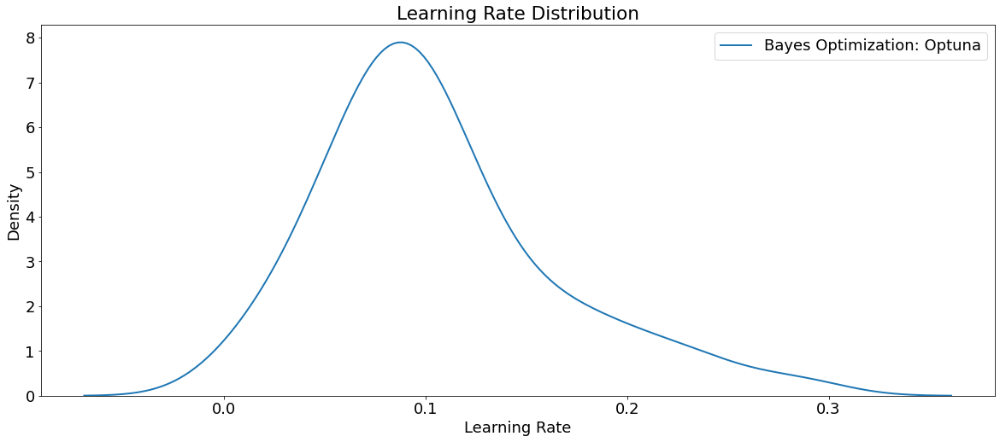

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); 
plt.title('Learning Rate Distribution');
plt.show()

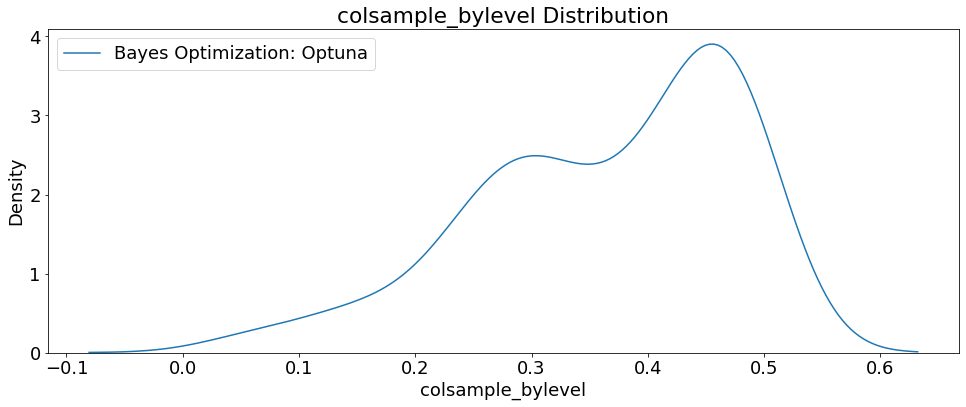

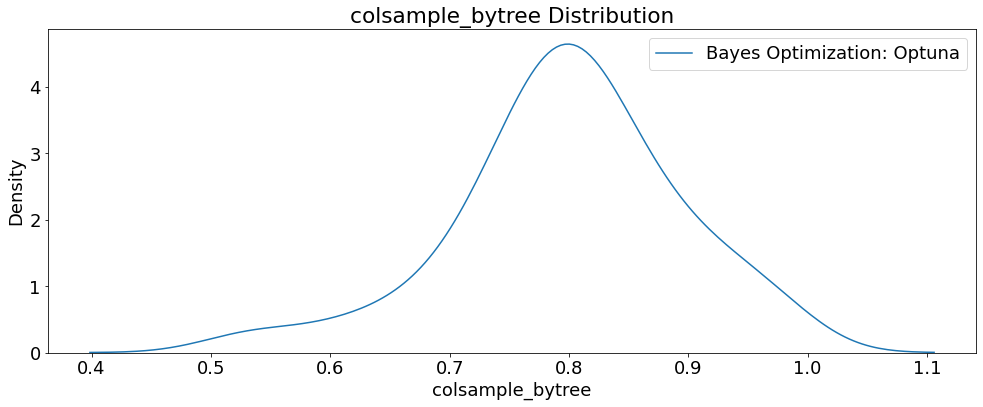

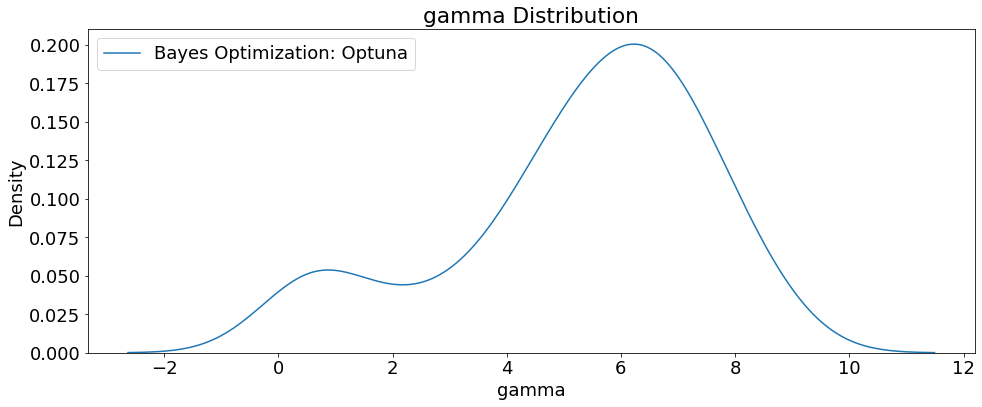

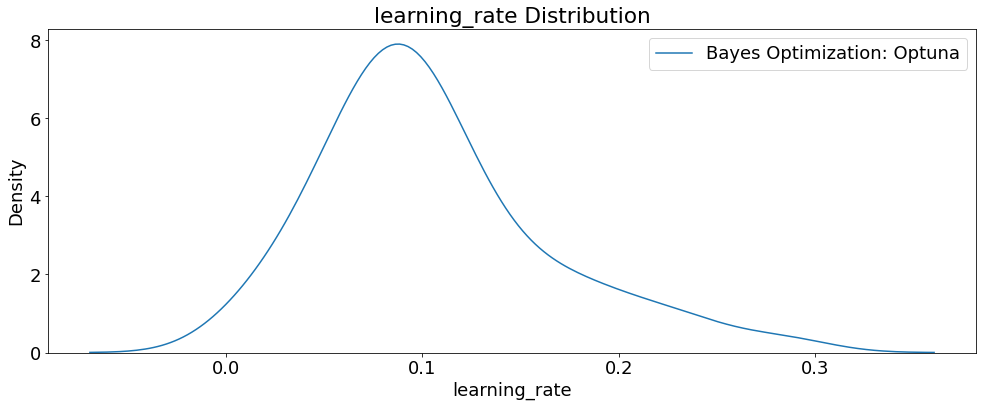

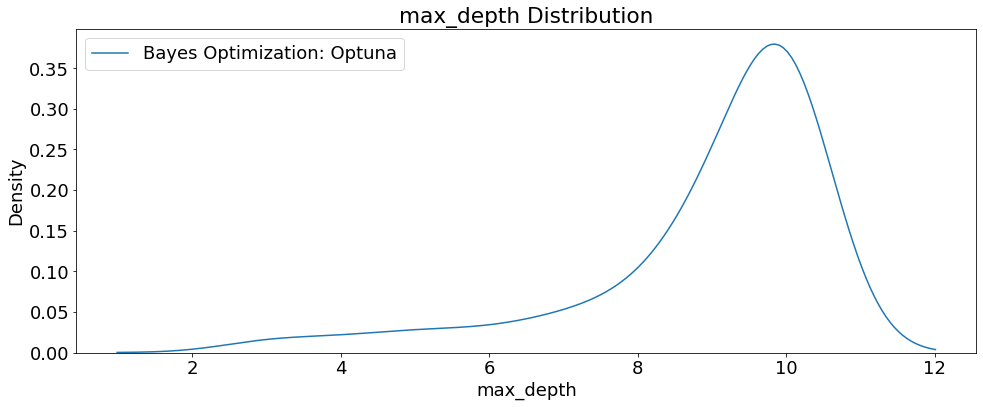

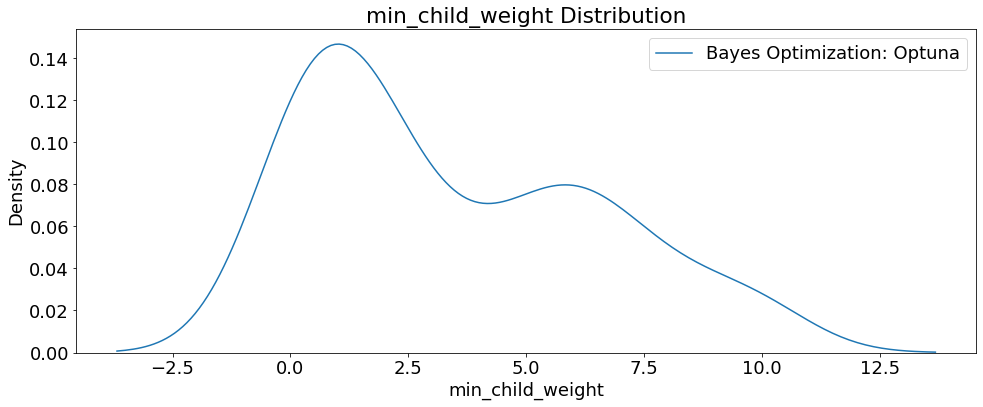

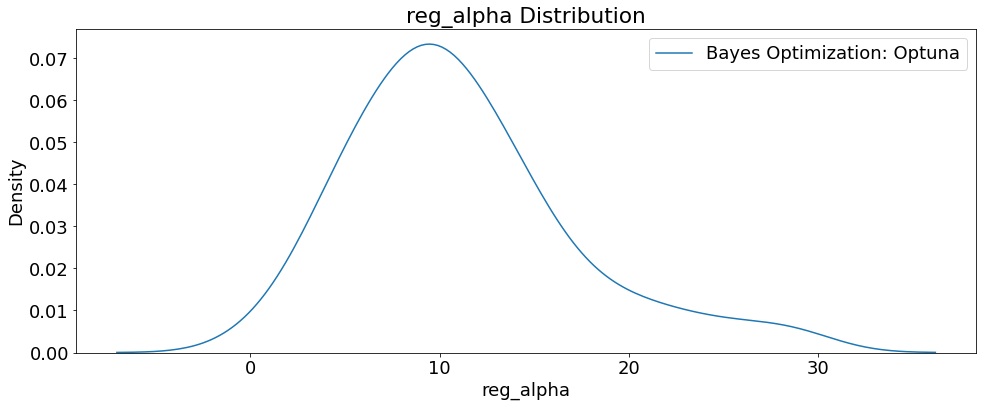

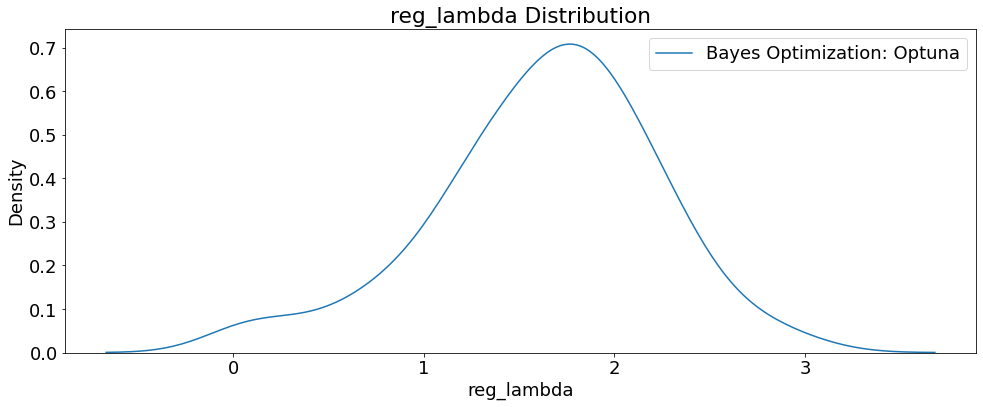

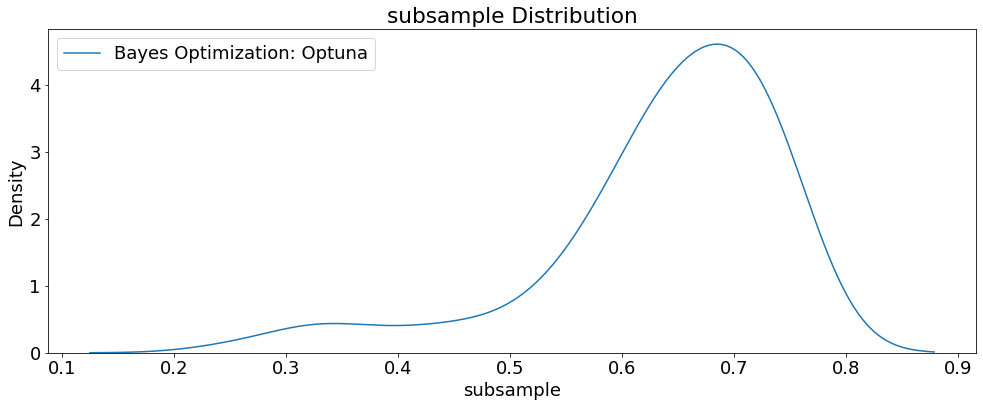

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

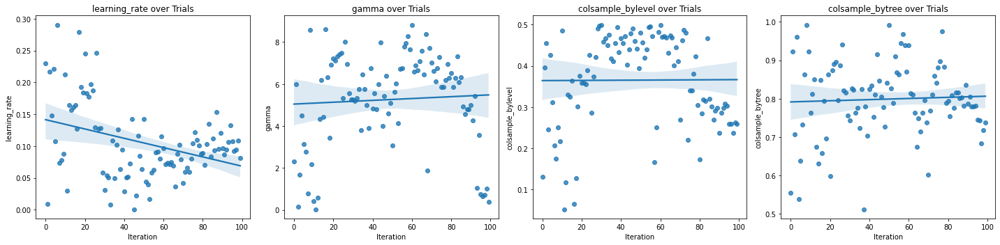

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'gamma', 'colsample_bylevel',
                         'colsample_bytree']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),  
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

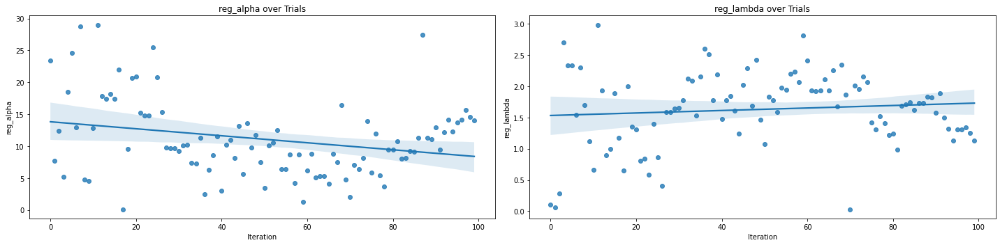

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize = (20, 5))
i = 0
for i, hpo in enumerate(['reg_alpha', 'reg_lambda']): 
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_XGBoost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_XGBoost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params['metric'] = 'rmse'
params

{'n_estimators': 484,
 'max_depth': 10,
 'subsample': 0.6925152274903453,
 'gamma': 7.767575298012285,
 'learning_rate': 0.0903557451272236,
 'reg_alpha': 8.695070330464715,
 'reg_lambda': 2.2033752849969175,
 'colsample_bytree': 0.9443484766633513,
 'colsample_bylevel': 0.4727531317248229,
 'min_child_weight': 0,
 'random_state': 42,
 'metric': 'rmse'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = XGBRegressor(objective='reg:squarederror', 
                          booster='gbtree',
                          tree_method='gpu_hist', 
                          scale_pos_weight=1,
                          use_label_encoder=False,
                          verbosity=0,
                          **params)

# Fit the model
best_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'XGB_Optuna_trials100_GPU_CV_wb.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('XGB_Optuna_trials100_GPU_CV_wb.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for XGBoost HPO 100 GPU trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(train_label, y_train_pred),
        mean_absolute_error(test_label, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred),
        mean_squared_error(test_label, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred, squared=False),
        mean_squared_error(test_label, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(train_label, y_train_pred),
        r2_score(test_label, y_test_pred)))


Model Metrics for XGBoost HPO 100 GPU trials
MAE train: 1277.445, test: 1723.258
MSE train: 3022202.698, test: 5532221.316
RMSE train: 1738.448, test: 2352.067
R^2 train: 0.967, test: 0.939


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 5532221.31632 MSE on the test set.
This was achieved using these conditions:
iteration                                    56
rmse                                2384.409087
datetime_start       2022-09-02 23:47:52.328939
datetime_complete    2022-09-02 23:51:45.151412
duration                 0 days 00:03:52.822473
colsample_bylevel                      0.472753
colsample_bytree                       0.944348
gamma                                  7.767575
learning_rate                          0.090356
max_depth                                    10
min_child_weight                              0
n_estimators                                484
reg_alpha                               8.69507
reg_lambda                             2.203375
subsample                              0.692515
state                                  COMPLETE
Name: 56, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


<Figure size 432x288 with 0 Axes>

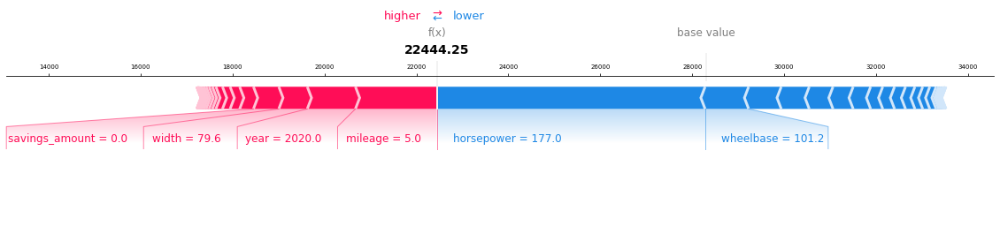

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_100_GPU_CV_wb_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

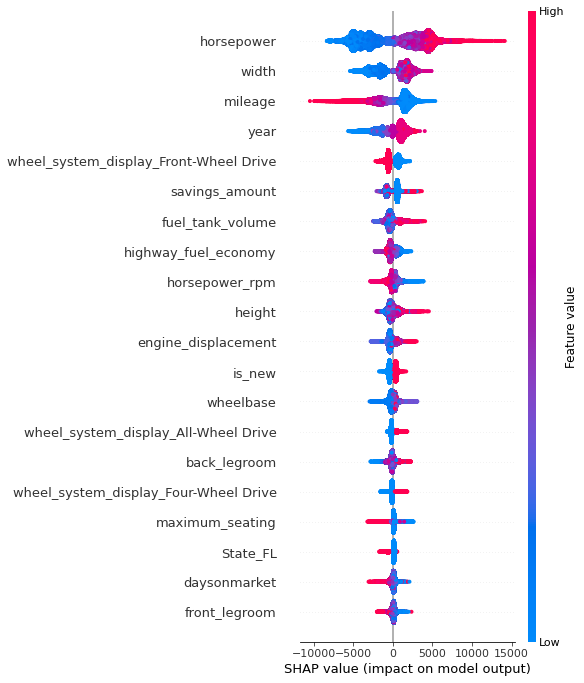

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_100_GPU_CV_wb_ShapSummary_TrainSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

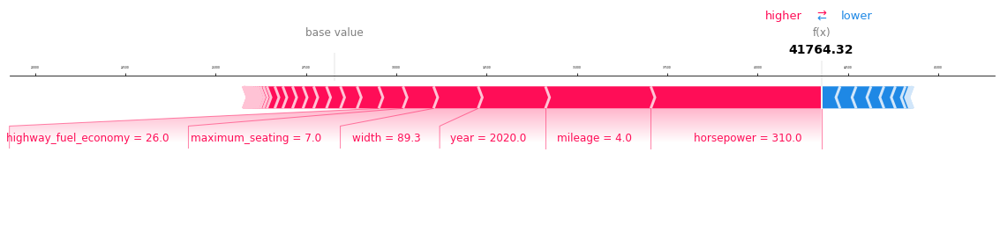

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_100_GPU_CV_wb_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

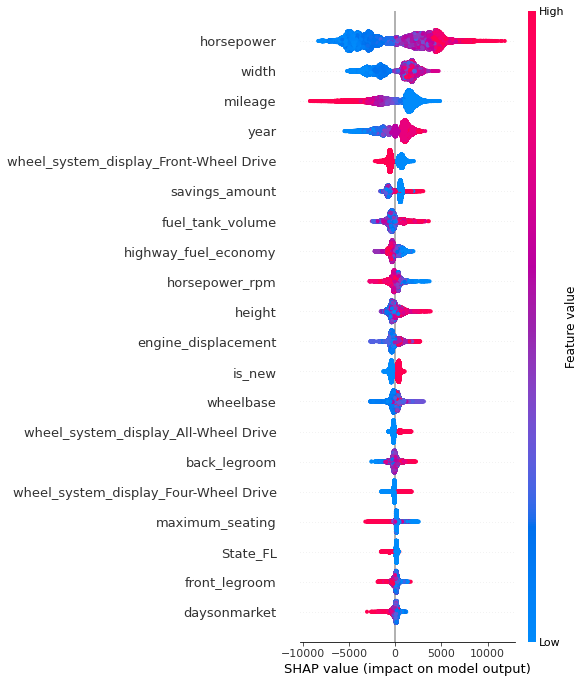

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_100_GPU_CV_wb_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     test_label)

In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)                                                                    

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file 
with open(r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_100_GPU_CV_wb_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode("UTF-8"))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_100_GPU_CV_wb_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.4364 ± 0.0037,horsepower
0.0959 ± 0.0013,width
0.0904 ± 0.0018,mileage
0.0830 ± 0.0016,year
0.0463 ± 0.0003,height
0.0379 ± 0.0007,fuel_tank_volume
0.0255 ± 0.0006,maximum_seating
0.0240 ± 0.0004,back_legroom
0.0234 ± 0.0010,wheelbase
0.0223 ± 0.0005,horsepower_rpm


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Optuna_100_GPU_CV_wb_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,horsepower,0.436351,0.001866
1,width,0.095896,0.000644
2,mileage,0.090421,0.000891
3,year,0.083050,0.000785
4,height,0.046282,0.000149
5,fuel_tank_volume,0.037886,0.000373
6,maximum_seating,0.025460,0.000296
7,back_legroom,0.024015,0.000177
8,wheelbase,0.023424,0.000477
9,horsepower_rpm,0.022297,0.000247


## 300 Trials 10-Fold Cross Validation

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL


In [ ]:
# Set up wandb
wandb.login()

wandb_kwargs = {'project': 'usedCars_hpo', 'entity': 'aschultz', 
                'group': 'optuna_xgb300gpu_cv_kfold10', 
                'save_code': 'False', 'notes': 'xgb300gpu_cv_kfold10'}
wandbc = WeightsAndBiasesCallback(wandb_kwargs=wandb_kwargs, as_multirun=True)

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 

··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
WeightsAndBiasesCallback is experimental (supported from v2.9.0). The interface can change in the future.


In [ ]:
# Define number of folds for CV
kfolds = KFold(n_splits=10, shuffle=True, random_state=seed_value)

# Set up WB callbacks
@wandbc.track_in_wandb()

# Define a function for optimization of hyperparameters
def objective(trial):
    """
    Objective function to tune a `XGBoostRegressor` model.
    """
    joblib.dump(study, 'XGB_Optuna_300_GPU_CV_wb.pkl')

    # Define parameter grid
    params_xgb_optuna = {
        'n_estimators': trial.suggest_int('n_estimators', 400, 1000),
        'max_depth': trial.suggest_int('max_depth', 9, 15),
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),
        'gamma': trial.suggest_float('gamma', 1e-8, 7e-5),
        'learning_rate': trial.suggest_float('learning_rate', 0.04, 0.13),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 0.02),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 1e-5),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 0.7),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.35, 0.6), 
        'min_child_weight': trial.suggest_int('min_child_weight', 7, 12),
        }

    # Define model type
    model = XGBRegressor(
        objective='reg:squarederror',
        booster='gbtree', 
        tree_method='gpu_hist',    
        scale_pos_weight=1,
        use_label_encoder=False,
        random_state=seed_value,     
        verbosity=0,
        **params_xgb_optuna)

    # Start timer for each trial
    start = timer()   
    
    # Perform k_folds cross validation to find lower error
    scores = -cross_val_score(model, train_features, train_label, 
                              scoring='neg_root_mean_squared_error', 
                              cv=kfolds)
    run_time = timer() - start

    # Extract score
    rmse = np.mean(scores)
    print('- Trial RMSE:', rmse)  
    
    return rmse

track_in_wandb is experimental (supported from v3.0.0). The interface can change in the future.


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL/

study = joblib.load('XGB_Optuna_300_GPU_CV_wb.pkl')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/Xgboost/Optuna/Model_PKL
Number of finished trials: 282
Best trial: {'n_estimators': 549, 'max_depth': 14, 'subsample': 0.7997070496461064, 'gamma': 2.953865805049196e-05, 'learning_rate': 0.04001808814037916, 'reg_alpha': 0.018852758055925938, 'reg_lambda': 1.8216639376033342e-06, 'colsample_bytree': 0.56819205236003, 'colsample_bylevel': 0.5683397007952175, 'min_child_weight': 7}
Lowest RMSE 2333.9101198688268


In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('XGB_Optuna_300_GPU_CV_wb.pkl'):
    study = joblib.load('XGB_Optuna_300_GPU_CV_wb.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=18, callbacks=[wandbc])
# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)
wandb.finish()

wandb: Currently logged in as: aschultz. Use `wandb login --relogin` to force relogin


Start Time           2022-09-10 17:02:11.950382


[0]	validation_0-rmse:28645.51758
[1]	validation_0-rmse:27467.91797
[2]	validation_0-rmse:26338.93359
[3]	validation_0-rmse:25257.01562
[4]	validation_0-rmse:24221.85938
[5]	validation_0-rmse:23229.97461
[6]	validation_0-rmse:22278.88281
[7]	validation_0-rmse:21368.61328
[8]	validation_0-rmse:20497.81250
[9]	validation_0-rmse:19661.63672
[10]	validation_0-rmse:18860.64453
[11]	validation_0-rmse:18094.34180
[12]	validation_0-rmse:17360.90430
[13]	validation_0-rmse:16657.83203
[14]	validation_0-rmse:15984.50586
[15]	validation_0-rmse:15340.18164
[16]	validation_0-rmse:14721.96191
[17]	validation_0-rmse:14135.66894
[18]	validation_0-rmse:13568.33008
[19]	validation_0-rmse:13026.03320
[20]	validation_0-rmse:12506.69531
[21]	validation_0-rmse:12010.13184
[22]	validation_0-rmse:11533.94336
[23]	validation_0-rmse:11080.13769
[24]	validation_0-rmse:10645.24316
[25]	validation_0-rmse:10229.60742
[26]	validation_0-rmse:9832.28027
[27]	validation_0-rmse:9452.17383
[28]	validation_0-rmse:9088.6093

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28689.62109
[1]	validation_0-rmse:27551.80078
[2]	validation_0-rmse:26458.84570
[3]	validation_0-rmse:25411.01562
[4]	validation_0-rmse:24405.81250
[5]	validation_0-rmse:23441.28125
[6]	validation_0-rmse:22515.53906
[7]	validation_0-rmse:21627.89453
[8]	validation_0-rmse:20777.75000
[9]	validation_0-rmse:19960.18555
[10]	validation_0-rmse:19175.95898
[11]	validation_0-rmse:18423.71875
[12]	validation_0-rmse:17703.30859
[13]	validation_0-rmse:17010.88086
[14]	validation_0-rmse:16347.47754
[15]	validation_0-rmse:15710.79394
[16]	validation_0-rmse:15099.85254
[17]	validation_0-rmse:14519.21484
[18]	validation_0-rmse:13956.57715
[19]	validation_0-rmse:13417.52539
[20]	validation_0-rmse:12900.46094
[21]	validation_0-rmse:12404.91797
[22]	validation_0-rmse:11929.25391
[23]	validation_0-rmse:11474.88574
[24]	validation_0-rmse:11039.37305
[25]	validation_0-rmse:10621.96387
[26]	validation_0-rmse:10222.36426
[27]	validation_0-rmse:9839.71094
[28]	validation_0-rmse:9472.044

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28589.38086
[1]	validation_0-rmse:27360.53320
[2]	validation_0-rmse:26183.78906
[3]	validation_0-rmse:25059.79102
[4]	validation_0-rmse:23985.32227
[5]	validation_0-rmse:22956.78320
[6]	validation_0-rmse:21973.26953
[7]	validation_0-rmse:21033.56250
[8]	validation_0-rmse:20137.40820
[9]	validation_0-rmse:19278.48633
[10]	validation_0-rmse:18457.97656
[11]	validation_0-rmse:17678.01953
[12]	validation_0-rmse:16928.51758
[13]	validation_0-rmse:16212.02734
[14]	validation_0-rmse:15527.51269
[15]	validation_0-rmse:14873.18262
[16]	validation_0-rmse:14248.77441
[17]	validation_0-rmse:13656.96875
[18]	validation_0-rmse:13085.31836
[19]	validation_0-rmse:12538.83789
[20]	validation_0-rmse:12017.19824
[21]	validation_0-rmse:11519.57812
[22]	validation_0-rmse:11044.10059
[23]	validation_0-rmse:10591.50684
[24]	validation_0-rmse:10159.77051
[25]	validation_0-rmse:9747.56250
[26]	validation_0-rmse:9354.31348
[27]	validation_0-rmse:8978.08496
[28]	validation_0-rmse:8618.18555

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27440.33984
[1]	validation_0-rmse:25205.35547
[2]	validation_0-rmse:23173.79492
[3]	validation_0-rmse:21303.43359
[4]	validation_0-rmse:19589.66406
[5]	validation_0-rmse:18022.02930
[6]	validation_0-rmse:16584.95703
[7]	validation_0-rmse:15271.03125
[8]	validation_0-rmse:14065.60352
[9]	validation_0-rmse:12966.26172
[10]	validation_0-rmse:11959.99902
[11]	validation_0-rmse:11039.00977
[12]	validation_0-rmse:10204.43555
[13]	validation_0-rmse:9440.68945
[14]	validation_0-rmse:8740.95312
[15]	validation_0-rmse:8103.03369
[16]	validation_0-rmse:7527.53662
[17]	validation_0-rmse:6997.55176
[18]	validation_0-rmse:6521.13477
[19]	validation_0-rmse:6091.82178
[20]	validation_0-rmse:5699.14404
[21]	validation_0-rmse:5351.10156
[22]	validation_0-rmse:5036.83008
[23]	validation_0-rmse:4755.26562
[24]	validation_0-rmse:4505.35889
[25]	validation_0-rmse:4281.34570
[26]	validation_0-rmse:4082.12085
[27]	validation_0-rmse:3904.11475
[28]	validation_0-rmse:3742.87329
[29]	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28643.09961
[1]	validation_0-rmse:27462.96094
[2]	validation_0-rmse:26331.47266
[3]	validation_0-rmse:25247.75977
[4]	validation_0-rmse:24210.69336
[5]	validation_0-rmse:23216.92383
[6]	validation_0-rmse:22264.45703
[7]	validation_0-rmse:21352.63672
[8]	validation_0-rmse:20480.74609
[9]	validation_0-rmse:19643.73047
[10]	validation_0-rmse:18842.06836
[11]	validation_0-rmse:18074.82227
[12]	validation_0-rmse:17340.82422
[13]	validation_0-rmse:16637.28125
[14]	validation_0-rmse:15963.81152
[15]	validation_0-rmse:15318.51465
[16]	validation_0-rmse:14700.49805
[17]	validation_0-rmse:14114.03418
[18]	validation_0-rmse:13546.75488
[19]	validation_0-rmse:13004.01562
[20]	validation_0-rmse:12484.47656
[21]	validation_0-rmse:11987.77637
[22]	validation_0-rmse:11511.38184
[23]	validation_0-rmse:11057.46777
[24]	validation_0-rmse:10623.04199
[25]	validation_0-rmse:10207.31934
[26]	validation_0-rmse:9810.16309
[27]	validation_0-rmse:9430.46484
[28]	validation_0-rmse:9067.1142

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28563.77734
[1]	validation_0-rmse:27312.95312
[2]	validation_0-rmse:26117.76758
[3]	validation_0-rmse:24976.03516
[4]	validation_0-rmse:23884.33984
[5]	validation_0-rmse:22843.28125
[6]	validation_0-rmse:21846.40625
[7]	validation_0-rmse:20896.85742
[8]	validation_0-rmse:19986.76562
[9]	validation_0-rmse:19121.37305
[10]	validation_0-rmse:18293.61328
[11]	validation_0-rmse:17501.65039
[12]	validation_0-rmse:16746.11523
[13]	validation_0-rmse:16025.76367
[14]	validation_0-rmse:15337.61719
[15]	validation_0-rmse:14677.90527
[16]	validation_0-rmse:14051.60742
[17]	validation_0-rmse:13451.36133
[18]	validation_0-rmse:12879.37598
[19]	validation_0-rmse:12336.30273
[20]	validation_0-rmse:11814.74707
[21]	validation_0-rmse:11319.26172
[22]	validation_0-rmse:10847.06250
[23]	validation_0-rmse:10395.07812
[24]	validation_0-rmse:9963.86523
[25]	validation_0-rmse:9551.62891
[26]	validation_0-rmse:9159.41016
[27]	validation_0-rmse:8789.25488
[28]	validation_0-rmse:8434.87402


colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27117.47852
[1]	validation_0-rmse:24623.25977
[2]	validation_0-rmse:22363.18359
[3]	validation_0-rmse:20319.22461
[4]	validation_0-rmse:18463.76758
[5]	validation_0-rmse:16787.68750
[6]	validation_0-rmse:15265.71191
[7]	validation_0-rmse:13892.98438
[8]	validation_0-rmse:12646.94238
[9]	validation_0-rmse:11526.93848
[10]	validation_0-rmse:10513.82812
[11]	validation_0-rmse:9597.57910
[12]	validation_0-rmse:8772.36426
[13]	validation_0-rmse:8031.10254
[14]	validation_0-rmse:7365.95508
[15]	validation_0-rmse:6763.22803
[16]	validation_0-rmse:6229.58789
[17]	validation_0-rmse:5747.32520
[18]	validation_0-rmse:5319.29443
[19]	validation_0-rmse:4941.50293
[20]	validation_0-rmse:4602.69141
[21]	validation_0-rmse:4306.62402
[22]	validation_0-rmse:4046.55395
[23]	validation_0-rmse:3816.18994
[24]	validation_0-rmse:3613.68848
[25]	validation_0-rmse:3436.37598
[26]	validation_0-rmse:3283.55273
[27]	validation_0-rmse:3155.77026
[28]	validation_0-rmse:3043.30225
[29]	validati

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28688.96094
[1]	validation_0-rmse:27551.69141
[2]	validation_0-rmse:26458.97461
[3]	validation_0-rmse:25410.50586
[4]	validation_0-rmse:24405.71875
[5]	validation_0-rmse:23440.06055
[6]	validation_0-rmse:22512.93945
[7]	validation_0-rmse:21625.75391
[8]	validation_0-rmse:20775.41016
[9]	validation_0-rmse:19957.74805
[10]	validation_0-rmse:19172.85352
[11]	validation_0-rmse:18420.04883
[12]	validation_0-rmse:17699.87695
[13]	validation_0-rmse:17006.91797
[14]	validation_0-rmse:16342.94434
[15]	validation_0-rmse:15706.07227
[16]	validation_0-rmse:15094.83008
[17]	validation_0-rmse:14513.83301
[18]	validation_0-rmse:13951.70117
[19]	validation_0-rmse:13412.47656
[20]	validation_0-rmse:12895.46875
[21]	validation_0-rmse:12399.65137
[22]	validation_0-rmse:11924.25293
[23]	validation_0-rmse:11470.40234
[24]	validation_0-rmse:11034.86621
[25]	validation_0-rmse:10617.60059
[26]	validation_0-rmse:10218.08789
[27]	validation_0-rmse:9835.15137
[28]	validation_0-rmse:9467.563

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:27704.30078
[1]	validation_0-rmse:25694.10938
[2]	validation_0-rmse:23836.33984
[3]	validation_0-rmse:22112.11328
[4]	validation_0-rmse:20522.35547
[5]	validation_0-rmse:19050.50781
[6]	validation_0-rmse:17687.31250
[7]	validation_0-rmse:16424.78125
[8]	validation_0-rmse:15256.42285
[9]	validation_0-rmse:14182.23438
[10]	validation_0-rmse:13183.40820
[11]	validation_0-rmse:12256.32519
[12]	validation_0-rmse:11405.07422
[13]	validation_0-rmse:10621.63672
[14]	validation_0-rmse:9898.07227
[15]	validation_0-rmse:9228.96875
[16]	validation_0-rmse:8613.85547
[17]	validation_0-rmse:8044.13232
[18]	validation_0-rmse:7522.12061
[19]	validation_0-rmse:7042.22656
[20]	validation_0-rmse:6601.65430
[21]	validation_0-rmse:6197.27637
[22]	validation_0-rmse:5825.33203
[23]	validation_0-rmse:5487.90430
[24]	validation_0-rmse:5182.98438
[25]	validation_0-rmse:4903.74853
[26]	validation_0-rmse:4650.43945
[27]	validation_0-rmse:4418.54346
[28]	validation_0-rmse:4209.97754
[29]	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28604.50195
[1]	validation_0-rmse:27389.08008
[2]	validation_0-rmse:26225.36328
[3]	validation_0-rmse:25112.30469
[4]	validation_0-rmse:24048.64453
[5]	validation_0-rmse:23030.72656
[6]	validation_0-rmse:22056.56250
[7]	validation_0-rmse:21125.59375
[8]	validation_0-rmse:20236.26172
[9]	validation_0-rmse:19383.64258
[10]	validation_0-rmse:18568.30078
[11]	validation_0-rmse:17789.01172
[12]	validation_0-rmse:17044.49609
[13]	validation_0-rmse:16331.90039
[14]	validation_0-rmse:15650.70898
[15]	validation_0-rmse:14999.20898
[16]	validation_0-rmse:14375.86719
[17]	validation_0-rmse:13785.30957
[18]	validation_0-rmse:13214.79492
[19]	validation_0-rmse:12669.73633
[20]	validation_0-rmse:12148.56055
[21]	validation_0-rmse:11651.29688
[22]	validation_0-rmse:11175.22754
[23]	validation_0-rmse:10722.18945
[24]	validation_0-rmse:10289.10449
[25]	validation_0-rmse:9875.62402
[26]	validation_0-rmse:9481.10156
[27]	validation_0-rmse:9104.43066
[28]	validation_0-rmse:8744.62598

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28640.93555
[1]	validation_0-rmse:27458.69531
[2]	validation_0-rmse:26325.30078
[3]	validation_0-rmse:25239.87109
[4]	validation_0-rmse:24201.26758
[5]	validation_0-rmse:23206.02734
[6]	validation_0-rmse:22252.25781
[7]	validation_0-rmse:21339.33398
[8]	validation_0-rmse:20466.39844
[9]	validation_0-rmse:19628.34375
[10]	validation_0-rmse:18825.98242
[11]	validation_0-rmse:18058.10547
[12]	validation_0-rmse:17323.50781
[13]	validation_0-rmse:16619.38672
[14]	validation_0-rmse:15945.44824
[15]	validation_0-rmse:15299.68945
[16]	validation_0-rmse:14681.21484
[17]	validation_0-rmse:14094.48340
[18]	validation_0-rmse:13526.85156
[19]	validation_0-rmse:12983.92285
[20]	validation_0-rmse:12464.35156
[21]	validation_0-rmse:11967.49316
[22]	validation_0-rmse:11491.19824
[23]	validation_0-rmse:11037.30176
[24]	validation_0-rmse:10602.99121
[25]	validation_0-rmse:10187.26269
[26]	validation_0-rmse:9790.29688
[27]	validation_0-rmse:9410.49316
[28]	validation_0-rmse:9047.3427

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28528.90430
[1]	validation_0-rmse:27244.86133
[2]	validation_0-rmse:26019.08008
[3]	validation_0-rmse:24849.12891
[4]	validation_0-rmse:23734.63086
[5]	validation_0-rmse:22670.58594
[6]	validation_0-rmse:21655.01172
[7]	validation_0-rmse:20687.19727
[8]	validation_0-rmse:19765.08594
[9]	validation_0-rmse:18883.31250
[10]	validation_0-rmse:18042.74414
[11]	validation_0-rmse:17241.56641
[12]	validation_0-rmse:16478.30469
[13]	validation_0-rmse:15749.67969
[14]	validation_0-rmse:15054.65625
[15]	validation_0-rmse:14392.78418
[16]	validation_0-rmse:13760.21289
[17]	validation_0-rmse:13163.13379
[18]	validation_0-rmse:12587.82031
[19]	validation_0-rmse:12040.07617
[20]	validation_0-rmse:11517.75781
[21]	validation_0-rmse:11020.93359
[22]	validation_0-rmse:10546.82324
[23]	validation_0-rmse:10097.16113
[24]	validation_0-rmse:9668.04004
[25]	validation_0-rmse:9259.97656
[26]	validation_0-rmse:8871.74219
[27]	validation_0-rmse:8501.86133
[28]	validation_0-rmse:8149.98438


colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28690.94336
[1]	validation_0-rmse:27556.05273
[2]	validation_0-rmse:26466.89844
[3]	validation_0-rmse:25421.50781
[4]	validation_0-rmse:24417.53906
[5]	validation_0-rmse:23455.70898
[6]	validation_0-rmse:22530.64453
[7]	validation_0-rmse:21645.35156
[8]	validation_0-rmse:20793.05273
[9]	validation_0-rmse:19978.77734
[10]	validation_0-rmse:19196.31641
[11]	validation_0-rmse:18444.46094
[12]	validation_0-rmse:17723.67383
[13]	validation_0-rmse:17033.13477
[14]	validation_0-rmse:16370.44629
[15]	validation_0-rmse:15732.65918
[16]	validation_0-rmse:15123.49902
[17]	validation_0-rmse:14537.37305
[18]	validation_0-rmse:13975.84863
[19]	validation_0-rmse:13440.33301
[20]	validation_0-rmse:12923.51269
[21]	validation_0-rmse:12429.86133
[22]	validation_0-rmse:11956.74707
[23]	validation_0-rmse:11501.91016
[24]	validation_0-rmse:11065.53223
[25]	validation_0-rmse:10646.80762
[26]	validation_0-rmse:10246.42578
[27]	validation_0-rmse:9866.16309
[28]	validation_0-rmse:9500.064

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28690.78906
[1]	validation_0-rmse:27555.98047
[2]	validation_0-rmse:26466.71289
[3]	validation_0-rmse:25421.35742
[4]	validation_0-rmse:24417.33203
[5]	validation_0-rmse:23455.54688
[6]	validation_0-rmse:22530.45508
[7]	validation_0-rmse:21645.14062
[8]	validation_0-rmse:20792.79102
[9]	validation_0-rmse:19978.54102
[10]	validation_0-rmse:19195.99023
[11]	validation_0-rmse:18443.92773
[12]	validation_0-rmse:17723.12500
[13]	validation_0-rmse:17032.68359
[14]	validation_0-rmse:16370.15918
[15]	validation_0-rmse:15732.34668
[16]	validation_0-rmse:15123.17773
[17]	validation_0-rmse:14536.90723
[18]	validation_0-rmse:13975.43750
[19]	validation_0-rmse:13439.72852
[20]	validation_0-rmse:12922.91894
[21]	validation_0-rmse:12429.22168
[22]	validation_0-rmse:11956.14551
[23]	validation_0-rmse:11501.24902
[24]	validation_0-rmse:11064.91797
[25]	validation_0-rmse:10646.21777
[26]	validation_0-rmse:10245.65527
[27]	validation_0-rmse:9865.33887
[28]	validation_0-rmse:9499.392

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26732.62500
[1]	validation_0-rmse:23928.28320
[2]	validation_0-rmse:21422.58008
[3]	validation_0-rmse:19186.94336
[4]	validation_0-rmse:17193.83008
[5]	validation_0-rmse:15415.59961
[6]	validation_0-rmse:13829.94336
[7]	validation_0-rmse:12418.17676
[8]	validation_0-rmse:11164.45215
[9]	validation_0-rmse:10046.10059
[10]	validation_0-rmse:9052.74707
[11]	validation_0-rmse:8172.93994
[12]	validation_0-rmse:7396.03418
[13]	validation_0-rmse:6707.97656
[14]	validation_0-rmse:6102.85840
[15]	validation_0-rmse:5571.53955
[16]	validation_0-rmse:5104.40088
[17]	validation_0-rmse:4703.21045
[18]	validation_0-rmse:4348.31250
[19]	validation_0-rmse:4040.85449
[20]	validation_0-rmse:3777.34521
[21]	validation_0-rmse:3553.25366
[22]	validation_0-rmse:3358.70679
[23]	validation_0-rmse:3195.71191
[24]	validation_0-rmse:3057.92114
[25]	validation_0-rmse:2943.32202
[26]	validation_0-rmse:2848.90234
[27]	validation_0-rmse:2769.72925
[28]	validation_0-rmse:2703.43750
[29]	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28591.33594
[1]	validation_0-rmse:27364.05664
[2]	validation_0-rmse:26189.25391
[3]	validation_0-rmse:25066.32812
[4]	validation_0-rmse:23993.64648
[5]	validation_0-rmse:22967.64453
[6]	validation_0-rmse:21986.17383
[7]	validation_0-rmse:21048.77930
[8]	validation_0-rmse:20153.39648
[9]	validation_0-rmse:19295.51953
[10]	validation_0-rmse:18475.42773
[11]	validation_0-rmse:17692.19531
[12]	validation_0-rmse:16944.18945
[13]	validation_0-rmse:16228.54297
[14]	validation_0-rmse:15544.82422
[15]	validation_0-rmse:14891.36816
[16]	validation_0-rmse:14266.38477
[17]	validation_0-rmse:13674.55762
[18]	validation_0-rmse:13103.21191
[19]	validation_0-rmse:12557.51367
[20]	validation_0-rmse:12036.13379
[21]	validation_0-rmse:11538.69141
[22]	validation_0-rmse:11062.72559
[23]	validation_0-rmse:10610.06250
[24]	validation_0-rmse:10177.60449
[25]	validation_0-rmse:9764.75586
[26]	validation_0-rmse:9371.21191
[27]	validation_0-rmse:8995.70606
[28]	validation_0-rmse:8637.14746

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:28628.00000
[1]	validation_0-rmse:27435.66016
[2]	validation_0-rmse:26293.89648
[3]	validation_0-rmse:25201.98438
[4]	validation_0-rmse:24154.02148
[5]	validation_0-rmse:23152.36328
[6]	validation_0-rmse:22191.27148
[7]	validation_0-rmse:21273.48438
[8]	validation_0-rmse:20391.90430
[9]	validation_0-rmse:19551.50195
[10]	validation_0-rmse:18745.72266
[11]	validation_0-rmse:17973.21289
[12]	validation_0-rmse:17234.37305
[13]	validation_0-rmse:16528.34375
[14]	validation_0-rmse:15852.36914
[15]	validation_0-rmse:15203.00684
[16]	validation_0-rmse:14584.36523
[17]	validation_0-rmse:13990.38867
[18]	validation_0-rmse:13422.87988
[19]	validation_0-rmse:12882.68848
[20]	validation_0-rmse:12362.58203
[21]	validation_0-rmse:11867.28516
[22]	validation_0-rmse:11393.73828
[23]	validation_0-rmse:10939.63769
[24]	validation_0-rmse:10505.03320
[25]	validation_0-rmse:10089.02051
[26]	validation_0-rmse:9692.10254
[27]	validation_0-rmse:9316.34863
[28]	validation_0-rmse:8955.4746

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


[0]	validation_0-rmse:26393.16406
[1]	validation_0-rmse:23331.43164
[2]	validation_0-rmse:20630.68750
[3]	validation_0-rmse:18246.08203
[4]	validation_0-rmse:16157.84863
[5]	validation_0-rmse:14313.72949
[6]	validation_0-rmse:12694.79394
[7]	validation_0-rmse:11270.08984
[8]	validation_0-rmse:10024.17383
[9]	validation_0-rmse:8937.59961
[10]	validation_0-rmse:7989.59961
[11]	validation_0-rmse:7155.85938
[12]	validation_0-rmse:6431.91797
[13]	validation_0-rmse:5808.05518
[14]	validation_0-rmse:5267.15478
[15]	validation_0-rmse:4802.37012
[16]	validation_0-rmse:4403.86816
[17]	validation_0-rmse:4066.22485
[18]	validation_0-rmse:3782.08179
[19]	validation_0-rmse:3542.14551
[20]	validation_0-rmse:3345.22803
[21]	validation_0-rmse:3180.54590
[22]	validation_0-rmse:3044.10962
[23]	validation_0-rmse:2934.90210
[24]	validation_0-rmse:2846.56299
[25]	validation_0-rmse:2771.48779
[26]	validation_0-rmse:2711.68750
[27]	validation_0-rmse:2660.70459
[28]	validation_0-rmse:2622.24951
[29]	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


Start Time           2022-09-10 17:02:11.950382
End Time             2022-09-10 21:36:15.811311
4:34:03


Number of finished trials: 300
Best trial: {'n_estimators': 549, 'max_depth': 14, 'subsample': 0.7997070496461064, 'gamma': 2.953865805049196e-05, 'learning_rate': 0.04001808814037916, 'reg_alpha': 0.018852758055925938, 'reg_lambda': 1.8216639376033342e-06, 'colsample_bytree': 0.56819205236003, 'colsample_bylevel': 0.5683397007952175, 'min_child_weight': 7}
Lowest RMSE 2333.9101198688268


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'},inplace=True)
trials_df.rename(columns={'params_colsample_bylevel': 'colsample_bylevel'}, 
                 inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'}, 
                 inplace=True)
trials_df.rename(columns={'params_gamma': 'gamma'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, 
                 inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_weight': 'min_child_weight'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_reg_alpha': 'reg_alpha'}, inplace=True)
trials_df.rename(columns={'params_reg_lambda': 'reg_lambda'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)

# Write processed data to csv
trials_df.to_csv('XGB_Optuna_300_GPU_CV_wb.csv', index=False)

     iteration         rmse             datetime_start  \
204        204  2333.910120 2022-09-09 14:10:41.129639   
218        218  2333.955932 2022-09-09 23:19:27.518212   
209        209  2334.279615 2022-09-09 20:54:49.480562   
227        227  2334.285232 2022-09-10 01:55:39.223212   
207        207  2334.308772 2022-09-09 14:48:13.542118   
..         ...          ...                        ...   
181        181          NaN 2022-09-07 09:27:23.674764   
192        192          NaN 2022-09-07 19:04:45.356653   
201        201          NaN 2022-09-07 22:50:35.876731   
208        208          NaN 2022-09-09 15:04:58.917727   
281        281          NaN 2022-09-10 16:49:03.943189   

             datetime_complete               duration  colsample_bylevel  \
204 2022-09-09 14:27:27.802886 0 days 00:16:46.673247           0.568340   
218 2022-09-09 23:36:01.846257 0 days 00:16:34.328045           0.552188   
209 2022-09-09 21:10:51.774531 0 days 00:16:02.293969           0.545055   

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['min_child_weight', 
                                                       'max_depth', 
                                                       'learning_rate', 
                                                       'gamma'])
py.plot(fig, filename='contour_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_XGBoost_Optuna_300_GPU_CV_wb.html')
fig.show()

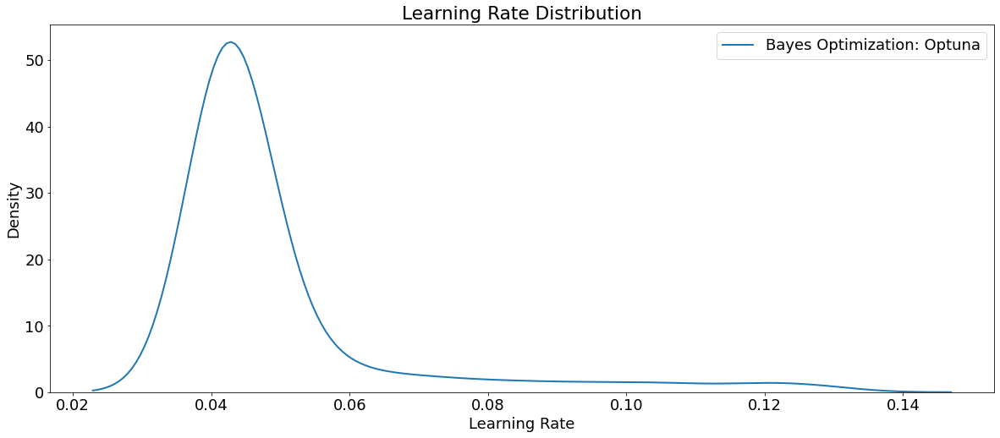

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); 
plt.title('Learning Rate Distribution');
plt.show()

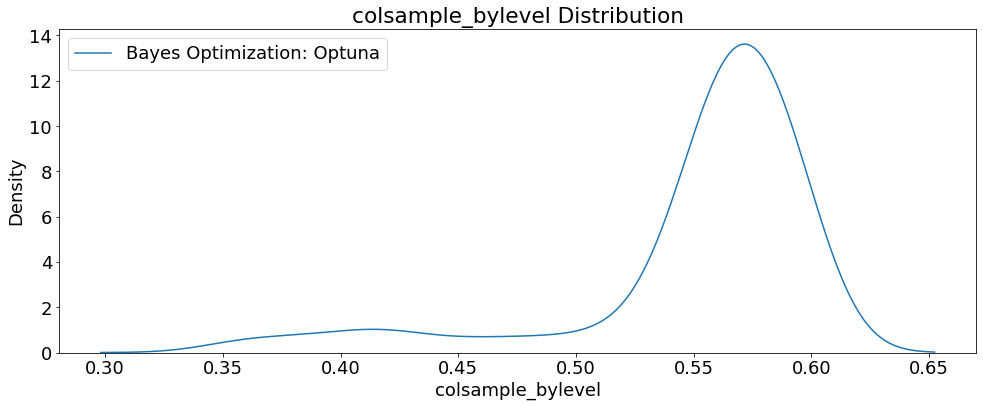

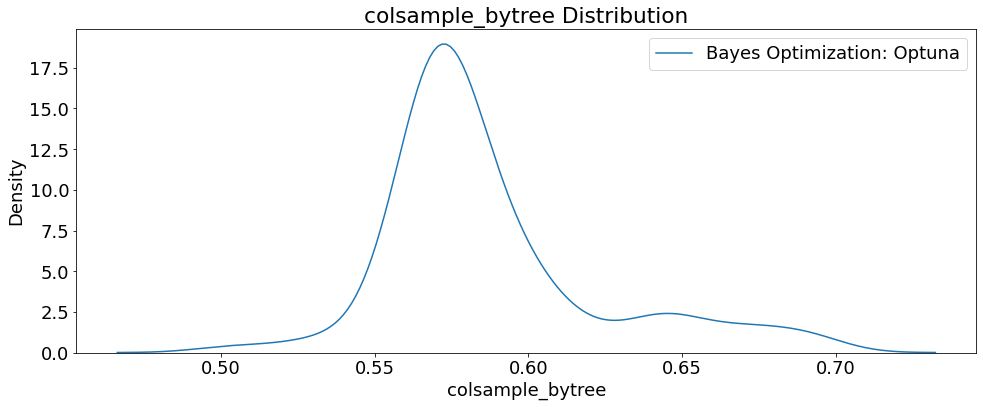

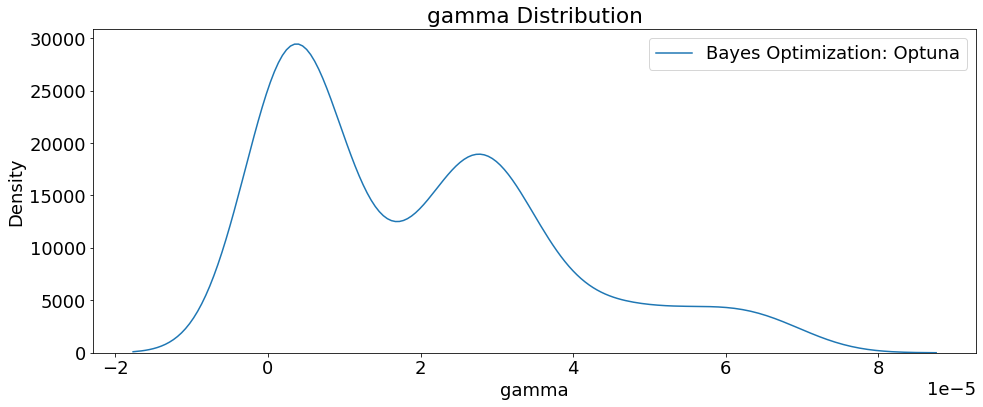

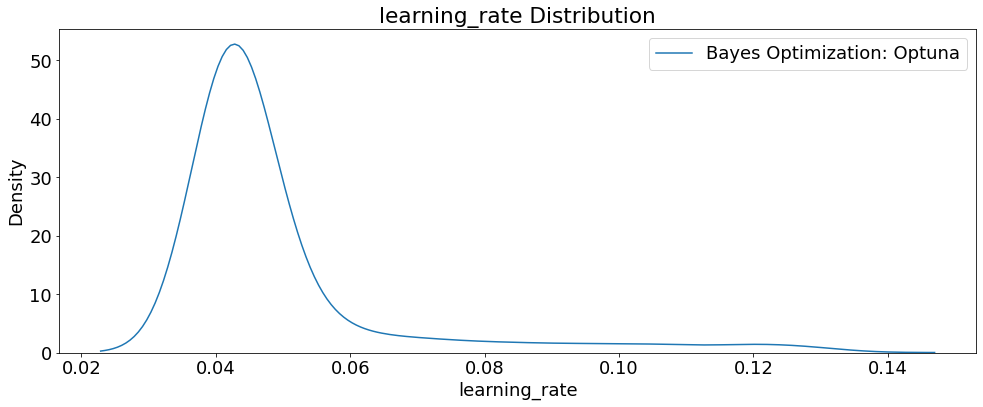

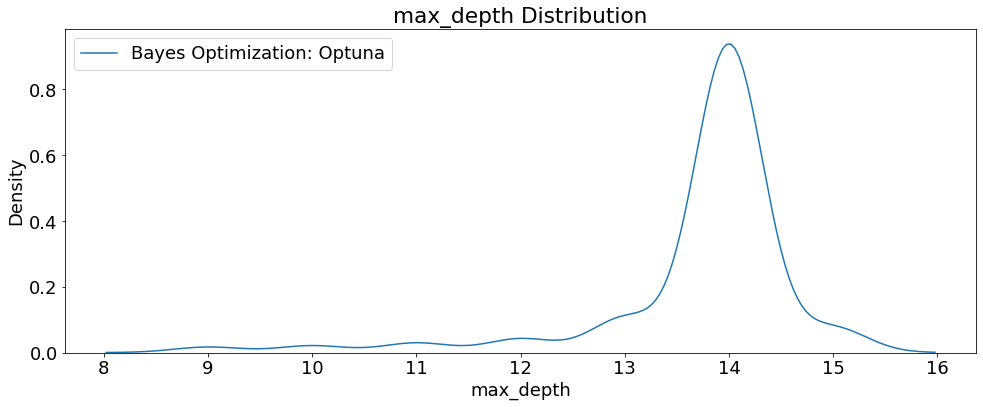

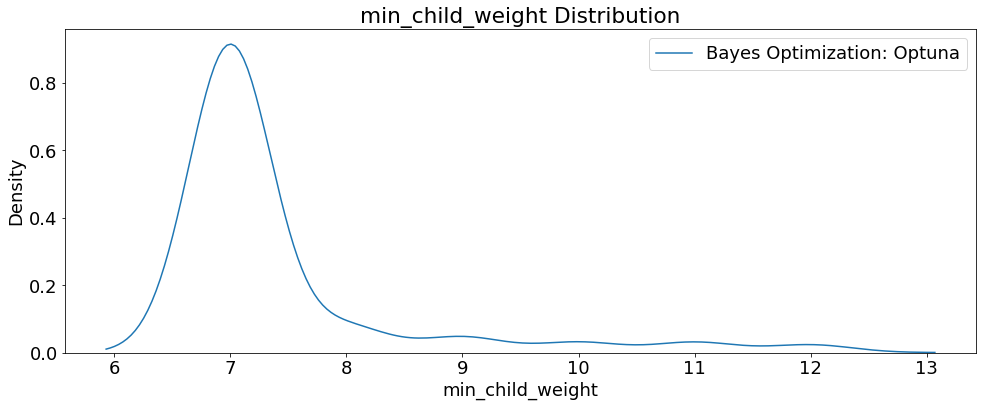

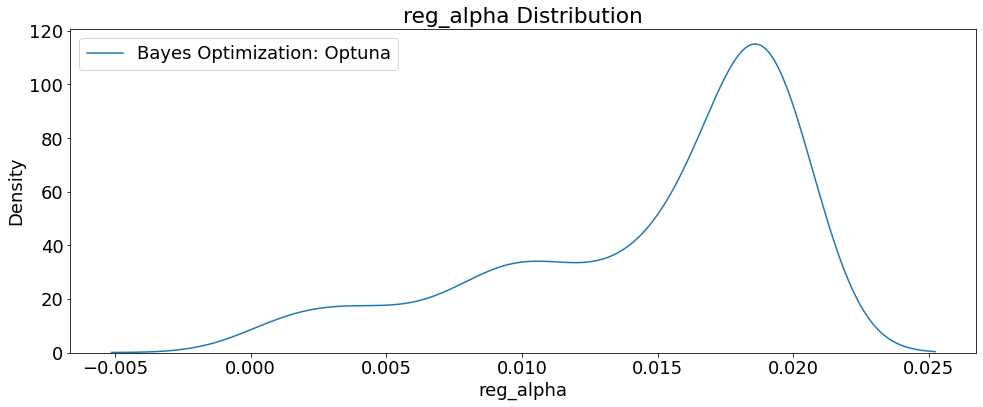

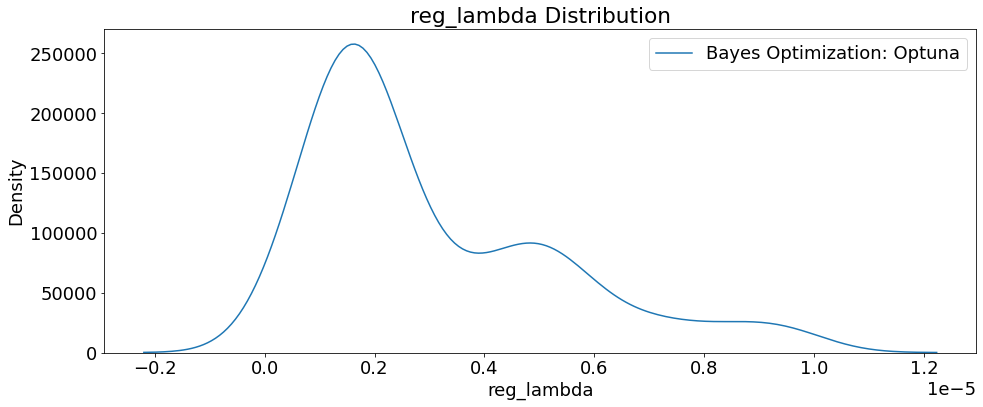

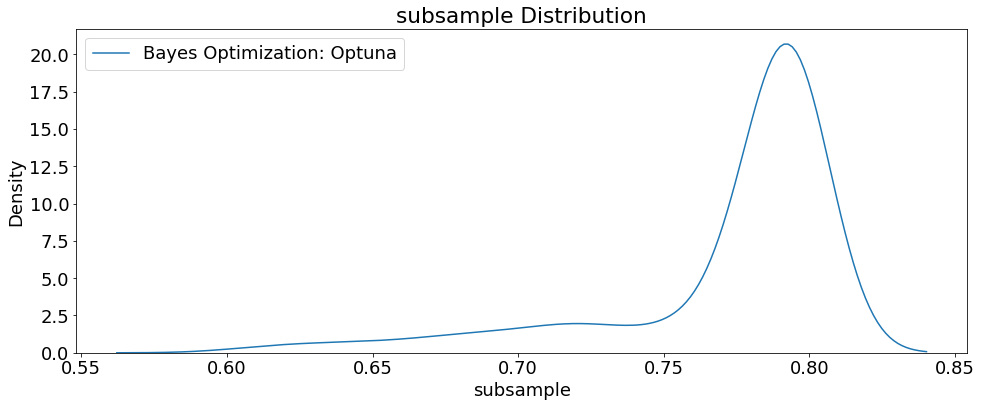

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

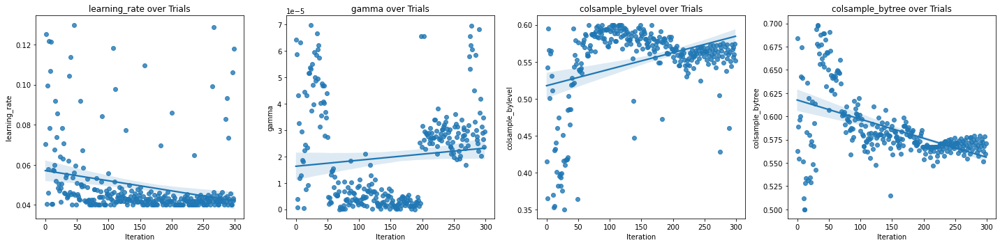

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'gamma', 'colsample_bylevel',
                         'colsample_bytree']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

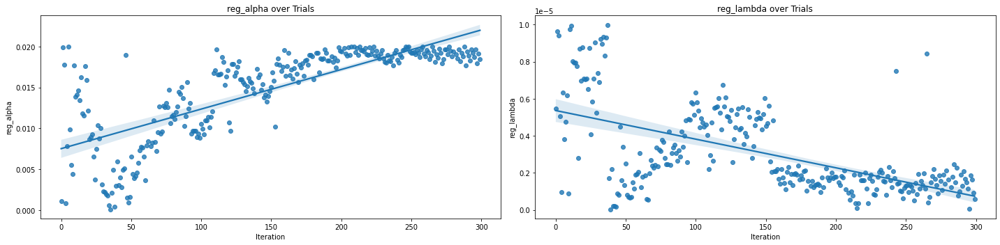

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize = (20, 5))
i = 0
for i, hpo in enumerate(['reg_alpha', 'reg_lambda']): 
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
param = study.best_params   
params['random_state'] = seed_value
params['metric'] = 'rmse'
params

{'n_estimators': 549,
 'max_depth': 14,
 'subsample': 0.7997070496461064,
 'gamma': 2.953865805049196e-05,
 'learning_rate': 0.04001808814037916,
 'reg_alpha': 0.018852758055925938,
 'reg_lambda': 1.8216639376033342e-06,
 'colsample_bytree': 0.56819205236003,
 'colsample_bylevel': 0.5683397007952175,
 'min_child_weight': 7,
 'random_state': 42,
 'metric': 'rmse'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/Xgboost/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = XGBRegressor(objective='reg:squarederror', 
                          booster='gbtree',
                          tree_method='gpu_hist', 
                          scale_pos_weight=1,
                          use_label_encoder=False,
                          verbosity=0,
                          **params)

# Fit the model
best_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'XGB_Optuna_trials300_GPU_CV_wb.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('XGB_Optuna_trials300_GPU_CV_wb.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for XGBoost HPO 300 GPU CV trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(train_label, y_train_pred),
        mean_absolute_error(test_label, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred),
        mean_squared_error(test_label, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred, squared=False),
        mean_squared_error(test_label, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(train_label, y_train_pred),
        r2_score(test_label, y_test_pred)))


Model Metrics for XGBoost HPO 300 GPU CV trials
MAE train: 969.631, test: 1665.061
MSE train: 1835218.836, test: 5288447.270
RMSE train: 1354.702, test: 2299.662
R^2 train: 0.980, test: 0.942


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 5288447.26991 MSE on the test set.
This was achieved using these conditions:
iteration                                   204
rmse                                 2333.91012
datetime_start       2022-09-09 14:10:41.129639
datetime_complete    2022-09-09 14:27:27.802886
duration                 0 days 00:16:46.673247
colsample_bylevel                       0.56834
colsample_bytree                       0.568192
gamma                                   0.00003
learning_rate                          0.040018
max_depth                                  14.0
min_child_weight                            7.0
n_estimators                              549.0
reg_alpha                              0.018853
reg_lambda                             0.000002
subsample                              0.799707
state                                  COMPLETE
Name: 204, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


<Figure size 432x288 with 0 Axes>

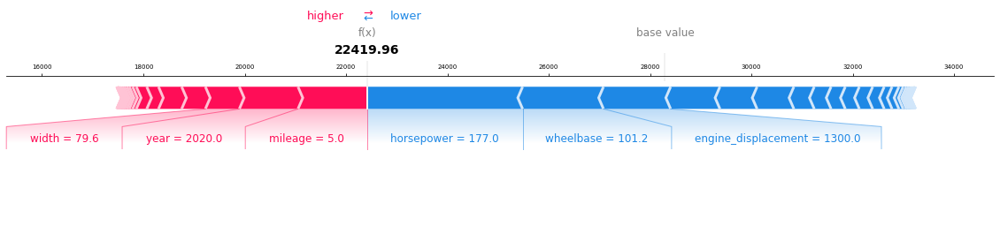

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_300_GPU_CV_wb_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

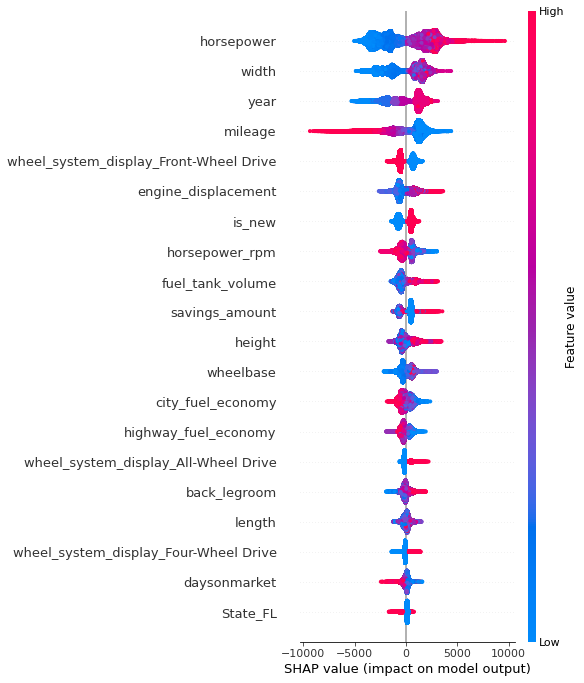

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_300_GPU_CV_wb_ShapSummary_TrainSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

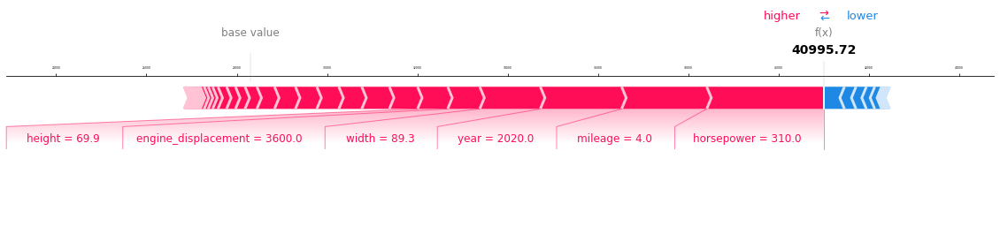

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_300_GPU_CV_wb_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

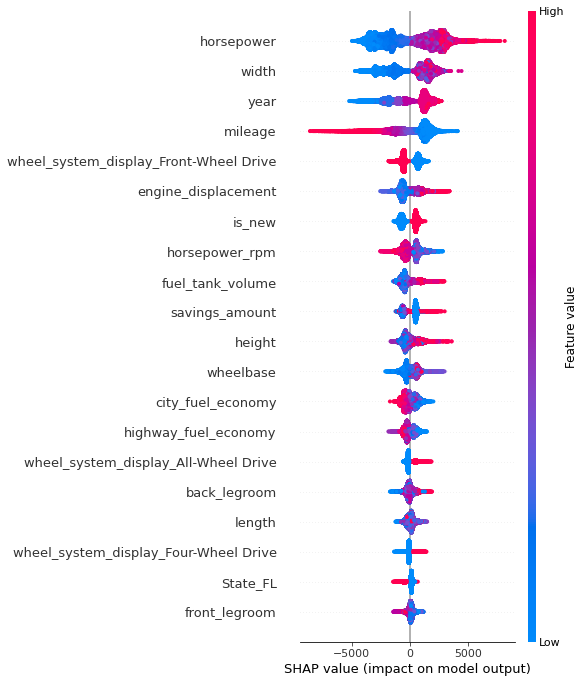

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_300_GPU_CV_wb_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     test_label)

In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)                                                                    

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                            feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file 
with open(r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_300_GPU_CV_wb_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode('UTF-8'))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_300_GPU_CV_wb_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.1900 ± 0.0018,horsepower
0.0832 ± 0.0019,year
0.0776 ± 0.0014,mileage
0.0775 ± 0.0009,width
0.0347 ± 0.0003,height
0.0314 ± 0.0003,engine_displacement
0.0257 ± 0.0005,horsepower_rpm
0.0249 ± 0.0004,wheelbase
0.0236 ± 0.0002,fuel_tank_volume
0.0219 ± 0.0002,city_fuel_economy


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Optuna_300_GPU_CV_wb_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,horsepower,0.189968,0.000917
1,year,0.083167,0.000940
2,mileage,0.077648,0.000694
3,width,0.077522,0.000439
4,height,0.034736,0.000152
5,engine_displacement,0.031430,0.000150
6,horsepower_rpm,0.025704,0.000269
7,wheelbase,0.024892,0.000208
8,fuel_tank_volume,0.023631,0.000101
9,city_fuel_economy,0.021869,0.000080


## Train/Val/Test 100 Trials 10 k-Fold Split 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL


In [ ]:
# Set up wandb
wandb.login()

wandb_kwargs = {'project': 'usedCars_hpo', 'entity': 'aschultz',
                'group': 'xgb100gpu_trainvaltest_kfold10',  
                'save_code': 'False', 'notes': 'xgb100gpu_trainvaltest_kfold10'}
wandbc = WeightsAndBiasesCallback(wandb_kwargs=wandb_kwargs, as_multirun=True)

wandb: Currently logged in as: aschultz. Use `wandb login --relogin` to force relogin
WeightsAndBiasesCallback is experimental (supported from v2.9.0). The interface can change in the future.


In [ ]:
# Set up WB callbacks
@wandbc.track_in_wandb()

# Define a function for optimization of hyperparameters
def objective(trial):
    '''
    Objective function to tune a `XGBoostRegressor` model.
    '''
    joblib.dump(study, 'XGB_Optuna_100_GPU_wb.pkl')

    # Define parameter grid
    params_xgb_optuna = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_uniform('subsample', 0.25, 0.75),
        'gamma': trial.suggest_float('gamma', 1e-8, 9),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.3),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 30),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 3),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.05, 
                                                   0.5), 
        'min_child_weight': trial.suggest_int('min_child_weight', 0, 10)
        }

    # Set same k-folds for reproducibility
    kf = KFold(n_splits=10, shuffle=True, random_state=seed_value)

    # Set up train and validation sets
    for trn_idx, val_idx in kf.split(trainDF[features], train_label): 
      train_Features, train_Label = trainDF[features].iloc[trn_idx], train_label.iloc[trn_idx]
      val_Features, val_Label = trainDF[features].iloc[val_idx], train_label.iloc[val_idx] 
                                                                          
      # Start timer for each trial
      start = timer()

      # Define model type   
      model = XGBRegressor(
          objective='reg:squarederror',
          booster='gbtree', 
          tree_method='gpu_hist',    
          scale_pos_weight=1,
          use_label_encoder=False,
          random_state=seed_value,
          verbosity=0,
          **params_xgb_optuna)
      
      # Train the model
      model.fit(train_Features, train_Label, 
                eval_set = [(val_Features, val_Label), 
                            (train_Features, train_Label)]) 
      run_time = timer() - start

      # Predictions
      y_pred_val = model.predict(val_Features)
      rmse = mean_squared_error(val_Label, y_pred_val, squared=False)
        
      return rmse       

track_in_wandb is experimental (supported from v3.0.0). The interface can change in the future.


In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('XGB_Optuna_100_GPU_wb.pkl'):
    study = joblib.load('XGB_Optuna_100_GPU_wb.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, callbacks=[wandbc])

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)
wandb.finish()

Start Time           2022-09-02 19:45:27.551840


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:23579.84375	validation_1-rmse:23484.49609
[1]	validation_0-rmse:18717.48633	validation_1-rmse:18630.21680
[2]	validation_0-rmse:14892.61621	validation_1-rmse:14818.53223
[3]	validation_0-rmse:11921.47754	validation_1-rmse:11858.39062
[4]	validation_0-rmse:9642.40820	validation_1-rmse:9583.90332
[5]	validation_0-rmse:7949.59082	validation_1-rmse:7898.71240
[6]	validation_0-rmse:6701.22363	validation_1-rmse:6653.85254
[7]	validation_0-rmse:5744.37256	validation_1-rmse:5701.58691
[8]	validation_0-rmse:5114.29395	validation_1-rmse:5073.48145
[9]	validation_0-rmse:4630.60205	validation_1-rmse:4593.22168
[10]	validation_0-rmse:4269.74219	validation_1-rmse:4232.57959
[11]	validation_0-rmse:4018.63330	validation_1-rmse:3982.04297
[12]	validation_0-rmse:3818.91553	validation_1-rmse:3782.35547
[13]	validation_0-rmse:3687.79810	validation_1-rmse:3650.37305
[14]	validation_0-rmse:3598.47583	validation_1-rmse:3561.95923
[15]	validation_0-rmse:3516.52563	validation_1-rmse:3477.

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28746.02734	validation_1-rmse:28636.06250
[1]	validation_0-rmse:27582.62891	validation_1-rmse:27475.33789
[2]	validation_0-rmse:26462.27539	validation_1-rmse:26358.00586
[3]	validation_0-rmse:25391.03906	validation_1-rmse:25289.05859
[4]	validation_0-rmse:24365.43945	validation_1-rmse:24267.18555
[5]	validation_0-rmse:23388.44727	validation_1-rmse:23292.73828
[6]	validation_0-rmse:22449.18164	validation_1-rmse:22356.34570
[7]	validation_0-rmse:21544.89844	validation_1-rmse:21454.94531
[8]	validation_0-rmse:20685.21289	validation_1-rmse:20598.47852
[9]	validation_0-rmse:19860.15430	validation_1-rmse:19776.30469
[10]	validation_0-rmse:19072.37500	validation_1-rmse:18989.89453
[11]	validation_0-rmse:18318.87891	validation_1-rmse:18239.32227
[12]	validation_0-rmse:17598.09961	validation_1-rmse:17520.65430
[13]	validation_0-rmse:16907.32031	validation_1-rmse:16832.98438
[14]	validation_0-rmse:16248.58887	validation_1-rmse:16175.98340
[15]	validation_0-rmse:15620.06738	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:22127.04688	validation_1-rmse:22045.99023
[1]	validation_0-rmse:16527.60938	validation_1-rmse:16460.61719
[2]	validation_0-rmse:12438.17188	validation_1-rmse:12389.47559
[3]	validation_0-rmse:9570.04394	validation_1-rmse:9528.94824
[4]	validation_0-rmse:7535.49268	validation_1-rmse:7500.99023
[5]	validation_0-rmse:6153.29980	validation_1-rmse:6123.50830
[6]	validation_0-rmse:5198.45459	validation_1-rmse:5165.08643
[7]	validation_0-rmse:4587.88818	validation_1-rmse:4554.61230
[8]	validation_0-rmse:4180.27783	validation_1-rmse:4147.97998
[9]	validation_0-rmse:3937.77515	validation_1-rmse:3902.93408
[10]	validation_0-rmse:3764.91064	validation_1-rmse:3731.11572
[11]	validation_0-rmse:3657.52002	validation_1-rmse:3623.84546
[12]	validation_0-rmse:3556.35132	validation_1-rmse:3522.72803
[13]	validation_0-rmse:3488.22485	validation_1-rmse:3457.62500
[14]	validation_0-rmse:3438.27612	validation_1-rmse:3405.36670
[15]	validation_0-rmse:3383.43091	validation_1-rmse:3351.49

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27197.24023	validation_1-rmse:27095.47461
[1]	validation_0-rmse:24694.17773	validation_1-rmse:24598.88086
[2]	validation_0-rmse:22427.03320	validation_1-rmse:22339.63477
[3]	validation_0-rmse:20375.62109	validation_1-rmse:20293.92188
[4]	validation_0-rmse:18522.93164	validation_1-rmse:18445.46484
[5]	validation_0-rmse:16846.63281	validation_1-rmse:16773.97266
[6]	validation_0-rmse:15336.54004	validation_1-rmse:15265.39746
[7]	validation_0-rmse:13966.82422	validation_1-rmse:13899.10352
[8]	validation_0-rmse:12729.54394	validation_1-rmse:12667.38672
[9]	validation_0-rmse:11619.34570	validation_1-rmse:11560.65723
[10]	validation_0-rmse:10620.23047	validation_1-rmse:10563.24805
[11]	validation_0-rmse:9723.61621	validation_1-rmse:9668.32227
[12]	validation_0-rmse:8913.94238	validation_1-rmse:8861.19434
[13]	validation_0-rmse:8190.13086	validation_1-rmse:8137.16748
[14]	validation_0-rmse:7542.51807	validation_1-rmse:7490.86816
[15]	validation_0-rmse:6963.87647	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:22633.67969	validation_1-rmse:22536.64453
[1]	validation_0-rmse:17268.50195	validation_1-rmse:17182.41992
[2]	validation_0-rmse:13189.97266	validation_1-rmse:13125.33789
[3]	validation_0-rmse:10221.48731	validation_1-rmse:10164.25391
[4]	validation_0-rmse:8028.23926	validation_1-rmse:7979.90332
[5]	validation_0-rmse:6464.31885	validation_1-rmse:6423.93750
[6]	validation_0-rmse:5350.49023	validation_1-rmse:5317.40332
[7]	validation_0-rmse:4577.06836	validation_1-rmse:4545.39893
[8]	validation_0-rmse:4047.32690	validation_1-rmse:4014.15649
[9]	validation_0-rmse:3719.76123	validation_1-rmse:3684.30615
[10]	validation_0-rmse:3495.46582	validation_1-rmse:3461.84961
[11]	validation_0-rmse:3354.64893	validation_1-rmse:3321.87744
[12]	validation_0-rmse:3260.40723	validation_1-rmse:3227.15234
[13]	validation_0-rmse:3189.58765	validation_1-rmse:3155.41919
[14]	validation_0-rmse:3128.19214	validation_1-rmse:3093.95972
[15]	validation_0-rmse:3099.35034	validation_1-rmse:3061.

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:24643.86133	validation_1-rmse:24542.51172
[1]	validation_0-rmse:20365.55664	validation_1-rmse:20280.24609
[2]	validation_0-rmse:16877.77734	validation_1-rmse:16805.89258
[3]	validation_0-rmse:14093.68945	validation_1-rmse:14029.31836
[4]	validation_0-rmse:11893.95996	validation_1-rmse:11832.94922
[5]	validation_0-rmse:10061.36523	validation_1-rmse:10005.27734
[6]	validation_0-rmse:8631.63086	validation_1-rmse:8580.54688
[7]	validation_0-rmse:7469.79297	validation_1-rmse:7425.56689
[8]	validation_0-rmse:6580.25000	validation_1-rmse:6541.13672
[9]	validation_0-rmse:5921.37598	validation_1-rmse:5883.05127
[10]	validation_0-rmse:5389.08301	validation_1-rmse:5355.19238
[11]	validation_0-rmse:5014.42676	validation_1-rmse:4983.17383
[12]	validation_0-rmse:4742.88281	validation_1-rmse:4713.18311
[13]	validation_0-rmse:4483.27148	validation_1-rmse:4456.68555
[14]	validation_0-rmse:4321.70361	validation_1-rmse:4299.60107
[15]	validation_0-rmse:4177.38770	validation_1-rmse:4

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:21986.49414	validation_1-rmse:21894.10352
[1]	validation_0-rmse:16204.94727	validation_1-rmse:16126.66992
[2]	validation_0-rmse:12016.10449	validation_1-rmse:11950.22656
[3]	validation_0-rmse:9024.05859	validation_1-rmse:8964.98535
[4]	validation_0-rmse:6918.54932	validation_1-rmse:6861.32764
[5]	validation_0-rmse:5464.63867	validation_1-rmse:5405.36963
[6]	validation_0-rmse:4469.17969	validation_1-rmse:4407.88232
[7]	validation_0-rmse:3821.56445	validation_1-rmse:3757.46411
[8]	validation_0-rmse:3411.71802	validation_1-rmse:3345.21265
[9]	validation_0-rmse:3153.89233	validation_1-rmse:3080.60059
[10]	validation_0-rmse:3001.54907	validation_1-rmse:2923.49927
[11]	validation_0-rmse:2900.71924	validation_1-rmse:2818.42090
[12]	validation_0-rmse:2831.56763	validation_1-rmse:2748.03516
[13]	validation_0-rmse:2778.48999	validation_1-rmse:2689.70508
[14]	validation_0-rmse:2743.95825	validation_1-rmse:2651.47314
[15]	validation_0-rmse:2717.45874	validation_1-rmse:2622.43

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26810.90234	validation_1-rmse:26705.99219
[1]	validation_0-rmse:24014.27148	validation_1-rmse:23916.98633
[2]	validation_0-rmse:21525.27734	validation_1-rmse:21435.71094
[3]	validation_0-rmse:19293.31836	validation_1-rmse:19208.89648
[4]	validation_0-rmse:17305.18750	validation_1-rmse:17225.69922
[5]	validation_0-rmse:15531.36035	validation_1-rmse:15458.69727
[6]	validation_0-rmse:13952.00098	validation_1-rmse:13884.74023
[7]	validation_0-rmse:12559.68945	validation_1-rmse:12495.33887
[8]	validation_0-rmse:11312.92285	validation_1-rmse:11254.52148
[9]	validation_0-rmse:10222.97461	validation_1-rmse:10165.19824
[10]	validation_0-rmse:9246.84082	validation_1-rmse:9193.06641
[11]	validation_0-rmse:8380.45996	validation_1-rmse:8329.27734
[12]	validation_0-rmse:7611.77393	validation_1-rmse:7563.30566
[13]	validation_0-rmse:6942.64355	validation_1-rmse:6895.35156
[14]	validation_0-rmse:6357.35400	validation_1-rmse:6312.92969
[15]	validation_0-rmse:5842.17041	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:24422.35742	validation_1-rmse:24322.55078
[1]	validation_0-rmse:19928.52734	validation_1-rmse:19844.30273
[2]	validation_0-rmse:16305.22266	validation_1-rmse:16235.55469
[3]	validation_0-rmse:13382.93555	validation_1-rmse:13323.93262
[4]	validation_0-rmse:11034.32129	validation_1-rmse:10982.86133
[5]	validation_0-rmse:9164.27734	validation_1-rmse:9119.89062
[6]	validation_0-rmse:7678.28418	validation_1-rmse:7636.51074
[7]	validation_0-rmse:6509.67529	validation_1-rmse:6470.27783
[8]	validation_0-rmse:5592.15772	validation_1-rmse:5554.86133
[9]	validation_0-rmse:4881.00635	validation_1-rmse:4842.22559
[10]	validation_0-rmse:4338.50879	validation_1-rmse:4300.98193
[11]	validation_0-rmse:3945.38696	validation_1-rmse:3908.42212
[12]	validation_0-rmse:3646.03101	validation_1-rmse:3610.13257
[13]	validation_0-rmse:3441.82739	validation_1-rmse:3406.36694
[14]	validation_0-rmse:3287.74512	validation_1-rmse:3251.65430
[15]	validation_0-rmse:3177.11328	validation_1-rmse:313

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:22874.46094	validation_1-rmse:22780.64648
[1]	validation_0-rmse:17711.36328	validation_1-rmse:17625.91016
[2]	validation_0-rmse:13855.09375	validation_1-rmse:13784.77734
[3]	validation_0-rmse:11101.44238	validation_1-rmse:11037.66016
[4]	validation_0-rmse:8978.88769	validation_1-rmse:8922.82129
[5]	validation_0-rmse:7494.77002	validation_1-rmse:7447.38721
[6]	validation_0-rmse:6514.41455	validation_1-rmse:6472.14502
[7]	validation_0-rmse:5858.15625	validation_1-rmse:5822.46045
[8]	validation_0-rmse:5393.00586	validation_1-rmse:5362.16016
[9]	validation_0-rmse:5101.94141	validation_1-rmse:5073.62695
[10]	validation_0-rmse:4874.93506	validation_1-rmse:4846.95410
[11]	validation_0-rmse:4737.28857	validation_1-rmse:4708.94238
[12]	validation_0-rmse:4637.82666	validation_1-rmse:4610.58936
[13]	validation_0-rmse:4564.42334	validation_1-rmse:4539.03662
[14]	validation_0-rmse:4504.80859	validation_1-rmse:4483.84180
[15]	validation_0-rmse:4454.84131	validation_1-rmse:4434.

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:21269.78711	validation_1-rmse:21182.02734
[1]	validation_0-rmse:15226.27246	validation_1-rmse:15152.64258
[2]	validation_0-rmse:10977.99805	validation_1-rmse:10914.57812
[3]	validation_0-rmse:8078.03955	validation_1-rmse:8020.95850
[4]	validation_0-rmse:6108.83057	validation_1-rmse:6050.79102
[5]	validation_0-rmse:4843.42920	validation_1-rmse:4780.81445
[6]	validation_0-rmse:4039.47705	validation_1-rmse:3971.38477
[7]	validation_0-rmse:3528.59497	validation_1-rmse:3454.76343
[8]	validation_0-rmse:3244.88818	validation_1-rmse:3165.13403
[9]	validation_0-rmse:3067.20190	validation_1-rmse:2984.48633
[10]	validation_0-rmse:2970.33862	validation_1-rmse:2884.13159
[11]	validation_0-rmse:2908.70850	validation_1-rmse:2815.01880
[12]	validation_0-rmse:2868.56909	validation_1-rmse:2771.82251
[13]	validation_0-rmse:2824.17847	validation_1-rmse:2720.49170
[14]	validation_0-rmse:2791.21289	validation_1-rmse:2684.21826
[15]	validation_0-rmse:2773.08130	validation_1-rmse:2661.50

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25014.08398	validation_1-rmse:24912.35742
[1]	validation_0-rmse:20911.38281	validation_1-rmse:20818.21680
[2]	validation_0-rmse:17493.60938	validation_1-rmse:17410.32812
[3]	validation_0-rmse:14672.93848	validation_1-rmse:14598.49512
[4]	validation_0-rmse:12348.74805	validation_1-rmse:12277.67188
[5]	validation_0-rmse:10430.46875	validation_1-rmse:10364.92481
[6]	validation_0-rmse:8854.33789	validation_1-rmse:8792.63965
[7]	validation_0-rmse:7563.90478	validation_1-rmse:7504.49853
[8]	validation_0-rmse:6511.99316	validation_1-rmse:6455.17920
[9]	validation_0-rmse:5675.41016	validation_1-rmse:5617.46924
[10]	validation_0-rmse:5005.76514	validation_1-rmse:4948.56006
[11]	validation_0-rmse:4477.39062	validation_1-rmse:4421.63428
[12]	validation_0-rmse:4067.86011	validation_1-rmse:4010.32666
[13]	validation_0-rmse:3745.75537	validation_1-rmse:3685.64356
[14]	validation_0-rmse:3504.66284	validation_1-rmse:3441.54126
[15]	validation_0-rmse:3314.39185	validation_1-rmse:3

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25792.54297	validation_1-rmse:25694.16211
[1]	validation_0-rmse:22220.34766	validation_1-rmse:22133.59180
[2]	validation_0-rmse:19166.89062	validation_1-rmse:19090.12305
[3]	validation_0-rmse:16551.18750	validation_1-rmse:16479.78711
[4]	validation_0-rmse:14332.61328	validation_1-rmse:14263.82617
[5]	validation_0-rmse:12436.28320	validation_1-rmse:12370.66113
[6]	validation_0-rmse:10820.15527	validation_1-rmse:10758.30957
[7]	validation_0-rmse:9436.68457	validation_1-rmse:9376.77539
[8]	validation_0-rmse:8257.87500	validation_1-rmse:8203.19824
[9]	validation_0-rmse:7279.98633	validation_1-rmse:7228.11719
[10]	validation_0-rmse:6447.31006	validation_1-rmse:6394.63916
[11]	validation_0-rmse:5759.74316	validation_1-rmse:5704.85449
[12]	validation_0-rmse:5180.54053	validation_1-rmse:5124.44971
[13]	validation_0-rmse:4714.11914	validation_1-rmse:4658.05420
[14]	validation_0-rmse:4321.57031	validation_1-rmse:4264.61963
[15]	validation_0-rmse:4003.00342	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26029.92383	validation_1-rmse:25929.60547
[1]	validation_0-rmse:22625.76172	validation_1-rmse:22535.50586
[2]	validation_0-rmse:19685.48242	validation_1-rmse:19606.21289
[3]	validation_0-rmse:17151.29297	validation_1-rmse:17078.63281
[4]	validation_0-rmse:14954.44238	validation_1-rmse:14888.37598
[5]	validation_0-rmse:13076.24512	validation_1-rmse:13014.41211
[6]	validation_0-rmse:11453.03906	validation_1-rmse:11395.74023
[7]	validation_0-rmse:10055.06641	validation_1-rmse:10001.41113
[8]	validation_0-rmse:8857.52148	validation_1-rmse:8806.68848
[9]	validation_0-rmse:7837.60400	validation_1-rmse:7787.19678
[10]	validation_0-rmse:6964.52832	validation_1-rmse:6915.23438
[11]	validation_0-rmse:6234.12109	validation_1-rmse:6183.50684
[12]	validation_0-rmse:5600.33105	validation_1-rmse:5549.50147
[13]	validation_0-rmse:5084.18311	validation_1-rmse:5031.89111
[14]	validation_0-rmse:4652.68603	validation_1-rmse:4597.94238
[15]	validation_0-rmse:4291.00586	validation_1-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26275.76367	validation_1-rmse:26175.51562
[1]	validation_0-rmse:23055.25977	validation_1-rmse:22965.89258
[2]	validation_0-rmse:20248.37305	validation_1-rmse:20169.02148
[3]	validation_0-rmse:17795.21875	validation_1-rmse:17722.20312
[4]	validation_0-rmse:15675.93750	validation_1-rmse:15604.44141
[5]	validation_0-rmse:13823.63379	validation_1-rmse:13757.28613
[6]	validation_0-rmse:12213.02148	validation_1-rmse:12153.59082
[7]	validation_0-rmse:10804.01269	validation_1-rmse:10748.01562
[8]	validation_0-rmse:9578.16113	validation_1-rmse:9526.59766
[9]	validation_0-rmse:8531.59863	validation_1-rmse:8484.16406
[10]	validation_0-rmse:7624.00586	validation_1-rmse:7578.06397
[11]	validation_0-rmse:6845.90869	validation_1-rmse:6800.14062
[12]	validation_0-rmse:6174.81982	validation_1-rmse:6127.91553
[13]	validation_0-rmse:5612.32275	validation_1-rmse:5565.76514
[14]	validation_0-rmse:5125.45752	validation_1-rmse:5078.75879
[15]	validation_0-rmse:4716.03125	validation_1-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27976.14648	validation_1-rmse:27870.30273
[1]	validation_0-rmse:26122.49805	validation_1-rmse:26025.46289
[2]	validation_0-rmse:24396.06250	validation_1-rmse:24304.34570
[3]	validation_0-rmse:22792.69336	validation_1-rmse:22704.54883
[4]	validation_0-rmse:21294.03906	validation_1-rmse:21210.65625
[5]	validation_0-rmse:19907.47266	validation_1-rmse:19828.69727
[6]	validation_0-rmse:18609.59180	validation_1-rmse:18534.56250
[7]	validation_0-rmse:17401.28125	validation_1-rmse:17329.43945
[8]	validation_0-rmse:16275.69434	validation_1-rmse:16208.45117
[9]	validation_0-rmse:15245.58594	validation_1-rmse:15179.73828
[10]	validation_0-rmse:14278.11719	validation_1-rmse:14215.38281
[11]	validation_0-rmse:13379.65918	validation_1-rmse:13319.08496
[12]	validation_0-rmse:12540.01953	validation_1-rmse:12482.00586
[13]	validation_0-rmse:11757.60840	validation_1-rmse:11701.53320
[14]	validation_0-rmse:11044.63281	validation_1-rmse:10987.81250
[15]	validation_0-rmse:10381.58398	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25613.72070	validation_1-rmse:25514.26953
[1]	validation_0-rmse:21906.52148	validation_1-rmse:21820.24805
[2]	validation_0-rmse:18764.68750	validation_1-rmse:18686.52734
[3]	validation_0-rmse:16082.49219	validation_1-rmse:16014.45508
[4]	validation_0-rmse:13826.39258	validation_1-rmse:13764.83106
[5]	validation_0-rmse:11910.83008	validation_1-rmse:11854.92481
[6]	validation_0-rmse:10302.85254	validation_1-rmse:10250.59668
[7]	validation_0-rmse:8944.32910	validation_1-rmse:8894.16797
[8]	validation_0-rmse:7801.61963	validation_1-rmse:7752.62549
[9]	validation_0-rmse:6851.01562	validation_1-rmse:6802.87109
[10]	validation_0-rmse:6056.47607	validation_1-rmse:6007.60693
[11]	validation_0-rmse:5395.24805	validation_1-rmse:5345.90430
[12]	validation_0-rmse:4854.00244	validation_1-rmse:4803.57910
[13]	validation_0-rmse:4419.61328	validation_1-rmse:4367.54395
[14]	validation_0-rmse:4069.50586	validation_1-rmse:4015.48731
[15]	validation_0-rmse:3790.26489	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29765.72070	validation_1-rmse:29651.80664
[1]	validation_0-rmse:29564.15625	validation_1-rmse:29450.62500
[2]	validation_0-rmse:29365.01758	validation_1-rmse:29251.78320
[3]	validation_0-rmse:29165.33789	validation_1-rmse:29052.63477
[4]	validation_0-rmse:28967.24414	validation_1-rmse:28855.15430
[5]	validation_0-rmse:28770.80859	validation_1-rmse:28659.44727
[6]	validation_0-rmse:28575.45117	validation_1-rmse:28464.56055
[7]	validation_0-rmse:28382.15430	validation_1-rmse:28271.56836
[8]	validation_0-rmse:28188.26172	validation_1-rmse:28078.40234
[9]	validation_0-rmse:27996.70312	validation_1-rmse:27887.40430
[10]	validation_0-rmse:27806.95117	validation_1-rmse:27698.35547
[11]	validation_0-rmse:27619.17969	validation_1-rmse:27511.17383
[12]	validation_0-rmse:27432.21875	validation_1-rmse:27324.91016
[13]	validation_0-rmse:27245.11719	validation_1-rmse:27138.57812
[14]	validation_0-rmse:27063.71875	validation_1-rmse:26957.40039
[15]	validation_0-rmse:26881.85156	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26547.11328	validation_1-rmse:26443.59180
[1]	validation_0-rmse:23529.05859	validation_1-rmse:23436.90625
[2]	validation_0-rmse:20895.15820	validation_1-rmse:20810.05469
[3]	validation_0-rmse:18545.15430	validation_1-rmse:18468.00781
[4]	validation_0-rmse:16499.27539	validation_1-rmse:16423.92969
[5]	validation_0-rmse:14677.70996	validation_1-rmse:14606.94336
[6]	validation_0-rmse:13072.78809	validation_1-rmse:13006.58203
[7]	validation_0-rmse:11666.46582	validation_1-rmse:11606.65918
[8]	validation_0-rmse:10436.72852	validation_1-rmse:10380.16309
[9]	validation_0-rmse:9352.99219	validation_1-rmse:9300.13379
[10]	validation_0-rmse:8401.20410	validation_1-rmse:8349.49316
[11]	validation_0-rmse:7569.10986	validation_1-rmse:7518.43066
[12]	validation_0-rmse:6857.06250	validation_1-rmse:6808.07910
[13]	validation_0-rmse:6229.89844	validation_1-rmse:6182.49561
[14]	validation_0-rmse:5687.03223	validation_1-rmse:5639.64990
[15]	validation_0-rmse:5225.17139	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28064.77344	validation_1-rmse:27958.43359
[1]	validation_0-rmse:26281.19141	validation_1-rmse:26181.94531
[2]	validation_0-rmse:24616.85547	validation_1-rmse:24522.62695
[3]	validation_0-rmse:23066.47461	validation_1-rmse:22974.92383
[4]	validation_0-rmse:21614.06641	validation_1-rmse:21527.16992
[5]	validation_0-rmse:20255.18945	validation_1-rmse:20172.49609
[6]	validation_0-rmse:18991.40430	validation_1-rmse:18911.43750
[7]	validation_0-rmse:17805.92188	validation_1-rmse:17729.19922
[8]	validation_0-rmse:16699.91992	validation_1-rmse:16627.16406
[9]	validation_0-rmse:15667.56738	validation_1-rmse:15598.61523
[10]	validation_0-rmse:14701.69043	validation_1-rmse:14635.05566
[11]	validation_0-rmse:13803.39160	validation_1-rmse:13741.21289
[12]	validation_0-rmse:12963.82129	validation_1-rmse:12905.50293
[13]	validation_0-rmse:12184.89258	validation_1-rmse:12127.00293
[14]	validation_0-rmse:11469.48828	validation_1-rmse:11412.34277
[15]	validation_0-rmse:10790.23144	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:24295.33789	validation_1-rmse:24189.76367
[1]	validation_0-rmse:20089.58594	validation_1-rmse:19984.11328
[2]	validation_0-rmse:16630.00000	validation_1-rmse:16530.10352
[3]	validation_0-rmse:14110.30273	validation_1-rmse:14014.07715
[4]	validation_0-rmse:12311.96484	validation_1-rmse:12218.00879
[5]	validation_0-rmse:10815.35156	validation_1-rmse:10725.90137
[6]	validation_0-rmse:9635.45215	validation_1-rmse:9548.28613
[7]	validation_0-rmse:8581.56445	validation_1-rmse:8503.03027
[8]	validation_0-rmse:7918.29492	validation_1-rmse:7836.95508
[9]	validation_0-rmse:7312.44727	validation_1-rmse:7238.29395
[10]	validation_0-rmse:6888.82031	validation_1-rmse:6819.61572
[11]	validation_0-rmse:6435.93994	validation_1-rmse:6374.59766
[12]	validation_0-rmse:6193.26074	validation_1-rmse:6137.31299
[13]	validation_0-rmse:5945.60303	validation_1-rmse:5889.93457
[14]	validation_0-rmse:5731.04346	validation_1-rmse:5678.28564
[15]	validation_0-rmse:5636.14893	validation_1-rmse:5

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25801.74805	validation_1-rmse:25699.61523
[1]	validation_0-rmse:22275.63281	validation_1-rmse:22184.52734
[2]	validation_0-rmse:19219.97070	validation_1-rmse:19135.42188
[3]	validation_0-rmse:16614.00391	validation_1-rmse:16539.19922
[4]	validation_0-rmse:14379.40625	validation_1-rmse:14310.04492
[5]	validation_0-rmse:12463.46875	validation_1-rmse:12402.32129
[6]	validation_0-rmse:10829.51074	validation_1-rmse:10772.41113
[7]	validation_0-rmse:9455.67481	validation_1-rmse:9401.21973
[8]	validation_0-rmse:8274.03906	validation_1-rmse:8221.64258
[9]	validation_0-rmse:7285.08887	validation_1-rmse:7235.12939
[10]	validation_0-rmse:6451.60303	validation_1-rmse:6402.21436
[11]	validation_0-rmse:5756.64160	validation_1-rmse:5707.47510
[12]	validation_0-rmse:5174.38379	validation_1-rmse:5125.46680
[13]	validation_0-rmse:4697.73926	validation_1-rmse:4646.81250
[14]	validation_0-rmse:4307.12549	validation_1-rmse:4255.70557
[15]	validation_0-rmse:3978.88330	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26128.95898	validation_1-rmse:26027.01172
[1]	validation_0-rmse:22806.58594	validation_1-rmse:22715.00977
[2]	validation_0-rmse:19914.31250	validation_1-rmse:19830.85742
[3]	validation_0-rmse:17431.29883	validation_1-rmse:17348.43750
[4]	validation_0-rmse:15251.99121	validation_1-rmse:15177.82715
[5]	validation_0-rmse:13370.61035	validation_1-rmse:13302.07812
[6]	validation_0-rmse:11756.84961	validation_1-rmse:11692.26953
[7]	validation_0-rmse:10358.67090	validation_1-rmse:10296.49219
[8]	validation_0-rmse:9144.25000	validation_1-rmse:9084.69141
[9]	validation_0-rmse:8098.34033	validation_1-rmse:8038.94971
[10]	validation_0-rmse:7193.64648	validation_1-rmse:7136.34033
[11]	validation_0-rmse:6424.67725	validation_1-rmse:6366.94824
[12]	validation_0-rmse:5785.45947	validation_1-rmse:5726.89697
[13]	validation_0-rmse:5237.17480	validation_1-rmse:5176.81934
[14]	validation_0-rmse:4769.61377	validation_1-rmse:4706.68164
[15]	validation_0-rmse:4377.53223	validation_1-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27371.51953	validation_1-rmse:27265.46289
[1]	validation_0-rmse:25001.87695	validation_1-rmse:24904.02734
[2]	validation_0-rmse:22857.24414	validation_1-rmse:22766.66602
[3]	validation_0-rmse:20894.57422	validation_1-rmse:20808.93750
[4]	validation_0-rmse:19109.65820	validation_1-rmse:19028.22070
[5]	validation_0-rmse:17487.18945	validation_1-rmse:17411.55469
[6]	validation_0-rmse:16004.35644	validation_1-rmse:15932.18164
[7]	validation_0-rmse:14658.64453	validation_1-rmse:14589.93164
[8]	validation_0-rmse:13438.36523	validation_1-rmse:13371.26074
[9]	validation_0-rmse:12324.36328	validation_1-rmse:12260.11426
[10]	validation_0-rmse:11310.16797	validation_1-rmse:11248.65137
[11]	validation_0-rmse:10391.08887	validation_1-rmse:10331.18945
[12]	validation_0-rmse:9560.44922	validation_1-rmse:9501.64746
[13]	validation_0-rmse:8805.66309	validation_1-rmse:8746.47949
[14]	validation_0-rmse:8125.17627	validation_1-rmse:8065.88379
[15]	validation_0-rmse:7507.20117	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27909.54883	validation_1-rmse:27800.37109
[1]	validation_0-rmse:25991.44922	validation_1-rmse:25888.33984
[2]	validation_0-rmse:24219.42578	validation_1-rmse:24122.35352
[3]	validation_0-rmse:22565.65625	validation_1-rmse:22472.83594
[4]	validation_0-rmse:21030.13477	validation_1-rmse:20941.55078
[5]	validation_0-rmse:19608.95117	validation_1-rmse:19526.51953
[6]	validation_0-rmse:18280.52930	validation_1-rmse:18202.31445
[7]	validation_0-rmse:17050.68555	validation_1-rmse:16976.07617
[8]	validation_0-rmse:15916.08301	validation_1-rmse:15842.44238
[9]	validation_0-rmse:14852.92285	validation_1-rmse:14782.33789
[10]	validation_0-rmse:13864.09277	validation_1-rmse:13797.33008
[11]	validation_0-rmse:12947.63184	validation_1-rmse:12883.27441
[12]	validation_0-rmse:12101.76758	validation_1-rmse:12039.34180
[13]	validation_0-rmse:11313.89844	validation_1-rmse:11252.61133
[14]	validation_0-rmse:10585.25586	validation_1-rmse:10525.81738
[15]	validation_0-rmse:9908.73926	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27224.76758	validation_1-rmse:27121.09766
[1]	validation_0-rmse:24745.14453	validation_1-rmse:24649.53125
[2]	validation_0-rmse:22496.39648	validation_1-rmse:22407.46094
[3]	validation_0-rmse:20455.70508	validation_1-rmse:20373.41016
[4]	validation_0-rmse:18612.58984	validation_1-rmse:18534.35547
[5]	validation_0-rmse:16938.63867	validation_1-rmse:16863.77344
[6]	validation_0-rmse:15426.22852	validation_1-rmse:15355.20215
[7]	validation_0-rmse:14063.03906	validation_1-rmse:13995.30762
[8]	validation_0-rmse:12826.84668	validation_1-rmse:12761.94434
[9]	validation_0-rmse:11719.81543	validation_1-rmse:11656.23438
[10]	validation_0-rmse:10710.31055	validation_1-rmse:10648.87109
[11]	validation_0-rmse:9799.44629	validation_1-rmse:9740.18848
[12]	validation_0-rmse:8975.31641	validation_1-rmse:8918.29590
[13]	validation_0-rmse:8238.43457	validation_1-rmse:8182.06299
[14]	validation_0-rmse:7578.85596	validation_1-rmse:7523.30225
[15]	validation_0-rmse:6986.60986	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25065.91797	validation_1-rmse:24966.50000
[1]	validation_0-rmse:20984.12500	validation_1-rmse:20895.78711
[2]	validation_0-rmse:17599.53125	validation_1-rmse:17521.24023
[3]	validation_0-rmse:14784.14551	validation_1-rmse:14711.11523
[4]	validation_0-rmse:12453.11231	validation_1-rmse:12382.62891
[5]	validation_0-rmse:10526.86035	validation_1-rmse:10458.83203
[6]	validation_0-rmse:8936.44824	validation_1-rmse:8869.94434
[7]	validation_0-rmse:7623.44043	validation_1-rmse:7558.03076
[8]	validation_0-rmse:6558.59717	validation_1-rmse:6491.65039
[9]	validation_0-rmse:5695.38916	validation_1-rmse:5626.11035
[10]	validation_0-rmse:5003.01514	validation_1-rmse:4930.71191
[11]	validation_0-rmse:4452.73535	validation_1-rmse:4377.05371
[12]	validation_0-rmse:4011.30981	validation_1-rmse:3931.99243
[13]	validation_0-rmse:3675.60156	validation_1-rmse:3589.51978
[14]	validation_0-rmse:3413.43359	validation_1-rmse:3322.77979
[15]	validation_0-rmse:3216.36548	validation_1-rmse:3

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29117.00000	validation_1-rmse:29005.53320
[1]	validation_0-rmse:28289.19727	validation_1-rmse:28180.12891
[2]	validation_0-rmse:27485.19336	validation_1-rmse:27378.38281
[3]	validation_0-rmse:26703.84180	validation_1-rmse:26599.46484
[4]	validation_0-rmse:25946.03906	validation_1-rmse:25843.97656
[5]	validation_0-rmse:25209.29688	validation_1-rmse:25109.35547
[6]	validation_0-rmse:24495.14844	validation_1-rmse:24397.34375
[7]	validation_0-rmse:23801.62891	validation_1-rmse:23705.45117
[8]	validation_0-rmse:23128.08984	validation_1-rmse:23034.22656
[9]	validation_0-rmse:22476.36523	validation_1-rmse:22384.51172
[10]	validation_0-rmse:21842.03516	validation_1-rmse:21752.16016
[11]	validation_0-rmse:21225.99023	validation_1-rmse:21137.72656
[12]	validation_0-rmse:20627.97852	validation_1-rmse:20541.43945
[13]	validation_0-rmse:20048.33789	validation_1-rmse:19963.45117
[14]	validation_0-rmse:19484.74414	validation_1-rmse:19402.05078
[15]	validation_0-rmse:18938.59180	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27044.43164	validation_1-rmse:26939.05469
[1]	validation_0-rmse:24468.75000	validation_1-rmse:24371.56836
[2]	validation_0-rmse:22128.96289	validation_1-rmse:22039.51758
[3]	validation_0-rmse:20006.19727	validation_1-rmse:19919.67773
[4]	validation_0-rmse:18119.01367	validation_1-rmse:18037.90820
[5]	validation_0-rmse:16400.04102	validation_1-rmse:16323.81738
[6]	validation_0-rmse:14874.95117	validation_1-rmse:14802.62598
[7]	validation_0-rmse:13518.08203	validation_1-rmse:13447.33398
[8]	validation_0-rmse:12276.59082	validation_1-rmse:12210.47559
[9]	validation_0-rmse:11176.22656	validation_1-rmse:11111.53125
[10]	validation_0-rmse:10196.66211	validation_1-rmse:10131.75195
[11]	validation_0-rmse:9340.51465	validation_1-rmse:9276.33008
[12]	validation_0-rmse:8549.89648	validation_1-rmse:8486.74414
[13]	validation_0-rmse:7855.02002	validation_1-rmse:7794.88086
[14]	validation_0-rmse:7241.47314	validation_1-rmse:7183.57324
[15]	validation_0-rmse:6687.70850	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27629.08398	validation_1-rmse:27526.14648
[1]	validation_0-rmse:25487.07812	validation_1-rmse:25389.63867
[2]	validation_0-rmse:23512.94922	validation_1-rmse:23420.64648
[3]	validation_0-rmse:21700.99219	validation_1-rmse:21613.31836
[4]	validation_0-rmse:20027.16211	validation_1-rmse:19945.65039
[5]	validation_0-rmse:18489.56641	validation_1-rmse:18412.40039
[6]	validation_0-rmse:17079.48438	validation_1-rmse:17006.10938
[7]	validation_0-rmse:15784.05566	validation_1-rmse:15713.29785
[8]	validation_0-rmse:14592.63574	validation_1-rmse:14525.05176
[9]	validation_0-rmse:13497.23926	validation_1-rmse:13433.22656
[10]	validation_0-rmse:12500.98340	validation_1-rmse:12439.80664
[11]	validation_0-rmse:11578.75391	validation_1-rmse:11519.87012
[12]	validation_0-rmse:10738.50000	validation_1-rmse:10680.04004
[13]	validation_0-rmse:9961.59668	validation_1-rmse:9904.74219
[14]	validation_0-rmse:9254.72266	validation_1-rmse:9198.67188
[15]	validation_0-rmse:8610.70312	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25193.14844	validation_1-rmse:25093.95898
[1]	validation_0-rmse:21287.44922	validation_1-rmse:21195.45898
[2]	validation_0-rmse:17992.47656	validation_1-rmse:17913.04492
[3]	validation_0-rmse:15235.83496	validation_1-rmse:15161.06348
[4]	validation_0-rmse:13010.85059	validation_1-rmse:12941.62500
[5]	validation_0-rmse:11151.99316	validation_1-rmse:11089.16797
[6]	validation_0-rmse:9607.11328	validation_1-rmse:9546.92188
[7]	validation_0-rmse:8354.82519	validation_1-rmse:8299.03809
[8]	validation_0-rmse:7332.46436	validation_1-rmse:7279.65381
[9]	validation_0-rmse:6504.89746	validation_1-rmse:6453.58203
[10]	validation_0-rmse:5833.51270	validation_1-rmse:5786.88867
[11]	validation_0-rmse:5343.11816	validation_1-rmse:5297.63330
[12]	validation_0-rmse:4940.98584	validation_1-rmse:4896.36914
[13]	validation_0-rmse:4581.53955	validation_1-rmse:4538.52783
[14]	validation_0-rmse:4358.83887	validation_1-rmse:4315.25928
[15]	validation_0-rmse:4127.96582	validation_1-rmse:4

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27317.39062	validation_1-rmse:27206.31836
[1]	validation_0-rmse:24900.28906	validation_1-rmse:24798.05469
[2]	validation_0-rmse:22706.23047	validation_1-rmse:22609.75195
[3]	validation_0-rmse:20708.88281	validation_1-rmse:20617.83789
[4]	validation_0-rmse:18892.91211	validation_1-rmse:18805.92578
[5]	validation_0-rmse:17242.02148	validation_1-rmse:17160.63477
[6]	validation_0-rmse:15748.29981	validation_1-rmse:15670.67285
[7]	validation_0-rmse:14388.98731	validation_1-rmse:14314.82910
[8]	validation_0-rmse:13153.72168	validation_1-rmse:13082.11426
[9]	validation_0-rmse:12040.61231	validation_1-rmse:11969.88769
[10]	validation_0-rmse:11024.78223	validation_1-rmse:10956.28223
[11]	validation_0-rmse:10105.55469	validation_1-rmse:10039.83106
[12]	validation_0-rmse:9276.50391	validation_1-rmse:9211.59473
[13]	validation_0-rmse:8529.12793	validation_1-rmse:8464.40039
[14]	validation_0-rmse:7852.09912	validation_1-rmse:7786.75244
[15]	validation_0-rmse:7246.04883	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28490.33203	validation_1-rmse:28381.13867
[1]	validation_0-rmse:27084.62305	validation_1-rmse:26980.90039
[2]	validation_0-rmse:25750.85352	validation_1-rmse:25650.48047
[3]	validation_0-rmse:24483.95703	validation_1-rmse:24387.10156
[4]	validation_0-rmse:23280.81836	validation_1-rmse:23186.46289
[5]	validation_0-rmse:22138.01953	validation_1-rmse:22047.54297
[6]	validation_0-rmse:21053.98047	validation_1-rmse:20966.78516
[7]	validation_0-rmse:20023.97656	validation_1-rmse:19939.11133
[8]	validation_0-rmse:19046.29688	validation_1-rmse:18964.05078
[9]	validation_0-rmse:18120.92969	validation_1-rmse:18040.83984
[10]	validation_0-rmse:17240.64062	validation_1-rmse:17162.98828
[11]	validation_0-rmse:16407.09766	validation_1-rmse:16332.38672
[12]	validation_0-rmse:15615.99707	validation_1-rmse:15542.50977
[13]	validation_0-rmse:14865.48047	validation_1-rmse:14794.15820
[14]	validation_0-rmse:14151.91699	validation_1-rmse:14081.93652
[15]	validation_0-rmse:13477.61426	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28895.35156	validation_1-rmse:28783.94141
[1]	validation_0-rmse:27861.49805	validation_1-rmse:27753.04492
[2]	validation_0-rmse:26864.55078	validation_1-rmse:26759.33984
[3]	validation_0-rmse:25903.36523	validation_1-rmse:25801.41797
[4]	validation_0-rmse:24977.53906	validation_1-rmse:24878.21484
[5]	validation_0-rmse:24085.41602	validation_1-rmse:23988.14844
[6]	validation_0-rmse:23228.63867	validation_1-rmse:23133.25586
[7]	validation_0-rmse:22403.25781	validation_1-rmse:22310.10352
[8]	validation_0-rmse:21606.44727	validation_1-rmse:21515.36523
[9]	validation_0-rmse:20839.97070	validation_1-rmse:20750.56641
[10]	validation_0-rmse:20100.23438	validation_1-rmse:20013.44727
[11]	validation_0-rmse:19389.50391	validation_1-rmse:19303.58594
[12]	validation_0-rmse:18704.14453	validation_1-rmse:18620.60547
[13]	validation_0-rmse:18044.89844	validation_1-rmse:17963.78711
[14]	validation_0-rmse:17411.12109	validation_1-rmse:17331.44531
[15]	validation_0-rmse:16799.82227	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28454.33789	validation_1-rmse:28345.52148
[1]	validation_0-rmse:27016.69727	validation_1-rmse:26911.71875
[2]	validation_0-rmse:25654.41602	validation_1-rmse:25554.09961
[3]	validation_0-rmse:24358.86719	validation_1-rmse:24262.60938
[4]	validation_0-rmse:23132.39453	validation_1-rmse:23040.03125
[5]	validation_0-rmse:21972.23242	validation_1-rmse:21883.62891
[6]	validation_0-rmse:20873.08008	validation_1-rmse:20787.85742
[7]	validation_0-rmse:19830.64258	validation_1-rmse:19749.07617
[8]	validation_0-rmse:18841.20508	validation_1-rmse:18762.50391
[9]	validation_0-rmse:17905.07812	validation_1-rmse:17829.27539
[10]	validation_0-rmse:17016.20898	validation_1-rmse:16942.76953
[11]	validation_0-rmse:16174.35840	validation_1-rmse:16103.35254
[12]	validation_0-rmse:15376.32715	validation_1-rmse:15308.22070
[13]	validation_0-rmse:14621.47656	validation_1-rmse:14555.03516
[14]	validation_0-rmse:13907.15723	validation_1-rmse:13842.71094
[15]	validation_0-rmse:13232.59570	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29932.52344	validation_1-rmse:29818.16211
[1]	validation_0-rmse:29894.45312	validation_1-rmse:29780.23047
[2]	validation_0-rmse:29856.43750	validation_1-rmse:29742.35352
[3]	validation_0-rmse:29818.49805	validation_1-rmse:29704.52539
[4]	validation_0-rmse:29780.54102	validation_1-rmse:29666.71094
[5]	validation_0-rmse:29742.66797	validation_1-rmse:29628.96289
[6]	validation_0-rmse:29704.86133	validation_1-rmse:29591.28711
[7]	validation_0-rmse:29667.11328	validation_1-rmse:29553.70508
[8]	validation_0-rmse:29629.52344	validation_1-rmse:29516.20703
[9]	validation_0-rmse:29591.85547	validation_1-rmse:29478.66797
[10]	validation_0-rmse:29554.39453	validation_1-rmse:29441.33789
[11]	validation_0-rmse:29516.84570	validation_1-rmse:29403.93164
[12]	validation_0-rmse:29479.34766	validation_1-rmse:29366.52344
[13]	validation_0-rmse:29441.77539	validation_1-rmse:29329.12305
[14]	validation_0-rmse:29404.43359	validation_1-rmse:29291.94531
[15]	validation_0-rmse:29367.09766	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27447.66602	validation_1-rmse:27340.17578
[1]	validation_0-rmse:25142.83008	validation_1-rmse:25042.80273
[2]	validation_0-rmse:23041.40430	validation_1-rmse:22949.52148
[3]	validation_0-rmse:21127.95508	validation_1-rmse:21040.78320
[4]	validation_0-rmse:19382.24023	validation_1-rmse:19299.81641
[5]	validation_0-rmse:17777.95703	validation_1-rmse:17699.35938
[6]	validation_0-rmse:16320.87402	validation_1-rmse:16246.22363
[7]	validation_0-rmse:14989.30859	validation_1-rmse:14919.20996
[8]	validation_0-rmse:13773.81152	validation_1-rmse:13707.43457
[9]	validation_0-rmse:12666.38867	validation_1-rmse:12604.63477
[10]	validation_0-rmse:11661.89648	validation_1-rmse:11603.13867
[11]	validation_0-rmse:10747.72363	validation_1-rmse:10690.99121
[12]	validation_0-rmse:9917.41309	validation_1-rmse:9863.25586
[13]	validation_0-rmse:9168.12598	validation_1-rmse:9115.29199
[14]	validation_0-rmse:8480.83008	validation_1-rmse:8429.86914
[15]	validation_0-rmse:7862.10840	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29284.81445	validation_1-rmse:29171.99609
[1]	validation_0-rmse:28614.75391	validation_1-rmse:28504.56836
[2]	validation_0-rmse:27960.21680	validation_1-rmse:27851.70312
[3]	validation_0-rmse:27321.47852	validation_1-rmse:27214.91992
[4]	validation_0-rmse:26695.78516	validation_1-rmse:26591.30469
[5]	validation_0-rmse:26086.48047	validation_1-rmse:25983.24805
[6]	validation_0-rmse:25490.70312	validation_1-rmse:25390.37891
[7]	validation_0-rmse:24910.81250	validation_1-rmse:24812.09961
[8]	validation_0-rmse:24348.27930	validation_1-rmse:24250.97461
[9]	validation_0-rmse:23793.17188	validation_1-rmse:23697.69141
[10]	validation_0-rmse:23260.38086	validation_1-rmse:23166.09961
[11]	validation_0-rmse:22731.39258	validation_1-rmse:22638.86719
[12]	validation_0-rmse:22215.69727	validation_1-rmse:22124.23828
[13]	validation_0-rmse:21712.05664	validation_1-rmse:21622.15430
[14]	validation_0-rmse:21221.67383	validation_1-rmse:21133.83984
[15]	validation_0-rmse:20741.35156	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28511.54688	validation_1-rmse:28402.78906
[1]	validation_0-rmse:27125.80664	validation_1-rmse:27021.63477
[2]	validation_0-rmse:25810.60156	validation_1-rmse:25710.64258
[3]	validation_0-rmse:24561.80664	validation_1-rmse:24465.41211
[4]	validation_0-rmse:23374.33594	validation_1-rmse:23280.06836
[5]	validation_0-rmse:22244.30664	validation_1-rmse:22152.64258
[6]	validation_0-rmse:21172.98242	validation_1-rmse:21084.39062
[7]	validation_0-rmse:20154.25586	validation_1-rmse:20069.19922
[8]	validation_0-rmse:19187.30664	validation_1-rmse:19105.58789
[9]	validation_0-rmse:18268.24414	validation_1-rmse:18189.18359
[10]	validation_0-rmse:17396.94141	validation_1-rmse:17321.45117
[11]	validation_0-rmse:16569.44336	validation_1-rmse:16495.57227
[12]	validation_0-rmse:15782.48340	validation_1-rmse:15710.36621
[13]	validation_0-rmse:15036.57031	validation_1-rmse:14966.83496
[14]	validation_0-rmse:14327.72852	validation_1-rmse:14260.09375
[15]	validation_0-rmse:13656.46680	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26819.36914	validation_1-rmse:26713.37500
[1]	validation_0-rmse:24008.63086	validation_1-rmse:23909.91406
[2]	validation_0-rmse:21500.22461	validation_1-rmse:21409.39648
[3]	validation_0-rmse:19263.75781	validation_1-rmse:19179.19336
[4]	validation_0-rmse:17270.72070	validation_1-rmse:17192.30078
[5]	validation_0-rmse:15493.63867	validation_1-rmse:15418.54492
[6]	validation_0-rmse:13911.22266	validation_1-rmse:13840.74609
[7]	validation_0-rmse:12506.65234	validation_1-rmse:12440.93359
[8]	validation_0-rmse:11254.89453	validation_1-rmse:11194.88672
[9]	validation_0-rmse:10142.19238	validation_1-rmse:10084.34082
[10]	validation_0-rmse:9160.35156	validation_1-rmse:9103.92090
[11]	validation_0-rmse:8286.98047	validation_1-rmse:8231.91504
[12]	validation_0-rmse:7518.61328	validation_1-rmse:7464.17432
[13]	validation_0-rmse:6840.44336	validation_1-rmse:6785.23535
[14]	validation_0-rmse:6242.36621	validation_1-rmse:6185.65478
[15]	validation_0-rmse:5723.18897	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26733.42969	validation_1-rmse:26628.38281
[1]	validation_0-rmse:23882.79102	validation_1-rmse:23786.47656
[2]	validation_0-rmse:21341.69141	validation_1-rmse:21255.95703
[3]	validation_0-rmse:19101.68164	validation_1-rmse:19020.88477
[4]	validation_0-rmse:17106.12891	validation_1-rmse:17033.19336
[5]	validation_0-rmse:15370.94434	validation_1-rmse:15297.44727
[6]	validation_0-rmse:13850.66309	validation_1-rmse:13779.25977
[7]	validation_0-rmse:12472.18262	validation_1-rmse:12406.01562
[8]	validation_0-rmse:11280.41309	validation_1-rmse:11217.63477
[9]	validation_0-rmse:10239.56641	validation_1-rmse:10178.50098
[10]	validation_0-rmse:9293.59180	validation_1-rmse:9237.53125
[11]	validation_0-rmse:8488.95996	validation_1-rmse:8435.95898
[12]	validation_0-rmse:7777.52539	validation_1-rmse:7726.49023
[13]	validation_0-rmse:7163.38574	validation_1-rmse:7116.12500
[14]	validation_0-rmse:6637.71680	validation_1-rmse:6592.98877
[15]	validation_0-rmse:6188.13330	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28350.01953	validation_1-rmse:28240.37305
[1]	validation_0-rmse:26819.07227	validation_1-rmse:26714.77539
[2]	validation_0-rmse:25374.13672	validation_1-rmse:25273.95312
[3]	validation_0-rmse:24006.93555	validation_1-rmse:23910.10742
[4]	validation_0-rmse:22715.85938	validation_1-rmse:22622.13281
[5]	validation_0-rmse:21495.39453	validation_1-rmse:21405.98828
[6]	validation_0-rmse:20343.82812	validation_1-rmse:20258.28516
[7]	validation_0-rmse:19256.15430	validation_1-rmse:19173.20117
[8]	validation_0-rmse:18228.08984	validation_1-rmse:18147.96484
[9]	validation_0-rmse:17262.44336	validation_1-rmse:17184.54102
[10]	validation_0-rmse:16347.62891	validation_1-rmse:16272.56055
[11]	validation_0-rmse:15483.90723	validation_1-rmse:15411.23926
[12]	validation_0-rmse:14668.41894	validation_1-rmse:14597.44922
[13]	validation_0-rmse:13900.62988	validation_1-rmse:13831.26562
[14]	validation_0-rmse:13174.87305	validation_1-rmse:13106.12891
[15]	validation_0-rmse:12491.81250	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28346.85352	validation_1-rmse:28237.62305
[1]	validation_0-rmse:26813.31836	validation_1-rmse:26709.47852
[2]	validation_0-rmse:25366.13477	validation_1-rmse:25266.53906
[3]	validation_0-rmse:23997.10742	validation_1-rmse:23900.74023
[4]	validation_0-rmse:22704.53711	validation_1-rmse:22610.91211
[5]	validation_0-rmse:21482.66797	validation_1-rmse:21393.53711
[6]	validation_0-rmse:20330.12500	validation_1-rmse:20244.67188
[7]	validation_0-rmse:19241.43555	validation_1-rmse:19158.47852
[8]	validation_0-rmse:18212.30469	validation_1-rmse:18132.43555
[9]	validation_0-rmse:17245.76172	validation_1-rmse:17168.00391
[10]	validation_0-rmse:16330.14844	validation_1-rmse:16255.28223
[11]	validation_0-rmse:15465.72949	validation_1-rmse:15393.49121
[12]	validation_0-rmse:14650.36133	validation_1-rmse:14579.32227
[13]	validation_0-rmse:13881.77148	validation_1-rmse:13812.85742
[14]	validation_0-rmse:13155.95117	validation_1-rmse:13087.77441
[15]	validation_0-rmse:12472.83984	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27609.98828	validation_1-rmse:27501.49219
[1]	validation_0-rmse:25444.55859	validation_1-rmse:25342.45312
[2]	validation_0-rmse:23450.58203	validation_1-rmse:23356.50781
[3]	validation_0-rmse:21619.43359	validation_1-rmse:21530.93164
[4]	validation_0-rmse:19933.09961	validation_1-rmse:19849.26953
[5]	validation_0-rmse:18383.33398	validation_1-rmse:18303.96289
[6]	validation_0-rmse:16967.28320	validation_1-rmse:16891.52734
[7]	validation_0-rmse:15663.20508	validation_1-rmse:15591.85938
[8]	validation_0-rmse:14463.13086	validation_1-rmse:14394.32812
[9]	validation_0-rmse:13365.77637	validation_1-rmse:13298.95508
[10]	validation_0-rmse:12355.34375	validation_1-rmse:12291.24805
[11]	validation_0-rmse:11433.39453	validation_1-rmse:11371.16699
[12]	validation_0-rmse:10590.96387	validation_1-rmse:10529.93457
[13]	validation_0-rmse:9819.09375	validation_1-rmse:9759.63867
[14]	validation_0-rmse:9111.56641	validation_1-rmse:9052.45996
[15]	validation_0-rmse:8465.36231	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26901.16016	validation_1-rmse:26797.17773
[1]	validation_0-rmse:24153.04102	validation_1-rmse:24059.10938
[2]	validation_0-rmse:21691.77930	validation_1-rmse:21606.87109
[3]	validation_0-rmse:19490.59961	validation_1-rmse:19413.26562
[4]	validation_0-rmse:17522.16406	validation_1-rmse:17450.78711
[5]	validation_0-rmse:15761.79785	validation_1-rmse:15694.70508
[6]	validation_0-rmse:14191.33496	validation_1-rmse:14128.55273
[7]	validation_0-rmse:12788.84863	validation_1-rmse:12729.15430
[8]	validation_0-rmse:11535.95606	validation_1-rmse:11479.86426
[9]	validation_0-rmse:10425.53320	validation_1-rmse:10371.87500
[10]	validation_0-rmse:9440.79883	validation_1-rmse:9389.06055
[11]	validation_0-rmse:8558.88086	validation_1-rmse:8507.20703
[12]	validation_0-rmse:7776.15967	validation_1-rmse:7723.06592
[13]	validation_0-rmse:7084.93603	validation_1-rmse:7032.66748
[14]	validation_0-rmse:6474.14697	validation_1-rmse:6420.35938
[15]	validation_0-rmse:5939.05908	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26974.73438	validation_1-rmse:26870.58008
[1]	validation_0-rmse:24285.36719	validation_1-rmse:24191.20312
[2]	validation_0-rmse:21871.74023	validation_1-rmse:21786.34180
[3]	validation_0-rmse:19705.32422	validation_1-rmse:19627.00195
[4]	validation_0-rmse:17762.17188	validation_1-rmse:17689.52930
[5]	validation_0-rmse:16018.96484	validation_1-rmse:15949.78027
[6]	validation_0-rmse:14459.37012	validation_1-rmse:14393.80176
[7]	validation_0-rmse:13065.06445	validation_1-rmse:13002.59570
[8]	validation_0-rmse:11813.23144	validation_1-rmse:11753.80957
[9]	validation_0-rmse:10701.56055	validation_1-rmse:10643.84961
[10]	validation_0-rmse:9711.35742	validation_1-rmse:9655.33984
[11]	validation_0-rmse:8821.08887	validation_1-rmse:8765.71289
[12]	validation_0-rmse:8028.83496	validation_1-rmse:7973.48926
[13]	validation_0-rmse:7326.58643	validation_1-rmse:7271.83008
[14]	validation_0-rmse:6703.66895	validation_1-rmse:6647.92920
[15]	validation_0-rmse:6153.94141	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27201.25000	validation_1-rmse:27096.19336
[1]	validation_0-rmse:24697.42188	validation_1-rmse:24600.29102
[2]	validation_0-rmse:22434.53711	validation_1-rmse:22345.02930
[3]	validation_0-rmse:20378.83203	validation_1-rmse:20297.54688
[4]	validation_0-rmse:18522.79297	validation_1-rmse:18447.99023
[5]	validation_0-rmse:16845.23047	validation_1-rmse:16773.79102
[6]	validation_0-rmse:15337.18945	validation_1-rmse:15268.37988
[7]	validation_0-rmse:13968.12988	validation_1-rmse:13903.86133
[8]	validation_0-rmse:12730.61719	validation_1-rmse:12670.20312
[9]	validation_0-rmse:11616.04785	validation_1-rmse:11557.87012
[10]	validation_0-rmse:10617.12500	validation_1-rmse:10560.84180
[11]	validation_0-rmse:9710.04004	validation_1-rmse:9656.29590
[12]	validation_0-rmse:8894.03125	validation_1-rmse:8842.48340
[13]	validation_0-rmse:8168.60547	validation_1-rmse:8116.18994
[14]	validation_0-rmse:7509.97266	validation_1-rmse:7457.07373
[15]	validation_0-rmse:6924.87939	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26440.13477	validation_1-rmse:26341.81250
[1]	validation_0-rmse:23375.83398	validation_1-rmse:23284.72656
[2]	validation_0-rmse:20713.91016	validation_1-rmse:20631.26562
[3]	validation_0-rmse:18385.27539	validation_1-rmse:18308.95312
[4]	validation_0-rmse:16366.76660	validation_1-rmse:16293.76953
[5]	validation_0-rmse:14593.72949	validation_1-rmse:14525.95898
[6]	validation_0-rmse:13065.12402	validation_1-rmse:13002.79590
[7]	validation_0-rmse:11719.66992	validation_1-rmse:11661.99805
[8]	validation_0-rmse:10574.44629	validation_1-rmse:10520.38281
[9]	validation_0-rmse:9603.85254	validation_1-rmse:9552.64160
[10]	validation_0-rmse:8759.93555	validation_1-rmse:8711.09668
[11]	validation_0-rmse:8057.69580	validation_1-rmse:8009.11865
[12]	validation_0-rmse:7440.50879	validation_1-rmse:7395.61475
[13]	validation_0-rmse:6943.97363	validation_1-rmse:6898.67627
[14]	validation_0-rmse:6518.81592	validation_1-rmse:6475.44092
[15]	validation_0-rmse:6165.58252	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29465.44531	validation_1-rmse:29352.97070
[1]	validation_0-rmse:28969.58984	validation_1-rmse:28858.54883
[2]	validation_0-rmse:28480.32422	validation_1-rmse:28371.42969
[3]	validation_0-rmse:27999.89453	validation_1-rmse:27892.40039
[4]	validation_0-rmse:27527.00781	validation_1-rmse:27420.64648
[5]	validation_0-rmse:27066.63672	validation_1-rmse:26961.40430
[6]	validation_0-rmse:26611.14258	validation_1-rmse:26507.07227
[7]	validation_0-rmse:26165.09961	validation_1-rmse:26062.74023
[8]	validation_0-rmse:25726.37305	validation_1-rmse:25625.35547
[9]	validation_0-rmse:25295.30859	validation_1-rmse:25195.53125
[10]	validation_0-rmse:24868.66406	validation_1-rmse:24770.67383
[11]	validation_0-rmse:24450.76367	validation_1-rmse:24354.18945
[12]	validation_0-rmse:24039.29883	validation_1-rmse:23943.97461
[13]	validation_0-rmse:23642.87305	validation_1-rmse:23547.60156
[14]	validation_0-rmse:23247.30859	validation_1-rmse:23153.25000
[15]	validation_0-rmse:22858.68164	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27547.44141	validation_1-rmse:27439.52539
[1]	validation_0-rmse:25323.21094	validation_1-rmse:25224.41992
[2]	validation_0-rmse:23288.19922	validation_1-rmse:23195.98242
[3]	validation_0-rmse:21418.61914	validation_1-rmse:21333.91211
[4]	validation_0-rmse:19710.47070	validation_1-rmse:19630.84961
[5]	validation_0-rmse:18142.36523	validation_1-rmse:18065.74414
[6]	validation_0-rmse:16710.67383	validation_1-rmse:16637.68555
[7]	validation_0-rmse:15397.06348	validation_1-rmse:15328.57812
[8]	validation_0-rmse:14197.42578	validation_1-rmse:14131.97754
[9]	validation_0-rmse:13101.34863	validation_1-rmse:13038.46777
[10]	validation_0-rmse:12095.48144	validation_1-rmse:12035.95215
[11]	validation_0-rmse:11178.56836	validation_1-rmse:11122.09082
[12]	validation_0-rmse:10337.36719	validation_1-rmse:10284.85254
[13]	validation_0-rmse:9570.14941	validation_1-rmse:9519.65723
[14]	validation_0-rmse:8871.42578	validation_1-rmse:8823.61719
[15]	validation_0-rmse:8234.88379	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26988.08203	validation_1-rmse:26877.70312
[1]	validation_0-rmse:24286.17578	validation_1-rmse:24184.64648
[2]	validation_0-rmse:21879.56055	validation_1-rmse:21788.10156
[3]	validation_0-rmse:19750.16992	validation_1-rmse:19660.95898
[4]	validation_0-rmse:17811.58789	validation_1-rmse:17730.80664
[5]	validation_0-rmse:16148.08398	validation_1-rmse:16069.26953
[6]	validation_0-rmse:14609.47461	validation_1-rmse:14536.18945
[7]	validation_0-rmse:13276.04981	validation_1-rmse:13204.17871
[8]	validation_0-rmse:12058.09473	validation_1-rmse:11990.39356
[9]	validation_0-rmse:10975.42383	validation_1-rmse:10912.19824
[10]	validation_0-rmse:10042.28320	validation_1-rmse:9983.13184
[11]	validation_0-rmse:9208.56738	validation_1-rmse:9152.36035
[12]	validation_0-rmse:8461.20606	validation_1-rmse:8407.47266
[13]	validation_0-rmse:7823.17529	validation_1-rmse:7770.45264
[14]	validation_0-rmse:7243.41064	validation_1-rmse:7193.55859
[15]	validation_0-rmse:6748.11963	validation

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26702.05859	validation_1-rmse:26597.61719
[1]	validation_0-rmse:23804.56445	validation_1-rmse:23709.50977
[2]	validation_0-rmse:21229.10156	validation_1-rmse:21140.87891
[3]	validation_0-rmse:18940.99609	validation_1-rmse:18857.47852
[4]	validation_0-rmse:16912.56250	validation_1-rmse:16834.55469
[5]	validation_0-rmse:15110.36719	validation_1-rmse:15034.68555
[6]	validation_0-rmse:13514.65137	validation_1-rmse:13442.52637
[7]	validation_0-rmse:12101.36621	validation_1-rmse:12032.95508
[8]	validation_0-rmse:10850.23144	validation_1-rmse:10785.34570
[9]	validation_0-rmse:9745.44824	validation_1-rmse:9681.85938
[10]	validation_0-rmse:8773.36523	validation_1-rmse:8710.89356
[11]	validation_0-rmse:7912.58594	validation_1-rmse:7850.17578
[12]	validation_0-rmse:7158.78125	validation_1-rmse:7095.79053
[13]	validation_0-rmse:6496.34522	validation_1-rmse:6431.82764
[14]	validation_0-rmse:5916.93359	validation_1-rmse:5850.93408
[15]	validation_0-rmse:5417.64746	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27806.47266	validation_1-rmse:27698.72266
[1]	validation_0-rmse:25802.64453	validation_1-rmse:25700.00391
[2]	validation_0-rmse:23945.77734	validation_1-rmse:23849.90625
[3]	validation_0-rmse:22228.68945	validation_1-rmse:22138.86719
[4]	validation_0-rmse:20638.83594	validation_1-rmse:20553.01758
[5]	validation_0-rmse:19166.29297	validation_1-rmse:19085.31250
[6]	validation_0-rmse:17803.26172	validation_1-rmse:17727.72070
[7]	validation_0-rmse:16544.15820	validation_1-rmse:16471.72461
[8]	validation_0-rmse:15379.58887	validation_1-rmse:15310.25000
[9]	validation_0-rmse:14306.76953	validation_1-rmse:14239.00684
[10]	validation_0-rmse:13310.28223	validation_1-rmse:13245.18652
[11]	validation_0-rmse:12390.51172	validation_1-rmse:12327.31543
[12]	validation_0-rmse:11542.12891	validation_1-rmse:11480.68359
[13]	validation_0-rmse:10754.76465	validation_1-rmse:10695.11914
[14]	validation_0-rmse:10030.79785	validation_1-rmse:9971.77344
[15]	validation_0-rmse:9364.28223	va

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27150.71484	validation_1-rmse:27044.91602
[1]	validation_0-rmse:24602.51172	validation_1-rmse:24506.27148
[2]	validation_0-rmse:22304.08789	validation_1-rmse:22214.49414
[3]	validation_0-rmse:20229.64258	validation_1-rmse:20145.50195
[4]	validation_0-rmse:18355.97070	validation_1-rmse:18277.15039
[5]	validation_0-rmse:16659.84180	validation_1-rmse:16586.66602
[6]	validation_0-rmse:15131.30859	validation_1-rmse:15063.16797
[7]	validation_0-rmse:13757.44043	validation_1-rmse:13692.78125
[8]	validation_0-rmse:12516.91699	validation_1-rmse:12454.57519
[9]	validation_0-rmse:11403.28613	validation_1-rmse:11343.12598
[10]	validation_0-rmse:10404.73633	validation_1-rmse:10344.96289
[11]	validation_0-rmse:9498.78516	validation_1-rmse:9442.01074
[12]	validation_0-rmse:8692.47363	validation_1-rmse:8636.38477
[13]	validation_0-rmse:7975.34180	validation_1-rmse:7919.53272
[14]	validation_0-rmse:7326.81738	validation_1-rmse:7271.73975
[15]	validation_0-rmse:6754.50879	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26231.99219	validation_1-rmse:26128.34180
[1]	validation_0-rmse:22976.50781	validation_1-rmse:22881.35938
[2]	validation_0-rmse:20136.38867	validation_1-rmse:20051.73828
[3]	validation_0-rmse:17659.85352	validation_1-rmse:17583.27930
[4]	validation_0-rmse:15506.04004	validation_1-rmse:15437.99121
[5]	validation_0-rmse:13644.90137	validation_1-rmse:13581.12012
[6]	validation_0-rmse:12020.97363	validation_1-rmse:11963.47363
[7]	validation_0-rmse:10614.68262	validation_1-rmse:10559.12012
[8]	validation_0-rmse:9390.80957	validation_1-rmse:9337.70606
[9]	validation_0-rmse:8335.93848	validation_1-rmse:8283.34668
[10]	validation_0-rmse:7430.54004	validation_1-rmse:7378.77246
[11]	validation_0-rmse:6651.37256	validation_1-rmse:6600.74561
[12]	validation_0-rmse:5992.11230	validation_1-rmse:5938.59522
[13]	validation_0-rmse:5428.91748	validation_1-rmse:5374.79980
[14]	validation_0-rmse:4950.04102	validation_1-rmse:4895.57422
[15]	validation_0-rmse:4545.86768	validation_1-rm

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28790.52930	validation_1-rmse:28679.71484
[1]	validation_0-rmse:27657.14453	validation_1-rmse:27550.20898
[2]	validation_0-rmse:26569.26172	validation_1-rmse:26467.24219
[3]	validation_0-rmse:25524.30469	validation_1-rmse:25425.87305
[4]	validation_0-rmse:24522.29297	validation_1-rmse:24427.03906
[5]	validation_0-rmse:23564.78906	validation_1-rmse:23472.59180
[6]	validation_0-rmse:22643.50000	validation_1-rmse:22553.93750
[7]	validation_0-rmse:21758.12695	validation_1-rmse:21670.94336
[8]	validation_0-rmse:20910.20898	validation_1-rmse:20824.95312
[9]	validation_0-rmse:20099.07812	validation_1-rmse:20016.33398
[10]	validation_0-rmse:19317.75391	validation_1-rmse:19237.07422
[11]	validation_0-rmse:18567.83398	validation_1-rmse:18489.43555
[12]	validation_0-rmse:17849.19141	validation_1-rmse:17772.24219
[13]	validation_0-rmse:17159.30078	validation_1-rmse:17084.35352
[14]	validation_0-rmse:16509.39648	validation_1-rmse:16434.86328
[15]	validation_0-rmse:15875.58984	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25561.29297	validation_1-rmse:25462.22266
[1]	validation_0-rmse:21817.28906	validation_1-rmse:21734.14648
[2]	validation_0-rmse:18644.19141	validation_1-rmse:18573.48633
[3]	validation_0-rmse:15960.65234	validation_1-rmse:15894.96777
[4]	validation_0-rmse:13688.65137	validation_1-rmse:13631.50000
[5]	validation_0-rmse:11779.28516	validation_1-rmse:11725.71777
[6]	validation_0-rmse:10172.58594	validation_1-rmse:10123.43262
[7]	validation_0-rmse:8825.44336	validation_1-rmse:8777.84277
[8]	validation_0-rmse:7705.86377	validation_1-rmse:7659.98926
[9]	validation_0-rmse:6766.24121	validation_1-rmse:6722.15478
[10]	validation_0-rmse:5988.38623	validation_1-rmse:5946.41162
[11]	validation_0-rmse:5349.44580	validation_1-rmse:5307.77686
[12]	validation_0-rmse:4825.98486	validation_1-rmse:4785.81836
[13]	validation_0-rmse:4401.70947	validation_1-rmse:4361.68115
[14]	validation_0-rmse:4060.82397	validation_1-rmse:4020.36157
[15]	validation_0-rmse:3799.43604	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28082.00586	validation_1-rmse:27971.88281
[1]	validation_0-rmse:26322.05078	validation_1-rmse:26217.60547
[2]	validation_0-rmse:24671.00977	validation_1-rmse:24571.42773
[3]	validation_0-rmse:23126.30078	validation_1-rmse:23031.37695
[4]	validation_0-rmse:21681.09570	validation_1-rmse:21590.98242
[5]	validation_0-rmse:20330.01562	validation_1-rmse:20242.99023
[6]	validation_0-rmse:19072.89062	validation_1-rmse:18988.94531
[7]	validation_0-rmse:17895.37500	validation_1-rmse:17814.72852
[8]	validation_0-rmse:16792.63672	validation_1-rmse:16715.47070
[9]	validation_0-rmse:15765.15918	validation_1-rmse:15690.79004
[10]	validation_0-rmse:14800.73926	validation_1-rmse:14728.66797
[11]	validation_0-rmse:13901.28320	validation_1-rmse:13832.40820
[12]	validation_0-rmse:13066.24414	validation_1-rmse:12998.99219
[13]	validation_0-rmse:12284.42676	validation_1-rmse:12218.70410
[14]	validation_0-rmse:11554.38086	validation_1-rmse:11489.80762
[15]	validation_0-rmse:10872.00586	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26521.99414	validation_1-rmse:26418.18945
[1]	validation_0-rmse:23479.15430	validation_1-rmse:23383.82227
[2]	validation_0-rmse:20792.59180	validation_1-rmse:20709.16211
[3]	validation_0-rmse:18430.79883	validation_1-rmse:18355.11133
[4]	validation_0-rmse:16349.38086	validation_1-rmse:16278.33106
[5]	validation_0-rmse:14515.61133	validation_1-rmse:14449.04102
[6]	validation_0-rmse:12902.68750	validation_1-rmse:12840.87207
[7]	validation_0-rmse:11488.70117	validation_1-rmse:11430.58691
[8]	validation_0-rmse:10248.28223	validation_1-rmse:10192.27344
[9]	validation_0-rmse:9167.11816	validation_1-rmse:9112.32910
[10]	validation_0-rmse:8214.88379	validation_1-rmse:8161.75342
[11]	validation_0-rmse:7389.78955	validation_1-rmse:7336.47363
[12]	validation_0-rmse:6666.90137	validation_1-rmse:6612.00195
[13]	validation_0-rmse:6042.22852	validation_1-rmse:5985.96631
[14]	validation_0-rmse:5505.23291	validation_1-rmse:5447.09766
[15]	validation_0-rmse:5041.08545	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25962.27344	validation_1-rmse:25860.46094
[1]	validation_0-rmse:22503.90039	validation_1-rmse:22413.71680
[2]	validation_0-rmse:19520.92383	validation_1-rmse:19440.93750
[3]	validation_0-rmse:16948.66016	validation_1-rmse:16878.50586
[4]	validation_0-rmse:14742.95312	validation_1-rmse:14678.82422
[5]	validation_0-rmse:12835.16309	validation_1-rmse:12776.16406
[6]	validation_0-rmse:11207.15332	validation_1-rmse:11151.71777
[7]	validation_0-rmse:9810.06055	validation_1-rmse:9758.63965
[8]	validation_0-rmse:8618.17090	validation_1-rmse:8567.39941
[9]	validation_0-rmse:7602.35840	validation_1-rmse:7553.61182
[10]	validation_0-rmse:6742.25928	validation_1-rmse:6693.83105
[11]	validation_0-rmse:6017.68848	validation_1-rmse:5969.56348
[12]	validation_0-rmse:5407.72412	validation_1-rmse:5358.02686
[13]	validation_0-rmse:4896.84717	validation_1-rmse:4844.46484
[14]	validation_0-rmse:4474.63867	validation_1-rmse:4421.28027
[15]	validation_0-rmse:4123.45068	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:25414.86719	validation_1-rmse:25316.25586
[1]	validation_0-rmse:21570.33984	validation_1-rmse:21483.17773
[2]	validation_0-rmse:18325.84375	validation_1-rmse:18247.90625
[3]	validation_0-rmse:15592.52051	validation_1-rmse:15522.85352
[4]	validation_0-rmse:13292.16309	validation_1-rmse:13228.11328
[5]	validation_0-rmse:11361.89844	validation_1-rmse:11301.23144
[6]	validation_0-rmse:9745.44434	validation_1-rmse:9686.15625
[7]	validation_0-rmse:8395.09570	validation_1-rmse:8336.67578
[8]	validation_0-rmse:7267.92090	validation_1-rmse:7209.56689
[9]	validation_0-rmse:6344.58936	validation_1-rmse:6286.27100
[10]	validation_0-rmse:5574.66357	validation_1-rmse:5512.14600
[11]	validation_0-rmse:4944.87256	validation_1-rmse:4879.84180
[12]	validation_0-rmse:4434.02393	validation_1-rmse:4365.75977
[13]	validation_0-rmse:4029.29126	validation_1-rmse:3957.30811
[14]	validation_0-rmse:3710.60522	validation_1-rmse:3633.89307
[15]	validation_0-rmse:3455.45410	validation_1-rmse:3

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26448.09766	validation_1-rmse:26343.66406
[1]	validation_0-rmse:23359.11719	validation_1-rmse:23262.51758
[2]	validation_0-rmse:20633.18164	validation_1-rmse:20545.86133
[3]	validation_0-rmse:18234.02539	validation_1-rmse:18154.82227
[4]	validation_0-rmse:16130.07812	validation_1-rmse:16058.73340
[5]	validation_0-rmse:14284.96289	validation_1-rmse:14219.47559
[6]	validation_0-rmse:12665.89160	validation_1-rmse:12605.59961
[7]	validation_0-rmse:11248.28027	validation_1-rmse:11190.29004
[8]	validation_0-rmse:10005.88477	validation_1-rmse:9950.61035
[9]	validation_0-rmse:8925.87207	validation_1-rmse:8873.70508
[10]	validation_0-rmse:7986.68799	validation_1-rmse:7935.87158
[11]	validation_0-rmse:7164.41162	validation_1-rmse:7113.84522
[12]	validation_0-rmse:6458.10791	validation_1-rmse:6407.61084
[13]	validation_0-rmse:5841.76123	validation_1-rmse:5789.34766
[14]	validation_0-rmse:5317.52197	validation_1-rmse:5264.00244
[15]	validation_0-rmse:4871.04639	validation_1-r

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26744.33594	validation_1-rmse:26639.50000
[1]	validation_0-rmse:23880.79102	validation_1-rmse:23784.57422
[2]	validation_0-rmse:21330.06445	validation_1-rmse:21239.77734
[3]	validation_0-rmse:19060.14062	validation_1-rmse:18975.51758
[4]	validation_0-rmse:17036.47266	validation_1-rmse:16957.84570
[5]	validation_0-rmse:15240.99414	validation_1-rmse:15166.41992
[6]	validation_0-rmse:13649.06348	validation_1-rmse:13578.22754
[7]	validation_0-rmse:12236.67188	validation_1-rmse:12168.14941
[8]	validation_0-rmse:10981.81348	validation_1-rmse:10914.08203
[9]	validation_0-rmse:9874.47852	validation_1-rmse:9807.79590
[10]	validation_0-rmse:8896.29004	validation_1-rmse:8831.11523
[11]	validation_0-rmse:8029.01660	validation_1-rmse:7962.97852
[12]	validation_0-rmse:7271.10742	validation_1-rmse:7203.07080
[13]	validation_0-rmse:6601.75000	validation_1-rmse:6532.14502
[14]	validation_0-rmse:6017.50195	validation_1-rmse:5947.15039
[15]	validation_0-rmse:5505.56250	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27230.53516	validation_1-rmse:27122.50000
[1]	validation_0-rmse:24748.75000	validation_1-rmse:24649.42773
[2]	validation_0-rmse:22499.42383	validation_1-rmse:22407.67578
[3]	validation_0-rmse:20463.91016	validation_1-rmse:20377.35742
[4]	validation_0-rmse:18616.60938	validation_1-rmse:18535.99805
[5]	validation_0-rmse:16945.86523	validation_1-rmse:16868.42969
[6]	validation_0-rmse:15432.78906	validation_1-rmse:15358.88477
[7]	validation_0-rmse:14064.39844	validation_1-rmse:13995.27734
[8]	validation_0-rmse:12826.91504	validation_1-rmse:12762.74902
[9]	validation_0-rmse:11710.45898	validation_1-rmse:11649.42871
[10]	validation_0-rmse:10701.44922	validation_1-rmse:10641.59473
[11]	validation_0-rmse:9787.19531	validation_1-rmse:9729.75977
[12]	validation_0-rmse:8968.57519	validation_1-rmse:8912.51660
[13]	validation_0-rmse:8231.90918	validation_1-rmse:8177.06250
[14]	validation_0-rmse:7567.65918	validation_1-rmse:7513.49072
[15]	validation_0-rmse:6973.90772	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26972.67188	validation_1-rmse:26869.51562
[1]	validation_0-rmse:24284.72070	validation_1-rmse:24192.32812
[2]	validation_0-rmse:21881.63281	validation_1-rmse:21797.30859
[3]	validation_0-rmse:19714.86719	validation_1-rmse:19637.83984
[4]	validation_0-rmse:17779.27734	validation_1-rmse:17707.39062
[5]	validation_0-rmse:16039.04102	validation_1-rmse:15972.51758
[6]	validation_0-rmse:14486.32031	validation_1-rmse:14423.90234
[7]	validation_0-rmse:13096.13477	validation_1-rmse:13037.96387
[8]	validation_0-rmse:11849.80957	validation_1-rmse:11794.35547
[9]	validation_0-rmse:10737.83106	validation_1-rmse:10683.16797
[10]	validation_0-rmse:9745.92481	validation_1-rmse:9692.31738
[11]	validation_0-rmse:8859.23926	validation_1-rmse:8807.66894
[12]	validation_0-rmse:8069.52832	validation_1-rmse:8019.26270
[13]	validation_0-rmse:7373.27051	validation_1-rmse:7324.71728
[14]	validation_0-rmse:6751.49414	validation_1-rmse:6700.50586
[15]	validation_0-rmse:6204.87012	validation_

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27353.77148	validation_1-rmse:27246.36133
[1]	validation_0-rmse:24972.06055	validation_1-rmse:24872.38477
[2]	validation_0-rmse:22802.69922	validation_1-rmse:22710.17188
[3]	validation_0-rmse:20831.23828	validation_1-rmse:20745.20703
[4]	validation_0-rmse:19034.74414	validation_1-rmse:18952.69922
[5]	validation_0-rmse:17400.54492	validation_1-rmse:17321.68945
[6]	validation_0-rmse:15910.04492	validation_1-rmse:15835.13672
[7]	validation_0-rmse:14559.58984	validation_1-rmse:14488.74023
[8]	validation_0-rmse:13326.82715	validation_1-rmse:13259.78613
[9]	validation_0-rmse:12211.97656	validation_1-rmse:12147.12402
[10]	validation_0-rmse:11201.64941	validation_1-rmse:11139.18262
[11]	validation_0-rmse:10285.39941	validation_1-rmse:10224.26758
[12]	validation_0-rmse:9452.25293	validation_1-rmse:9391.79492
[13]	validation_0-rmse:8699.60547	validation_1-rmse:8641.32422
[14]	validation_0-rmse:8018.88525	validation_1-rmse:7960.92725
[15]	validation_0-rmse:7406.15478	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28055.18359	validation_1-rmse:27948.25391
[1]	validation_0-rmse:26266.87109	validation_1-rmse:26164.56445
[2]	validation_0-rmse:24595.83789	validation_1-rmse:24497.98633
[3]	validation_0-rmse:23034.92188	validation_1-rmse:22942.74414
[4]	validation_0-rmse:21576.11328	validation_1-rmse:21488.55664
[5]	validation_0-rmse:20211.26367	validation_1-rmse:20127.25195
[6]	validation_0-rmse:18938.06250	validation_1-rmse:18858.09570
[7]	validation_0-rmse:17751.53320	validation_1-rmse:17674.26758
[8]	validation_0-rmse:16640.33984	validation_1-rmse:16567.46680
[9]	validation_0-rmse:15607.59180	validation_1-rmse:15536.57910
[10]	validation_0-rmse:14641.12598	validation_1-rmse:14572.97656
[11]	validation_0-rmse:13739.53613	validation_1-rmse:13674.60644
[12]	validation_0-rmse:12898.30176	validation_1-rmse:12834.96875
[13]	validation_0-rmse:12113.46777	validation_1-rmse:12052.13965
[14]	validation_0-rmse:11380.25000	validation_1-rmse:11320.65332
[15]	validation_0-rmse:10699.26465	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27734.87891	validation_1-rmse:27627.01562
[1]	validation_0-rmse:25671.55664	validation_1-rmse:25570.56836
[2]	validation_0-rmse:23765.62305	validation_1-rmse:23670.44727
[3]	validation_0-rmse:22007.82031	validation_1-rmse:21918.32422
[4]	validation_0-rmse:20384.07812	validation_1-rmse:20297.41016
[5]	validation_0-rmse:18883.51367	validation_1-rmse:18800.38281
[6]	validation_0-rmse:17495.09766	validation_1-rmse:17416.51367
[7]	validation_0-rmse:16216.77246	validation_1-rmse:16142.86035
[8]	validation_0-rmse:15035.20117	validation_1-rmse:14965.33398
[9]	validation_0-rmse:13950.07910	validation_1-rmse:13883.21777
[10]	validation_0-rmse:12950.97363	validation_1-rmse:12886.26562
[11]	validation_0-rmse:12030.22949	validation_1-rmse:11966.47363
[12]	validation_0-rmse:11181.16699	validation_1-rmse:11118.29492
[13]	validation_0-rmse:10400.04492	validation_1-rmse:10339.47559
[14]	validation_0-rmse:9679.64453	validation_1-rmse:9620.25781
[15]	validation_0-rmse:9020.19336	val

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27715.45508	validation_1-rmse:27609.39453
[1]	validation_0-rmse:25639.97461	validation_1-rmse:25541.42383
[2]	validation_0-rmse:23719.76562	validation_1-rmse:23627.77539
[3]	validation_0-rmse:21948.09570	validation_1-rmse:21861.28320
[4]	validation_0-rmse:20316.34766	validation_1-rmse:20233.14453
[5]	validation_0-rmse:18807.15234	validation_1-rmse:18729.02734
[6]	validation_0-rmse:17417.34570	validation_1-rmse:17341.78711
[7]	validation_0-rmse:16135.85352	validation_1-rmse:16063.78711
[8]	validation_0-rmse:14952.97363	validation_1-rmse:14884.75098
[9]	validation_0-rmse:13865.85254	validation_1-rmse:13800.68945
[10]	validation_0-rmse:12862.98926	validation_1-rmse:12800.85449
[11]	validation_0-rmse:11940.22266	validation_1-rmse:11880.65039
[12]	validation_0-rmse:11090.85547	validation_1-rmse:11033.52930
[13]	validation_0-rmse:10310.40234	validation_1-rmse:10255.14062
[14]	validation_0-rmse:9593.17676	validation_1-rmse:9538.38672
[15]	validation_0-rmse:8935.73242	val

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27404.01953	validation_1-rmse:27296.61719
[1]	validation_0-rmse:25061.77148	validation_1-rmse:24961.61523
[2]	validation_0-rmse:22921.28320	validation_1-rmse:22828.41406
[3]	validation_0-rmse:20971.41406	validation_1-rmse:20885.50586
[4]	validation_0-rmse:19194.33789	validation_1-rmse:19115.08203
[5]	validation_0-rmse:17571.26758	validation_1-rmse:17496.46289
[6]	validation_0-rmse:16097.16504	validation_1-rmse:16025.46289
[7]	validation_0-rmse:14753.13965	validation_1-rmse:14686.99902
[8]	validation_0-rmse:13530.17383	validation_1-rmse:13465.65039
[9]	validation_0-rmse:12422.04981	validation_1-rmse:12359.51465
[10]	validation_0-rmse:11413.53516	validation_1-rmse:11354.22949
[11]	validation_0-rmse:10498.43262	validation_1-rmse:10441.89941
[12]	validation_0-rmse:9667.68262	validation_1-rmse:9613.62012
[13]	validation_0-rmse:8911.05078	validation_1-rmse:8858.83398
[14]	validation_0-rmse:8230.17285	validation_1-rmse:8179.45557
[15]	validation_0-rmse:7612.53418	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28573.15039	validation_1-rmse:28463.64648
[1]	validation_0-rmse:27243.35742	validation_1-rmse:27137.47266
[2]	validation_0-rmse:25976.89844	validation_1-rmse:25874.70312
[3]	validation_0-rmse:24771.35156	validation_1-rmse:24673.70312
[4]	validation_0-rmse:23623.45703	validation_1-rmse:23528.57812
[5]	validation_0-rmse:22528.24609	validation_1-rmse:22436.54883
[6]	validation_0-rmse:21487.50195	validation_1-rmse:21399.25586
[7]	validation_0-rmse:20499.84375	validation_1-rmse:20414.80078
[8]	validation_0-rmse:19557.19922	validation_1-rmse:19475.84961
[9]	validation_0-rmse:18659.56836	validation_1-rmse:18580.71484
[10]	validation_0-rmse:17805.33398	validation_1-rmse:17729.88281
[11]	validation_0-rmse:16992.73438	validation_1-rmse:16920.29883
[12]	validation_0-rmse:16222.55859	validation_1-rmse:16151.59180
[13]	validation_0-rmse:15485.44434	validation_1-rmse:15416.35449
[14]	validation_0-rmse:14785.45117	validation_1-rmse:14718.39258
[15]	validation_0-rmse:14120.49219	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27802.28320	validation_1-rmse:27696.21875
[1]	validation_0-rmse:25799.47852	validation_1-rmse:25701.52930
[2]	validation_0-rmse:23941.13281	validation_1-rmse:23848.96680
[3]	validation_0-rmse:22221.46680	validation_1-rmse:22135.58789
[4]	validation_0-rmse:20630.46094	validation_1-rmse:20549.66211
[5]	validation_0-rmse:19158.21680	validation_1-rmse:19081.67969
[6]	validation_0-rmse:17795.46680	validation_1-rmse:17722.91211
[7]	validation_0-rmse:16534.74414	validation_1-rmse:16466.25586
[8]	validation_0-rmse:15370.18164	validation_1-rmse:15304.87500
[9]	validation_0-rmse:14296.38867	validation_1-rmse:14233.73438
[10]	validation_0-rmse:13300.13086	validation_1-rmse:13240.28418
[11]	validation_0-rmse:12381.02637	validation_1-rmse:12323.34961
[12]	validation_0-rmse:11530.92188	validation_1-rmse:11475.54004
[13]	validation_0-rmse:10746.31641	validation_1-rmse:10691.84375
[14]	validation_0-rmse:10022.89941	validation_1-rmse:9969.31836
[15]	validation_0-rmse:9355.51172	va

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28107.22070	validation_1-rmse:27997.87891
[1]	validation_0-rmse:26364.16016	validation_1-rmse:26261.79297
[2]	validation_0-rmse:24730.81250	validation_1-rmse:24633.37500
[3]	validation_0-rmse:23199.97266	validation_1-rmse:23106.91797
[4]	validation_0-rmse:21769.18555	validation_1-rmse:21680.74805
[5]	validation_0-rmse:20429.62305	validation_1-rmse:20344.37305
[6]	validation_0-rmse:19178.20312	validation_1-rmse:19095.50391
[7]	validation_0-rmse:18005.70312	validation_1-rmse:17926.19727
[8]	validation_0-rmse:16907.47070	validation_1-rmse:16832.19141
[9]	validation_0-rmse:15881.34668	validation_1-rmse:15809.18652
[10]	validation_0-rmse:14920.33203	validation_1-rmse:14851.61719
[11]	validation_0-rmse:14024.97754	validation_1-rmse:13959.10352
[12]	validation_0-rmse:13185.87500	validation_1-rmse:13122.61816
[13]	validation_0-rmse:12400.67188	validation_1-rmse:12339.66406
[14]	validation_0-rmse:11667.57812	validation_1-rmse:11607.75098
[15]	validation_0-rmse:10984.07910	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28187.88477	validation_1-rmse:28078.34375
[1]	validation_0-rmse:26515.46875	validation_1-rmse:26412.61719
[2]	validation_0-rmse:24943.83398	validation_1-rmse:24846.16406
[3]	validation_0-rmse:23466.43359	validation_1-rmse:23373.01562
[4]	validation_0-rmse:22081.29688	validation_1-rmse:21992.54688
[5]	validation_0-rmse:20779.58594	validation_1-rmse:20694.28906
[6]	validation_0-rmse:19560.54492	validation_1-rmse:19477.90234
[7]	validation_0-rmse:18415.47461	validation_1-rmse:18336.11328
[8]	validation_0-rmse:17339.98438	validation_1-rmse:17264.86523
[9]	validation_0-rmse:16331.89453	validation_1-rmse:16259.75586
[10]	validation_0-rmse:15385.24121	validation_1-rmse:15316.11426
[11]	validation_0-rmse:14497.13086	validation_1-rmse:14430.76758
[12]	validation_0-rmse:13664.13965	validation_1-rmse:13601.05371
[13]	validation_0-rmse:12883.83203	validation_1-rmse:12823.14062
[14]	validation_0-rmse:12151.09668	validation_1-rmse:12091.10840
[15]	validation_0-rmse:11466.30762	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28894.19531	validation_1-rmse:28783.13086
[1]	validation_0-rmse:27855.95312	validation_1-rmse:27749.10352
[2]	validation_0-rmse:26856.43555	validation_1-rmse:26752.72461
[3]	validation_0-rmse:25893.38867	validation_1-rmse:25792.82617
[4]	validation_0-rmse:24965.44727	validation_1-rmse:24867.55273
[5]	validation_0-rmse:24071.42383	validation_1-rmse:23975.70312
[6]	validation_0-rmse:23210.67969	validation_1-rmse:23117.86914
[7]	validation_0-rmse:22381.69336	validation_1-rmse:22291.79102
[8]	validation_0-rmse:21583.16992	validation_1-rmse:21495.44727
[9]	validation_0-rmse:20814.80078	validation_1-rmse:20728.94336
[10]	validation_0-rmse:20075.54102	validation_1-rmse:19991.88477
[11]	validation_0-rmse:19363.10156	validation_1-rmse:19281.84375
[12]	validation_0-rmse:18677.80469	validation_1-rmse:18598.35352
[13]	validation_0-rmse:18016.96289	validation_1-rmse:17939.24609
[14]	validation_0-rmse:17381.53906	validation_1-rmse:17305.55859
[15]	validation_0-rmse:16769.43359	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:23072.45703	validation_1-rmse:22983.26562
[1]	validation_0-rmse:17818.96484	validation_1-rmse:17739.37500
[2]	validation_0-rmse:13814.37793	validation_1-rmse:13744.87109
[3]	validation_0-rmse:10774.05469	validation_1-rmse:10713.70312
[4]	validation_0-rmse:8488.71387	validation_1-rmse:8430.63379
[5]	validation_0-rmse:6782.03564	validation_1-rmse:6726.94141
[6]	validation_0-rmse:5529.68555	validation_1-rmse:5471.55420
[7]	validation_0-rmse:4611.88135	validation_1-rmse:4550.31055
[8]	validation_0-rmse:3968.48608	validation_1-rmse:3901.26562
[9]	validation_0-rmse:3531.00488	validation_1-rmse:3458.95068
[10]	validation_0-rmse:3236.89673	validation_1-rmse:3159.42139
[11]	validation_0-rmse:3044.37646	validation_1-rmse:2960.89258
[12]	validation_0-rmse:2902.99487	validation_1-rmse:2812.13013
[13]	validation_0-rmse:2819.72656	validation_1-rmse:2722.02270
[14]	validation_0-rmse:2766.17871	validation_1-rmse:2663.79785
[15]	validation_0-rmse:2730.64282	validation_1-rmse:2622.

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26549.12109	validation_1-rmse:26444.65430
[1]	validation_0-rmse:23526.18359	validation_1-rmse:23432.93359
[2]	validation_0-rmse:20857.55273	validation_1-rmse:20774.46875
[3]	validation_0-rmse:18507.81641	validation_1-rmse:18431.54297
[4]	validation_0-rmse:16433.13086	validation_1-rmse:16361.22656
[5]	validation_0-rmse:14603.85449	validation_1-rmse:14535.01172
[6]	validation_0-rmse:12992.22070	validation_1-rmse:12926.77637
[7]	validation_0-rmse:11578.34277	validation_1-rmse:11516.36914
[8]	validation_0-rmse:10331.52734	validation_1-rmse:10272.20215
[9]	validation_0-rmse:9240.40430	validation_1-rmse:9184.75000
[10]	validation_0-rmse:8287.29981	validation_1-rmse:8233.52148
[11]	validation_0-rmse:7452.15869	validation_1-rmse:7398.99658
[12]	validation_0-rmse:6724.60449	validation_1-rmse:6671.46777
[13]	validation_0-rmse:6096.58887	validation_1-rmse:6042.83691
[14]	validation_0-rmse:5554.20312	validation_1-rmse:5499.44775
[15]	validation_0-rmse:5085.80811	validation_1-

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28205.96875	validation_1-rmse:28096.92773
[1]	validation_0-rmse:26547.65430	validation_1-rmse:26443.33008
[2]	validation_0-rmse:24988.65430	validation_1-rmse:24889.90820
[3]	validation_0-rmse:23525.22461	validation_1-rmse:23431.90039
[4]	validation_0-rmse:22150.36719	validation_1-rmse:22060.91406
[5]	validation_0-rmse:20857.39453	validation_1-rmse:20771.99219
[6]	validation_0-rmse:19643.93359	validation_1-rmse:19562.74609
[7]	validation_0-rmse:18504.83984	validation_1-rmse:18426.53906
[8]	validation_0-rmse:17435.98047	validation_1-rmse:17361.11328
[9]	validation_0-rmse:16434.80469	validation_1-rmse:16362.98535
[10]	validation_0-rmse:15491.82715	validation_1-rmse:15422.37109
[11]	validation_0-rmse:14607.00293	validation_1-rmse:14540.74609
[12]	validation_0-rmse:13777.11133	validation_1-rmse:13712.26562
[13]	validation_0-rmse:12997.73438	validation_1-rmse:12934.70898
[14]	validation_0-rmse:12267.23535	validation_1-rmse:12205.08008
[15]	validation_0-rmse:11582.72949	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27451.54688	validation_1-rmse:27345.71484
[1]	validation_0-rmse:25156.73242	validation_1-rmse:25060.74219
[2]	validation_0-rmse:23100.56055	validation_1-rmse:23007.15039
[3]	validation_0-rmse:21190.06250	validation_1-rmse:21103.69727
[4]	validation_0-rmse:19464.06836	validation_1-rmse:19383.66992
[5]	validation_0-rmse:17882.98633	validation_1-rmse:17809.99219
[6]	validation_0-rmse:16447.68164	validation_1-rmse:16379.02637
[7]	validation_0-rmse:15157.34863	validation_1-rmse:15091.34180
[8]	validation_0-rmse:13982.79785	validation_1-rmse:13922.58008
[9]	validation_0-rmse:12914.87402	validation_1-rmse:12858.73731
[10]	validation_0-rmse:11946.83789	validation_1-rmse:11893.41504
[11]	validation_0-rmse:11076.98047	validation_1-rmse:11026.51758
[12]	validation_0-rmse:10283.84863	validation_1-rmse:10236.38769
[13]	validation_0-rmse:9568.66699	validation_1-rmse:9524.32422
[14]	validation_0-rmse:8924.15527	validation_1-rmse:8883.38184
[15]	validation_0-rmse:8348.36719	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29096.38867	validation_1-rmse:28985.50391
[1]	validation_0-rmse:28249.02344	validation_1-rmse:28141.14062
[2]	validation_0-rmse:27425.52344	validation_1-rmse:27320.11328
[3]	validation_0-rmse:26627.64062	validation_1-rmse:26524.74219
[4]	validation_0-rmse:25853.34180	validation_1-rmse:25752.83789
[5]	validation_0-rmse:25102.49023	validation_1-rmse:25004.37305
[6]	validation_0-rmse:24374.65234	validation_1-rmse:24279.64062
[7]	validation_0-rmse:23671.39648	validation_1-rmse:23578.80078
[8]	validation_0-rmse:22988.34766	validation_1-rmse:22897.74414
[9]	validation_0-rmse:22324.75586	validation_1-rmse:22236.60742
[10]	validation_0-rmse:21679.11133	validation_1-rmse:21593.41602
[11]	validation_0-rmse:21052.74609	validation_1-rmse:20968.93359
[12]	validation_0-rmse:20447.11328	validation_1-rmse:20364.52148
[13]	validation_0-rmse:19858.75391	validation_1-rmse:19777.72070
[14]	validation_0-rmse:19286.78125	validation_1-rmse:19207.66406
[15]	validation_0-rmse:18733.78516	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28250.92188	validation_1-rmse:28142.50195
[1]	validation_0-rmse:26632.00977	validation_1-rmse:26527.61328
[2]	validation_0-rmse:25108.72852	validation_1-rmse:25009.50781
[3]	validation_0-rmse:23675.22266	validation_1-rmse:23581.33984
[4]	validation_0-rmse:22324.14062	validation_1-rmse:22235.95117
[5]	validation_0-rmse:21057.32812	validation_1-rmse:20973.33008
[6]	validation_0-rmse:19864.32422	validation_1-rmse:19784.25000
[7]	validation_0-rmse:18741.10352	validation_1-rmse:18664.20312
[8]	validation_0-rmse:17683.42188	validation_1-rmse:17610.58203
[9]	validation_0-rmse:16691.82422	validation_1-rmse:16622.28906
[10]	validation_0-rmse:15756.80762	validation_1-rmse:15690.01660
[11]	validation_0-rmse:14877.41992	validation_1-rmse:14813.32519
[12]	validation_0-rmse:14051.84961	validation_1-rmse:13989.76562
[13]	validation_0-rmse:13277.40039	validation_1-rmse:13216.36621
[14]	validation_0-rmse:12550.81543	validation_1-rmse:12491.98535
[15]	validation_0-rmse:11868.48438	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28588.10742	validation_1-rmse:28478.38281
[1]	validation_0-rmse:27272.56836	validation_1-rmse:27167.69531
[2]	validation_0-rmse:26019.16992	validation_1-rmse:25919.51562
[3]	validation_0-rmse:24822.75195	validation_1-rmse:24727.08594
[4]	validation_0-rmse:23684.80078	validation_1-rmse:23593.61719
[5]	validation_0-rmse:22599.38477	validation_1-rmse:22511.81055
[6]	validation_0-rmse:21566.62109	validation_1-rmse:21482.10352
[7]	validation_0-rmse:20584.51953	validation_1-rmse:20502.59766
[8]	validation_0-rmse:19647.79297	validation_1-rmse:19569.24219
[9]	validation_0-rmse:18755.42969	validation_1-rmse:18678.93555
[10]	validation_0-rmse:17904.76562	validation_1-rmse:17831.50781
[11]	validation_0-rmse:17095.48242	validation_1-rmse:17023.60938
[12]	validation_0-rmse:16325.35449	validation_1-rmse:16254.93066
[13]	validation_0-rmse:15592.72852	validation_1-rmse:15524.12793
[14]	validation_0-rmse:14895.36914	validation_1-rmse:14828.17188
[15]	validation_0-rmse:14230.33398	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27737.22266	validation_1-rmse:27628.39062
[1]	validation_0-rmse:25679.57812	validation_1-rmse:25575.82422
[2]	validation_0-rmse:23777.23633	validation_1-rmse:23679.34375
[3]	validation_0-rmse:22019.69727	validation_1-rmse:21927.33984
[4]	validation_0-rmse:20393.34961	validation_1-rmse:20306.70898
[5]	validation_0-rmse:18892.85156	validation_1-rmse:18811.67969
[6]	validation_0-rmse:17508.16406	validation_1-rmse:17432.91602
[7]	validation_0-rmse:16231.59082	validation_1-rmse:16159.83789
[8]	validation_0-rmse:15053.36426	validation_1-rmse:14984.33203
[9]	validation_0-rmse:13967.33984	validation_1-rmse:13900.83301
[10]	validation_0-rmse:12969.38965	validation_1-rmse:12906.36328
[11]	validation_0-rmse:12046.92481	validation_1-rmse:11986.72168
[12]	validation_0-rmse:11199.73340	validation_1-rmse:11140.72949
[13]	validation_0-rmse:10418.49414	validation_1-rmse:10361.06348
[14]	validation_0-rmse:9699.92285	validation_1-rmse:9644.03418
[15]	validation_0-rmse:9038.36816	val

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27946.41992	validation_1-rmse:27839.26758
[1]	validation_0-rmse:26063.34570	validation_1-rmse:25961.73242
[2]	validation_0-rmse:24310.76758	validation_1-rmse:24216.70117
[3]	validation_0-rmse:22681.19336	validation_1-rmse:22593.94531
[4]	validation_0-rmse:21166.08789	validation_1-rmse:21085.02930
[5]	validation_0-rmse:19764.85938	validation_1-rmse:19688.91602
[6]	validation_0-rmse:18461.52148	validation_1-rmse:18389.12891
[7]	validation_0-rmse:17246.70312	validation_1-rmse:17178.63867
[8]	validation_0-rmse:16121.54785	validation_1-rmse:16057.14356
[9]	validation_0-rmse:15078.39551	validation_1-rmse:15016.25977
[10]	validation_0-rmse:14110.58691	validation_1-rmse:14052.34668
[11]	validation_0-rmse:13213.78223	validation_1-rmse:13158.35840
[12]	validation_0-rmse:12389.74121	validation_1-rmse:12335.45801
[13]	validation_0-rmse:11617.38769	validation_1-rmse:11566.00977
[14]	validation_0-rmse:10903.33203	validation_1-rmse:10854.24902
[15]	validation_0-rmse:10242.12793	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:21373.85352	validation_1-rmse:21276.58398
[1]	validation_0-rmse:15334.54297	validation_1-rmse:15260.16699
[2]	validation_0-rmse:11101.24316	validation_1-rmse:11038.30469
[3]	validation_0-rmse:8165.58496	validation_1-rmse:8108.24072
[4]	validation_0-rmse:6146.22559	validation_1-rmse:6094.34473
[5]	validation_0-rmse:4812.26416	validation_1-rmse:4757.33936
[6]	validation_0-rmse:3964.72144	validation_1-rmse:3902.85034
[7]	validation_0-rmse:3439.30566	validation_1-rmse:3368.32739
[8]	validation_0-rmse:3116.51440	validation_1-rmse:3039.02734
[9]	validation_0-rmse:2935.75537	validation_1-rmse:2852.18433
[10]	validation_0-rmse:2830.29883	validation_1-rmse:2739.53906
[11]	validation_0-rmse:2756.29785	validation_1-rmse:2659.56494
[12]	validation_0-rmse:2721.77344	validation_1-rmse:2618.83667
[13]	validation_0-rmse:2700.69189	validation_1-rmse:2590.06006
[14]	validation_0-rmse:2684.99390	validation_1-rmse:2570.24463
[15]	validation_0-rmse:2673.73267	validation_1-rmse:2553.74

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27322.20703	validation_1-rmse:27216.74609
[1]	validation_0-rmse:24916.08789	validation_1-rmse:24817.91992
[2]	validation_0-rmse:22725.25977	validation_1-rmse:22633.70312
[3]	validation_0-rmse:20733.07031	validation_1-rmse:20648.59570
[4]	validation_0-rmse:18924.26172	validation_1-rmse:18844.58203
[5]	validation_0-rmse:17278.87695	validation_1-rmse:17204.01953
[6]	validation_0-rmse:15785.94434	validation_1-rmse:15715.68750
[7]	validation_0-rmse:14430.33203	validation_1-rmse:14363.83398
[8]	validation_0-rmse:13200.92481	validation_1-rmse:13138.72949
[9]	validation_0-rmse:12090.51856	validation_1-rmse:12031.87402
[10]	validation_0-rmse:11085.77246	validation_1-rmse:11028.93750
[11]	validation_0-rmse:10172.53613	validation_1-rmse:10117.12402
[12]	validation_0-rmse:9344.29981	validation_1-rmse:9289.96875
[13]	validation_0-rmse:8600.85449	validation_1-rmse:8547.94043
[14]	validation_0-rmse:7928.39941	validation_1-rmse:7876.40820
[15]	validation_0-rmse:7324.82178	validat

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29589.38672	validation_1-rmse:29476.37695
[1]	validation_0-rmse:29214.08008	validation_1-rmse:29102.52734
[2]	validation_0-rmse:28842.94336	validation_1-rmse:28732.64258
[3]	validation_0-rmse:28476.91211	validation_1-rmse:28367.88477
[4]	validation_0-rmse:28116.05469	validation_1-rmse:28008.08594
[5]	validation_0-rmse:27759.38086	validation_1-rmse:27652.70117
[6]	validation_0-rmse:27407.46289	validation_1-rmse:27301.85938
[7]	validation_0-rmse:27059.95898	validation_1-rmse:26955.65039
[8]	validation_0-rmse:26716.97852	validation_1-rmse:26613.89648
[9]	validation_0-rmse:26379.12500	validation_1-rmse:26277.37305
[10]	validation_0-rmse:26045.00391	validation_1-rmse:25944.31250
[11]	validation_0-rmse:25715.44922	validation_1-rmse:25615.86914
[12]	validation_0-rmse:25390.14648	validation_1-rmse:25291.46875
[13]	validation_0-rmse:25069.19141	validation_1-rmse:24971.54297
[14]	validation_0-rmse:24752.32031	validation_1-rmse:24655.65039
[15]	validation_0-rmse:24439.66797	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27569.47656	validation_1-rmse:27464.05273
[1]	validation_0-rmse:25368.98047	validation_1-rmse:25270.12695
[2]	validation_0-rmse:23351.00781	validation_1-rmse:23260.89062
[3]	validation_0-rmse:21498.15625	validation_1-rmse:21414.55273
[4]	validation_0-rmse:19801.01172	validation_1-rmse:19721.65039
[5]	validation_0-rmse:18247.63867	validation_1-rmse:18172.64258
[6]	validation_0-rmse:16820.33789	validation_1-rmse:16749.21484
[7]	validation_0-rmse:15514.82227	validation_1-rmse:15446.72754
[8]	validation_0-rmse:14336.35449	validation_1-rmse:14271.48242
[9]	validation_0-rmse:13242.50879	validation_1-rmse:13181.50195
[10]	validation_0-rmse:12238.90527	validation_1-rmse:12182.49316
[11]	validation_0-rmse:11327.32812	validation_1-rmse:11271.65234
[12]	validation_0-rmse:10493.41406	validation_1-rmse:10439.25977
[13]	validation_0-rmse:9728.02734	validation_1-rmse:9675.48340
[14]	validation_0-rmse:9034.80273	validation_1-rmse:8982.97070
[15]	validation_0-rmse:8405.46289	valid

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:24484.92578	validation_1-rmse:24384.02148
[1]	validation_0-rmse:20034.39453	validation_1-rmse:19951.50391
[2]	validation_0-rmse:16428.43555	validation_1-rmse:16357.29102
[3]	validation_0-rmse:13509.00293	validation_1-rmse:13447.52246
[4]	validation_0-rmse:11151.35156	validation_1-rmse:11093.46289
[5]	validation_0-rmse:9259.11816	validation_1-rmse:9202.23828
[6]	validation_0-rmse:7755.11621	validation_1-rmse:7697.84912
[7]	validation_0-rmse:6551.74365	validation_1-rmse:6494.71045
[8]	validation_0-rmse:5595.79590	validation_1-rmse:5537.90283
[9]	validation_0-rmse:4868.99023	validation_1-rmse:4806.69727
[10]	validation_0-rmse:4297.57910	validation_1-rmse:4233.38135
[11]	validation_0-rmse:3861.08106	validation_1-rmse:3793.98901
[12]	validation_0-rmse:3536.50537	validation_1-rmse:3465.63281
[13]	validation_0-rmse:3302.02490	validation_1-rmse:3227.76758
[14]	validation_0-rmse:3128.87134	validation_1-rmse:3051.05298
[15]	validation_0-rmse:3009.77441	validation_1-rmse:292

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27079.69922	validation_1-rmse:26974.25000
[1]	validation_0-rmse:24483.19922	validation_1-rmse:24384.24023
[2]	validation_0-rmse:22130.02734	validation_1-rmse:22038.75781
[3]	validation_0-rmse:20020.60938	validation_1-rmse:19938.57812
[4]	validation_0-rmse:18119.02539	validation_1-rmse:18042.66211
[5]	validation_0-rmse:16409.72266	validation_1-rmse:16337.74219
[6]	validation_0-rmse:14869.29394	validation_1-rmse:14800.66309
[7]	validation_0-rmse:13482.32227	validation_1-rmse:13417.26465
[8]	validation_0-rmse:12251.34082	validation_1-rmse:12188.84180
[9]	validation_0-rmse:11140.21094	validation_1-rmse:11081.00977
[10]	validation_0-rmse:10146.28809	validation_1-rmse:10089.80664
[11]	validation_0-rmse:9265.29199	validation_1-rmse:9208.89844
[12]	validation_0-rmse:8480.01660	validation_1-rmse:8423.98047
[13]	validation_0-rmse:7778.19971	validation_1-rmse:7721.21338
[14]	validation_0-rmse:7153.90234	validation_1-rmse:7097.80957
[15]	validation_0-rmse:6594.39600	validatio

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28672.11914	validation_1-rmse:28562.39258
[1]	validation_0-rmse:27435.66797	validation_1-rmse:27330.10156
[2]	validation_0-rmse:26252.84766	validation_1-rmse:26151.04102
[3]	validation_0-rmse:25121.28125	validation_1-rmse:25023.61914
[4]	validation_0-rmse:24040.61719	validation_1-rmse:23947.16211
[5]	validation_0-rmse:23010.10742	validation_1-rmse:22919.59375
[6]	validation_0-rmse:22026.27148	validation_1-rmse:21938.24023
[7]	validation_0-rmse:21086.57227	validation_1-rmse:21001.59570
[8]	validation_0-rmse:20185.76367	validation_1-rmse:20103.73438
[9]	validation_0-rmse:19330.80859	validation_1-rmse:19252.07422
[10]	validation_0-rmse:18512.33203	validation_1-rmse:18435.54492
[11]	validation_0-rmse:17731.61914	validation_1-rmse:17657.57812
[12]	validation_0-rmse:16986.11914	validation_1-rmse:16914.76562
[13]	validation_0-rmse:16273.04981	validation_1-rmse:16204.76660
[14]	validation_0-rmse:15594.95898	validation_1-rmse:15528.41406
[15]	validation_0-rmse:14946.32910	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27822.53906	validation_1-rmse:27713.28125
[1]	validation_0-rmse:25838.85352	validation_1-rmse:25733.51562
[2]	validation_0-rmse:23996.98438	validation_1-rmse:23897.16211
[3]	validation_0-rmse:22289.49023	validation_1-rmse:22194.79297
[4]	validation_0-rmse:20704.65039	validation_1-rmse:20614.91797
[5]	validation_0-rmse:19238.45312	validation_1-rmse:19153.13086
[6]	validation_0-rmse:17880.77930	validation_1-rmse:17800.18750
[7]	validation_0-rmse:16623.46875	validation_1-rmse:16546.79297
[8]	validation_0-rmse:15459.83984	validation_1-rmse:15385.29785
[9]	validation_0-rmse:14383.44727	validation_1-rmse:14311.82422
[10]	validation_0-rmse:13391.03320	validation_1-rmse:13321.92773
[11]	validation_0-rmse:12470.45996	validation_1-rmse:12404.06934
[12]	validation_0-rmse:11620.68359	validation_1-rmse:11555.83106
[13]	validation_0-rmse:10835.06934	validation_1-rmse:10772.27637
[14]	validation_0-rmse:10108.99023	validation_1-rmse:10048.68652
[15]	validation_0-rmse:9438.75293	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28273.89062	validation_1-rmse:28162.92773
[1]	validation_0-rmse:26674.93359	validation_1-rmse:26569.40234
[2]	validation_0-rmse:25169.59570	validation_1-rmse:25068.31055
[3]	validation_0-rmse:23752.09766	validation_1-rmse:23655.92188
[4]	validation_0-rmse:22415.92383	validation_1-rmse:22322.96875
[5]	validation_0-rmse:21156.61914	validation_1-rmse:21066.99414
[6]	validation_0-rmse:19968.71484	validation_1-rmse:19882.57031
[7]	validation_0-rmse:18854.47461	validation_1-rmse:18771.19922
[8]	validation_0-rmse:17801.10742	validation_1-rmse:17721.08594
[9]	validation_0-rmse:16812.31836	validation_1-rmse:16734.75195
[10]	validation_0-rmse:15881.91309	validation_1-rmse:15807.08398
[11]	validation_0-rmse:15006.80273	validation_1-rmse:14933.87109
[12]	validation_0-rmse:14183.15039	validation_1-rmse:14111.09570
[13]	validation_0-rmse:13407.19043	validation_1-rmse:13337.50391
[14]	validation_0-rmse:12677.62402	validation_1-rmse:12610.38281
[15]	validation_0-rmse:11992.35938	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27664.84766	validation_1-rmse:27556.88672
[1]	validation_0-rmse:25541.33594	validation_1-rmse:25441.72656
[2]	validation_0-rmse:23584.49805	validation_1-rmse:23491.72266
[3]	validation_0-rmse:21785.87109	validation_1-rmse:21699.64844
[4]	validation_0-rmse:20128.20508	validation_1-rmse:20045.24023
[5]	validation_0-rmse:18598.90039	validation_1-rmse:18519.92773
[6]	validation_0-rmse:17189.09570	validation_1-rmse:17114.44336
[7]	validation_0-rmse:15896.79981	validation_1-rmse:15824.68262
[8]	validation_0-rmse:14703.64551	validation_1-rmse:14635.50879
[9]	validation_0-rmse:13610.71094	validation_1-rmse:13546.08691
[10]	validation_0-rmse:12608.29785	validation_1-rmse:12545.40332
[11]	validation_0-rmse:11686.64258	validation_1-rmse:11625.63965
[12]	validation_0-rmse:10838.13867	validation_1-rmse:10777.75195
[13]	validation_0-rmse:10060.93750	validation_1-rmse:10001.84668
[14]	validation_0-rmse:9347.22266	validation_1-rmse:9289.15234
[15]	validation_0-rmse:8694.48633	val

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27895.05273	validation_1-rmse:27789.09570
[1]	validation_0-rmse:25970.35547	validation_1-rmse:25871.85156
[2]	validation_0-rmse:24181.18359	validation_1-rmse:24087.55273
[3]	validation_0-rmse:22517.64844	validation_1-rmse:22428.77734
[4]	validation_0-rmse:20974.28906	validation_1-rmse:20888.96875
[5]	validation_0-rmse:19537.99609	validation_1-rmse:19457.38281
[6]	validation_0-rmse:18206.08008	validation_1-rmse:18129.29492
[7]	validation_0-rmse:16969.53906	validation_1-rmse:16896.24219
[8]	validation_0-rmse:15822.59082	validation_1-rmse:15752.16113
[9]	validation_0-rmse:14759.25781	validation_1-rmse:14691.80273
[10]	validation_0-rmse:13772.90820	validation_1-rmse:13707.78906
[11]	validation_0-rmse:12857.52441	validation_1-rmse:12794.56641
[12]	validation_0-rmse:12010.06152	validation_1-rmse:11948.77637
[13]	validation_0-rmse:11224.77734	validation_1-rmse:11165.07227
[14]	validation_0-rmse:10496.81934	validation_1-rmse:10438.74023
[15]	validation_0-rmse:9823.29688	v

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:29083.54883	validation_1-rmse:28971.83203
[1]	validation_0-rmse:28224.34375	validation_1-rmse:28115.62305
[2]	validation_0-rmse:27391.05469	validation_1-rmse:27285.68945
[3]	validation_0-rmse:26581.23828	validation_1-rmse:26478.58594
[4]	validation_0-rmse:25797.18164	validation_1-rmse:25697.53320
[5]	validation_0-rmse:25035.75977	validation_1-rmse:24938.79297
[6]	validation_0-rmse:24299.76562	validation_1-rmse:24204.83984
[7]	validation_0-rmse:23585.61914	validation_1-rmse:23492.70312
[8]	validation_0-rmse:22892.60938	validation_1-rmse:22802.39453
[9]	validation_0-rmse:22221.37695	validation_1-rmse:22133.27734
[10]	validation_0-rmse:21569.32617	validation_1-rmse:21483.30859
[11]	validation_0-rmse:20938.01758	validation_1-rmse:20853.09570
[12]	validation_0-rmse:20326.25391	validation_1-rmse:20243.24023
[13]	validation_0-rmse:19732.59375	validation_1-rmse:19651.55273
[14]	validation_0-rmse:19157.99023	validation_1-rmse:19078.28516
[15]	validation_0-rmse:18600.12500	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27977.45508	validation_1-rmse:27870.05859
[1]	validation_0-rmse:26123.96289	validation_1-rmse:26022.81836
[2]	validation_0-rmse:24394.28711	validation_1-rmse:24300.68359
[3]	validation_0-rmse:22781.66992	validation_1-rmse:22692.18555
[4]	validation_0-rmse:21281.29688	validation_1-rmse:21195.53711
[5]	validation_0-rmse:19878.91992	validation_1-rmse:19797.67969
[6]	validation_0-rmse:18574.80664	validation_1-rmse:18496.11719
[7]	validation_0-rmse:17360.50195	validation_1-rmse:17285.56641
[8]	validation_0-rmse:16229.82715	validation_1-rmse:16157.25781
[9]	validation_0-rmse:15178.17481	validation_1-rmse:15108.28125
[10]	validation_0-rmse:14199.50684	validation_1-rmse:14131.98047
[11]	validation_0-rmse:13288.73242	validation_1-rmse:13223.30176
[12]	validation_0-rmse:12442.29004	validation_1-rmse:12378.59473
[13]	validation_0-rmse:11655.11231	validation_1-rmse:11592.69531
[14]	validation_0-rmse:10923.48340	validation_1-rmse:10862.53418
[15]	validation_0-rmse:10243.33887	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:28429.81641	validation_1-rmse:28321.48828
[1]	validation_0-rmse:26970.97852	validation_1-rmse:26866.59375
[2]	validation_0-rmse:25589.18555	validation_1-rmse:25489.58789
[3]	validation_0-rmse:24277.32227	validation_1-rmse:24182.00195
[4]	validation_0-rmse:23036.11523	validation_1-rmse:22945.16406
[5]	validation_0-rmse:21862.38672	validation_1-rmse:21775.82812
[6]	validation_0-rmse:20751.45508	validation_1-rmse:20668.64648
[7]	validation_0-rmse:19699.40039	validation_1-rmse:19620.05273
[8]	validation_0-rmse:18701.66992	validation_1-rmse:18625.12891
[9]	validation_0-rmse:17759.60938	validation_1-rmse:17685.74023
[10]	validation_0-rmse:16865.57422	validation_1-rmse:16793.76758
[11]	validation_0-rmse:16019.57715	validation_1-rmse:15950.15625
[12]	validation_0-rmse:15218.06738	validation_1-rmse:15151.60742
[13]	validation_0-rmse:14460.53613	validation_1-rmse:14396.01758
[14]	validation_0-rmse:13744.40137	validation_1-rmse:13682.19824
[15]	validation_0-rmse:13068.60644	

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:27487.15625	validation_1-rmse:27380.43555
[1]	validation_0-rmse:25214.58398	validation_1-rmse:25113.31445
[2]	validation_0-rmse:23137.35938	validation_1-rmse:23042.68359
[3]	validation_0-rmse:21235.85352	validation_1-rmse:21147.68164
[4]	validation_0-rmse:19495.30078	validation_1-rmse:19412.71875
[5]	validation_0-rmse:17907.26172	validation_1-rmse:17830.13281
[6]	validation_0-rmse:16456.76367	validation_1-rmse:16383.93457
[7]	validation_0-rmse:15128.26172	validation_1-rmse:15060.09863
[8]	validation_0-rmse:13913.09961	validation_1-rmse:13848.66504
[9]	validation_0-rmse:12809.18555	validation_1-rmse:12747.73438
[10]	validation_0-rmse:11795.91406	validation_1-rmse:11737.56250
[11]	validation_0-rmse:10875.31738	validation_1-rmse:10818.84766
[12]	validation_0-rmse:10034.85449	validation_1-rmse:9979.87793
[13]	validation_0-rmse:9268.41699	validation_1-rmse:9215.45019
[14]	validation_0-rmse:8575.98535	validation_1-rmse:8524.99805
[15]	validation_0-rmse:7945.17725	valida

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.


[0]	validation_0-rmse:26025.34375	validation_1-rmse:25923.00391
[1]	validation_0-rmse:22611.99805	validation_1-rmse:22520.48047
[2]	validation_0-rmse:19659.51758	validation_1-rmse:19578.16016
[3]	validation_0-rmse:17114.30078	validation_1-rmse:17041.68555
[4]	validation_0-rmse:14913.87012	validation_1-rmse:14848.28125
[5]	validation_0-rmse:13016.24414	validation_1-rmse:12957.10352
[6]	validation_0-rmse:11383.97363	validation_1-rmse:11330.18848
[7]	validation_0-rmse:9984.86133	validation_1-rmse:9934.09473
[8]	validation_0-rmse:8779.13086	validation_1-rmse:8728.27539
[9]	validation_0-rmse:7759.05859	validation_1-rmse:7709.14014
[10]	validation_0-rmse:6880.15283	validation_1-rmse:6831.02637
[11]	validation_0-rmse:6140.06397	validation_1-rmse:6090.12598
[12]	validation_0-rmse:5510.55908	validation_1-rmse:5460.15820
[13]	validation_0-rmse:4985.91797	validation_1-rmse:4933.61035
[14]	validation_0-rmse:4547.96631	validation_1-rmse:4492.54102
[15]	validation_0-rmse:4184.16602	validation_1-rmse

colsample_bylevel,▁
colsample_bytree,▁
gamma,▁
learning_rate,▁
max_depth,▁
min_child_weight,▁
n_estimators,▁
reg_alpha,▁
reg_lambda,▁
subsample,▁
trial_number,▁


Start Time           2022-09-02 19:45:27.551840
End Time             2022-09-02 20:24:07.349914
0:38:39


Number of finished trials: 100
Best trial: {'n_estimators': 491, 'max_depth': 10, 'subsample': 0.6612772260020222, 'gamma': 0.25849411490025, 'learning_rate': 0.1171059100154484, 'reg_alpha': 2.8838088972172806, 'reg_lambda': 0.3652583552743427, 'colsample_bytree': 0.896838236296416, 'colsample_bylevel': 0.34619376535111884, 'min_child_weight': 7}
Lowest RMSE 2395.7346840065948


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'},inplace=True)
trials_df.rename(columns={'params_colsample_bylevel': 'colsample_bylevel'}, 
                 inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'}, 
                 inplace=True)
trials_df.rename(columns={'params_gamma': 'gamma'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, 
                 inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_weight': 'min_child_weight'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_reg_alpha': 'reg_alpha'}, inplace=True)
trials_df.rename(columns={'params_reg_lambda': 'reg_lambda'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)

# Write processed data to csv
trials_df.to_csv('XGBoost_Optuna_100_GPU_wb.csv', index=False)
print(trials_df) 

    iteration          rmse             datetime_start  \
58         58   2395.734684 2022-09-02 20:04:50.795242   
72         72   2398.943625 2022-09-02 20:10:57.345691   
82         82   2399.437519 2022-09-02 20:15:40.845878   
94         94   2399.677434 2022-09-02 20:21:15.837645   
65         65   2399.939949 2022-09-02 20:07:44.640396   
..        ...           ...                        ...   
9           9   2902.813177 2022-09-02 19:47:27.530793   
20         20   2940.212808 2022-09-02 19:50:36.910692   
47         47   2969.113637 2022-09-02 20:00:44.091874   
17         17   7807.347262 2022-09-02 19:49:53.163739   
35         35  18603.614566 2022-09-02 19:56:30.917053   

            datetime_complete               duration  colsample_bylevel  \
58 2022-09-02 20:05:14.496578 0 days 00:00:23.701336           0.346194   
72 2022-09-02 20:11:21.696134 0 days 00:00:24.350443           0.457780   
82 2022-09-02 20:16:06.557542 0 days 00:00:25.711664           0.349210   
94 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['min_child_weight', 
                                                       'max_depth', 
                                                       'learning_rate', 
                                                       'gamma'])
py.plot(fig, filename='contour_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

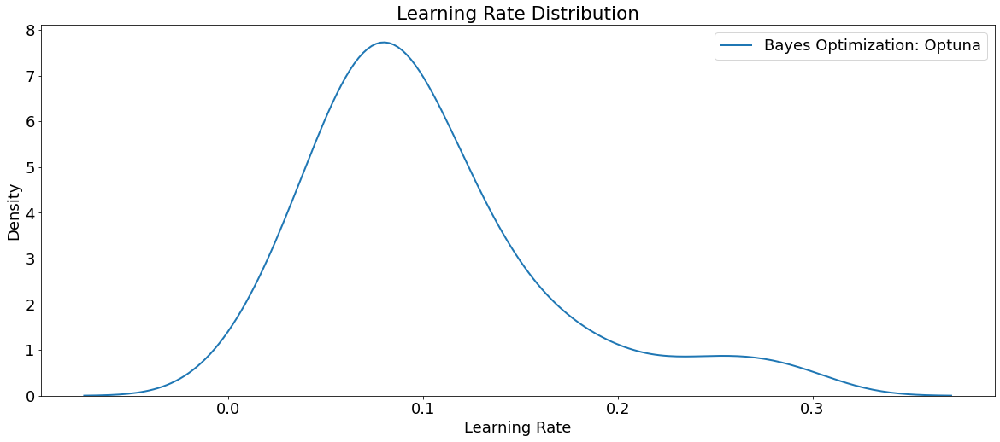

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); plt.title('Learning Rate Distribution');
plt.show()

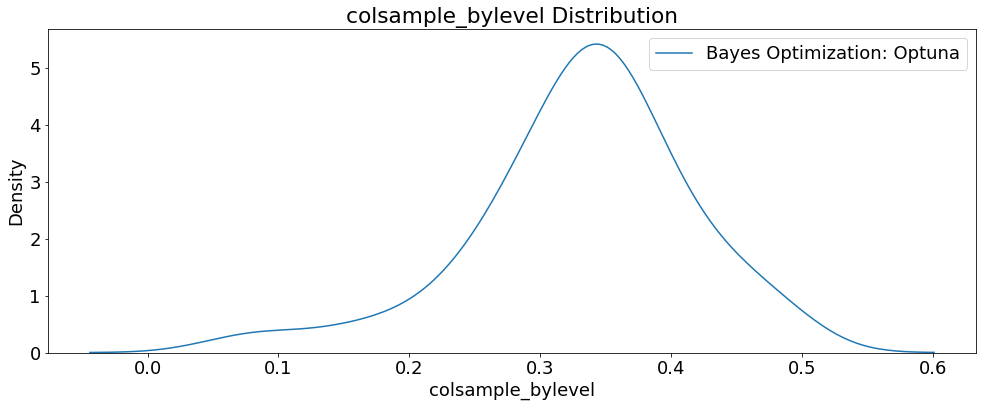

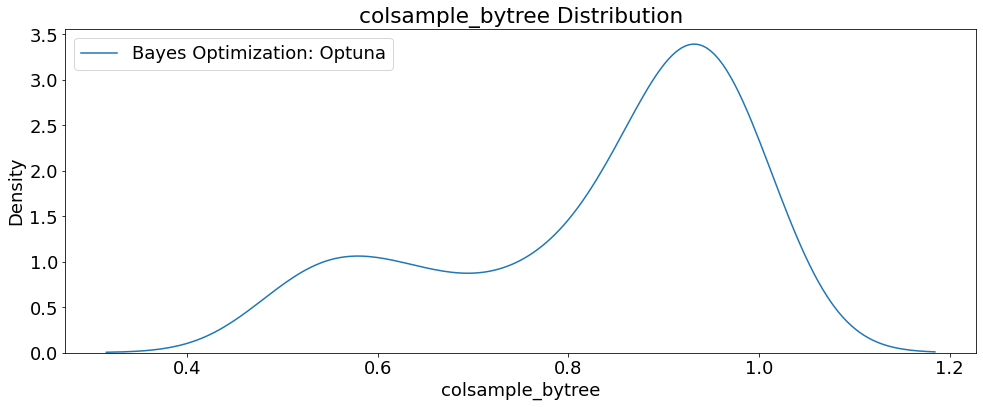

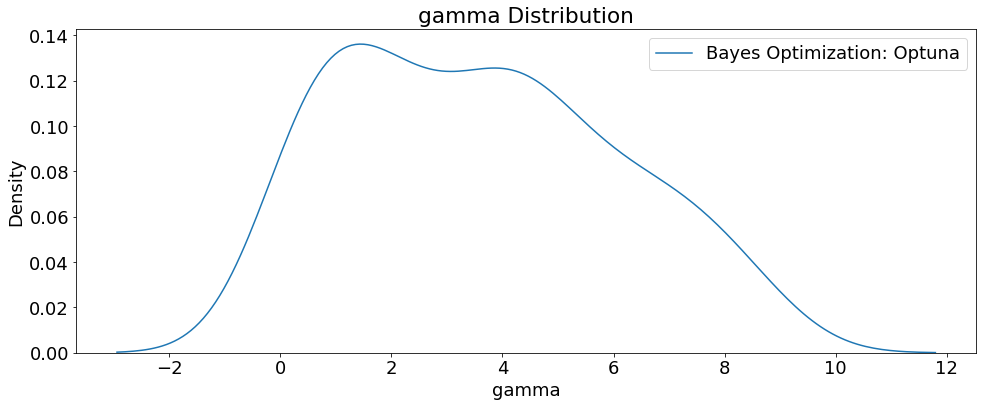

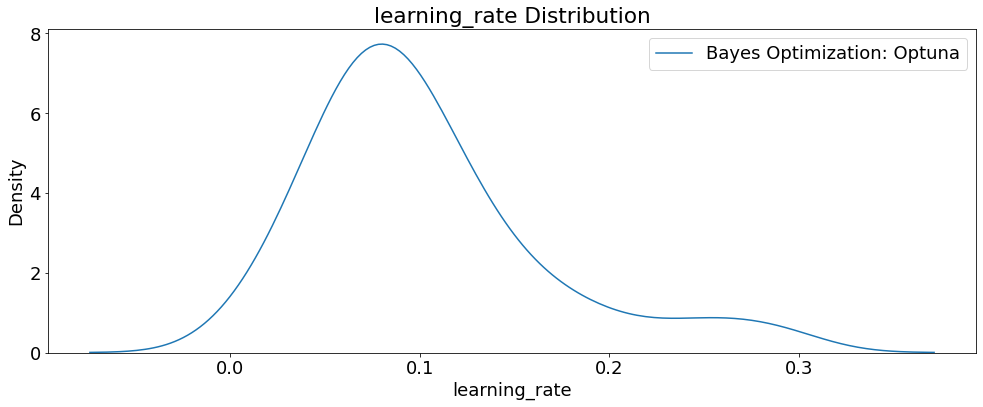

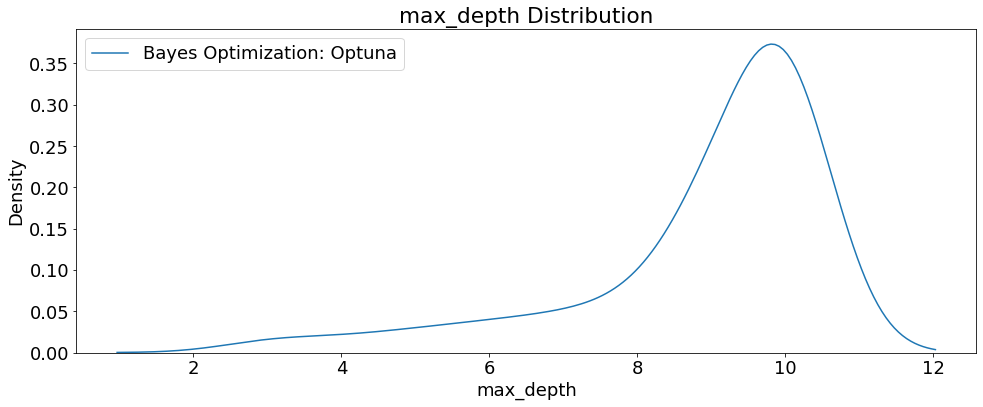

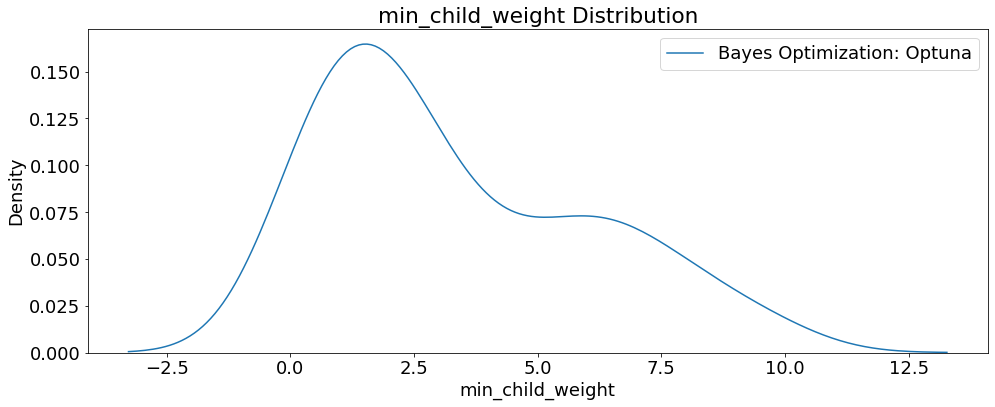

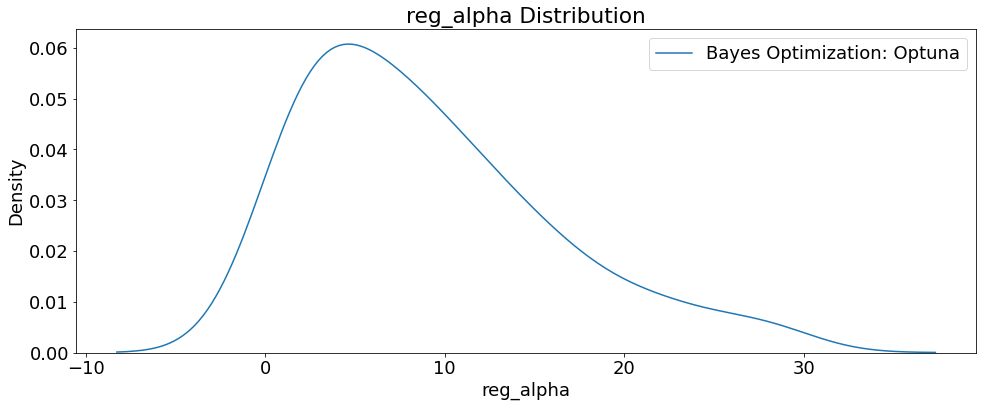

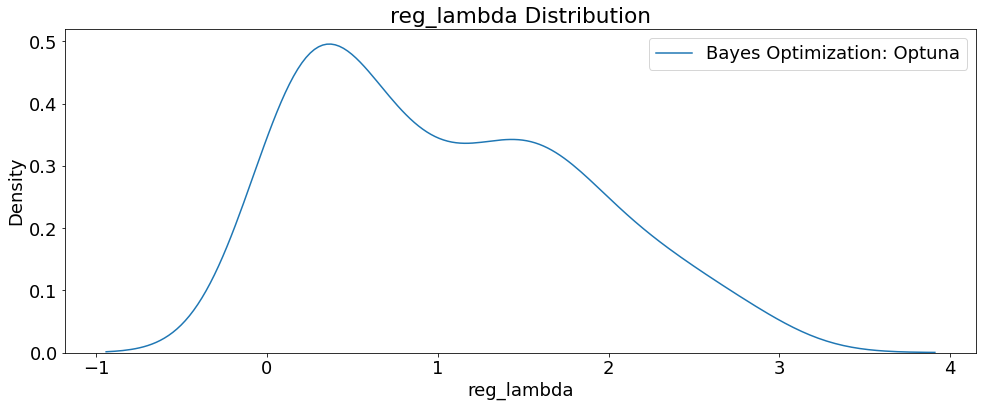

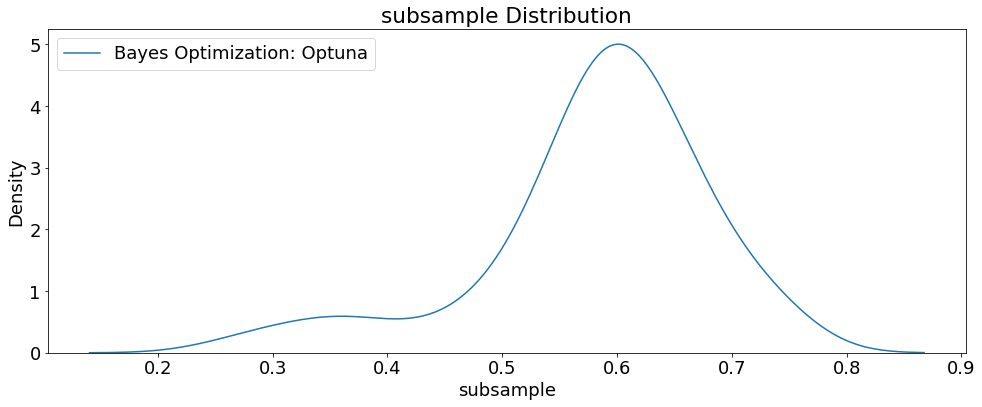

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

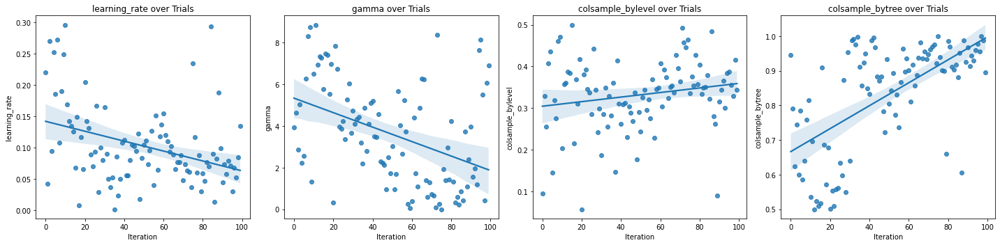

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
for i, hpo in enumerate(['learning_rate', 'gamma', 'colsample_bylevel',
                         'colsample_bytree']): 
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

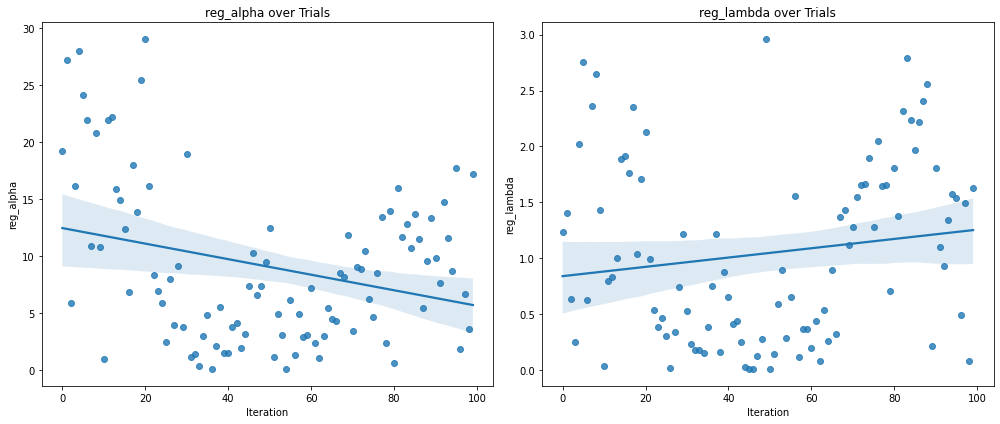

In [ ]:
# Scatterplot of regularization hyperparameters
fig, axs = plt.subplots(1, 2, figsize=(14,6))
i = 0
for i, hpo in enumerate(['reg_alpha', 'reg_lambda']): 
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_XGBoost_Optuna_100_GPU_wb.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params['metric'] = 'rmse'
params

{'n_estimators': 491,
 'max_depth': 10,
 'subsample': 0.6612772260020222,
 'gamma': 0.25849411490025,
 'learning_rate': 0.1171059100154484,
 'reg_alpha': 2.8838088972172806,
 'reg_lambda': 0.3652583552743427,
 'colsample_bytree': 0.896838236296416,
 'colsample_bylevel': 0.34619376535111884,
 'min_child_weight': 7,
 'random_state': 42,
 'metric': 'rmse'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = XGBRegressor(objective='reg:squarederror', 
                          booster='gbtree',
                          tree_method='gpu_hist', 
                          scale_pos_weight=1,
                          use_label_encoder=False,
                          random_state=seed_value,
                          verbosity=0, 
                          **params)

# Fit the model
best_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'XGB_Optuna_trials100_GPU_wb.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('XGB_Optuna_trials100_GPU_wb.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for XGBoost HPO 100 GPU trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(train_label, y_train_pred),
        mean_absolute_error(test_label, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred),
        mean_squared_error(test_label, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred, squared=False),
        mean_squared_error(test_label, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(train_label, y_train_pred),
        r2_score(test_label, y_test_pred)))


Model Metrics for XGBoost HPO 100 GPU trials
MAE train: 1286.121, test: 1727.713
MSE train: 3048248.100, test: 5583684.588
RMSE train: 1745.923, test: 2362.982
R^2 train: 0.967, test: 0.939


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 5583684.58781 MSE on the test set.
This was achieved using these conditions:
iteration                                    58
rmse                                2395.734684
datetime_start       2022-09-02 20:04:50.795242
datetime_complete    2022-09-02 20:05:14.496578
duration                 0 days 00:00:23.701336
colsample_bylevel                      0.346194
colsample_bytree                       0.896838
gamma                                  0.258494
learning_rate                          0.117106
max_depth                                    10
min_child_weight                              7
n_estimators                                491
reg_alpha                              2.883809
reg_lambda                             0.365258
subsample                              0.661277
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


<Figure size 432x288 with 0 Axes>

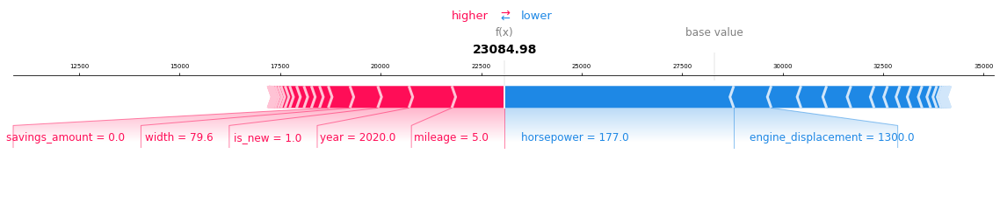

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_100_GPU_ShapForcePlot_TrainSet_wb.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

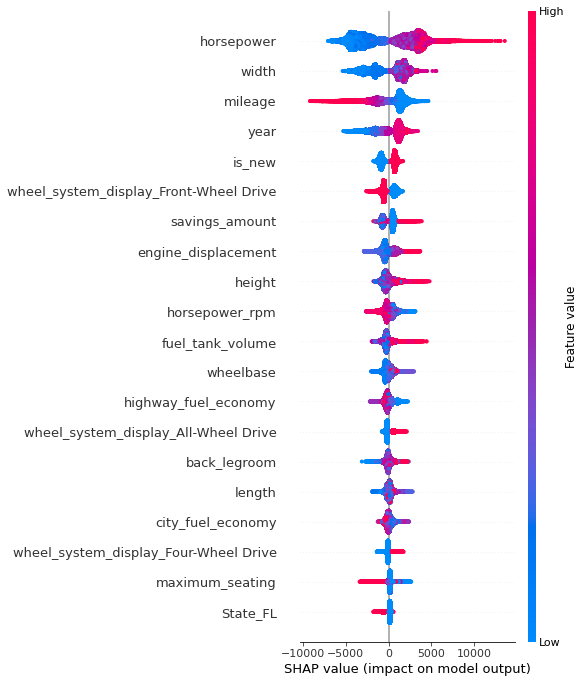

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_100_GPU_ShapSummary_TrainSet_wb.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

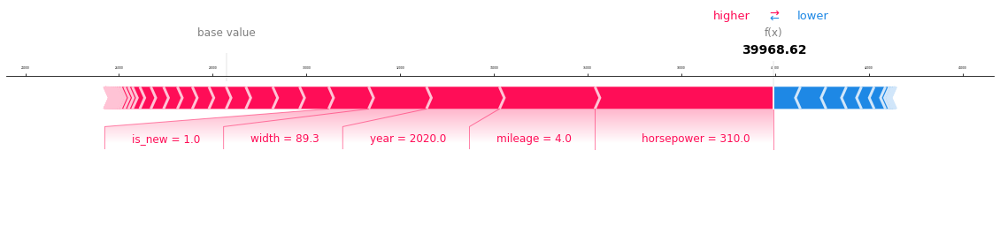

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('XGBoost_HPO_Optuna_100_GPU_ShapForcePlot_TestSet_wb.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

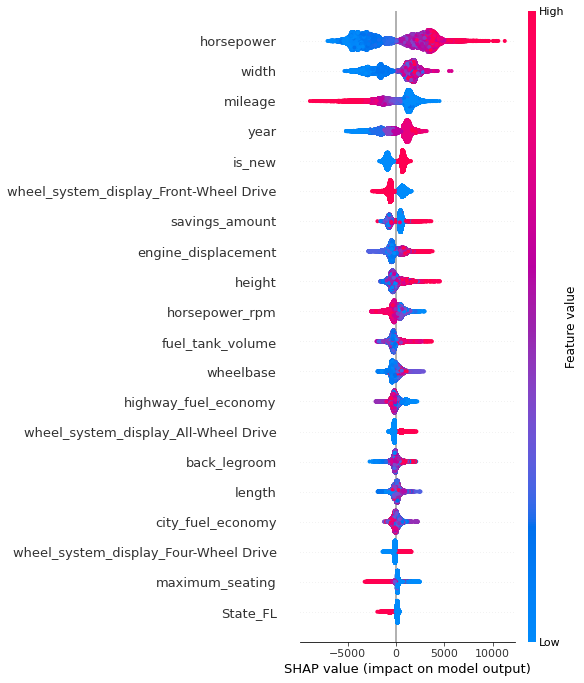

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('XGBoost_HPO_Optuna_100_GPU_ShapSummary_TestSet_wb.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     test_label)

In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)                                                                    

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file 
with open(r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_100_GPU_wb_WeightsExplain.htm',
          'wb') as f:
    f.write(html_obj.data.encode("UTF-8"))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/XGBoost/Optuna/Model_Explanations/best_bayes_Optuna_100_GPU_wb_WeightsExplain.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.3135 ± 0.0034,horsepower
0.1065 ± 0.0012,width
0.0831 ± 0.0017,year
0.0738 ± 0.0011,mileage
0.0487 ± 0.0005,height
0.0355 ± 0.0002,engine_displacement
0.0301 ± 0.0009,wheelbase
0.0281 ± 0.0007,maximum_seating
0.0262 ± 0.0003,length
0.0259 ± 0.0003,fuel_tank_volume


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Optuna_100_GPU_wb_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,horsepower,0.313509,0.001683
1,width,0.106526,0.000613
2,year,0.083071,0.000855
3,mileage,0.073805,0.000575
4,height,0.048655,0.000265
5,engine_displacement,0.035533,0.000118
6,wheelbase,0.030114,0.000460
7,maximum_seating,0.028101,0.000336
8,length,0.026200,0.000141
9,fuel_tank_volume,0.025917,0.000165


# NVIDIA RTX A4000 16GB